# Modelos Regresión Lineal y KNN

In [1]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tqdm import tqdm
import warnings

# Ignorar todos los warnings
warnings.filterwarnings("ignore")


In [2]:
# Función para procesar cada DataFrame
def process_dataframe(df, value):
    print(f"Procesando {value}")

    y = df['gasto_ejecutado']
    df_dummies = df.drop(columns=['gasto_ejecutado'])

    X= pd.get_dummies(df_dummies, columns=[
        'mes', 'moneda', 'gestoria', 'concepto', 
        'nivel_1_cuenta', 'vicepresidencia_direccion_cumpl'
        ])

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    X_train = X_train.sort_index(ascending=True)
    X_test = X_test.sort_index(ascending=True) 
    
    # Calcular la varianza de la variable objetivo
    target_variance = np.var(y)

    # Escalar los datos
    scaler = MinMaxScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    y_train_scaled = scaler.fit_transform(y_train.values.reshape(-1, 1)).flatten()
    y_test_scaled = scaler.transform(y_test.values.reshape(-1, 1)).flatten()

    # Buscar el k óptimo utilizando validación cruzada
    k_values = list(range(1, 100))
    mse_scores = []

    for k in k_values:
        knn_model = KNeighborsRegressor(n_neighbors=k)
        knn_model.fit(X_train, y_train)
        y_pred = knn_model.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        mse_scores.append(mse)

    #for k in k_values:
     #   knn_model = KNeighborsRegressor(n_neighbors=k)
      #  mse = -cross_val_score(knn_model, X_train_scaled, y_train_scaled, cv=5, scoring='neg_mean_squared_error').mean()
       # mse_scores.append(mse)

    best_k = k_values[np.argmin(mse_scores)]
    print(f"El mejor valor de k para {value} es: {best_k}")

    # Entrenar el modelo final con el k óptimo
    best_knn_model = KNeighborsRegressor(n_neighbors=best_k)
    best_knn_model.fit(X_train_scaled, y_train_scaled)

    # Predicciones finales
    y_pred_best_knn = best_knn_model.predict(X_test_scaled)

    # Evaluación del mejor modelo KNN
    mse_best_knn = mean_squared_error(y_test_scaled, y_pred_best_knn)
    mae_best_knn = mean_absolute_error(y_test_scaled, y_pred_best_knn)

    print(f"Mejor KNN - MSE: {mse_best_knn}, MAE: {mae_best_knn}")

    # Regresión Lineal para comparación
    lr_model = LinearRegression()
    lr_model.fit(X_train_scaled, y_train_scaled)
    y_pred_lr = lr_model.predict(X_test_scaled)
    mse_lr = mean_squared_error(y_test_scaled, y_pred_lr)
    mae_lr = mean_absolute_error(y_test_scaled, y_pred_lr)

    print(f"Regresión Lineal - MSE: {mse_lr}, MAE: {mae_lr}")

    # Comparar el MSE con la varianza
    if mse_best_knn < target_variance:
        print("El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.")
    else:
        print("El MSE del modelo KNN no es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría no estar capturando suficiente variabilidad inherente en los datos.")

    if mse_lr < target_variance:
        print("El MSE del modelo de Regresión Lineal es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.")
    else:
        print("El MSE del modelo de Regresión Lineal no es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría no estar capturando suficiente variabilidad inherente en los datos.")

    # Evaluación en el conjunto de entrenamiento
    y_pred_lr_train = lr_model.predict(X_train_scaled)
    y_pred_knn_train = best_knn_model.predict(X_train_scaled)

    mse_lr_train = mean_squared_error(y_train_scaled, y_pred_lr_train)
    mae_lr_train = mean_absolute_error(y_train_scaled, y_pred_lr_train)
    mse_knn_train = mean_squared_error(y_train_scaled, y_pred_knn_train)
    mae_knn_train = mean_absolute_error(y_train_scaled, y_pred_knn_train)

    print(f"Regresión Lineal (Train) - MSE: {mse_lr_train}, MAE: {mae_lr_train}")
    print(f"KNN (Train) - MSE: {mse_knn_train}, MAE: {mae_knn_train}")

    # Calcular la variación entre entrenamiento y prueba
    variacion_mse_lr = (mse_lr - mse_lr_train) / mse_lr_train
    variacion_mse_knn = (mse_best_knn - mse_knn_train) / mse_knn_train
    variacion_mae_lr = (mae_lr - mae_lr_train) / mae_lr_train
    variacion_mae_knn = (mae_best_knn - mae_knn_train) / mae_knn_train

    print(f"Variación MSE Regresión Lineal: {variacion_mse_lr}")
    print(f"Variación MSE KNN: {variacion_mse_knn}")
    print(f"Variación MAE Regresión Lineal: {variacion_mae_lr}")
    print(f"Variación MAE KNN: {variacion_mae_knn}")

    # Residuos y outliers
    residuals_lr = y_test_scaled - y_pred_lr
    std_lr = np.std(residuals_lr)
    outliers_lr = np.abs(residuals_lr) > 2 * std_lr

    residuals_best_knn = y_test_scaled - y_pred_best_knn
    std_best_knn = np.std(residuals_best_knn)
    outliers_best_knn = np.abs(residuals_best_knn) > 2 * std_best_knn

    # Usar los índices originales para los DataFrames de resultados
    resultados = pd.DataFrame()
    resultados['gasto_ejecutado'] = y_test
    resultados['pred_lr'] = y_pred_lr
    resultados['pred_best_knn'] = y_pred_best_knn
    resultados['residuals_lr'] = residuals_lr
    resultados['residuals_best_knn'] = residuals_best_knn
    resultados['outlier_lr'] = outliers_lr
    resultados['outlier_best_knn'] = outliers_best_knn

    # Contar los outliers detectados por los modelos
    num_outliers_lr = outliers_lr.sum()
    num_outliers_knn = outliers_best_knn.sum()
    print(f"Outliers detectados por Regresión Lineal: {num_outliers_lr}")
    print(f"Outliers detectados por KNN: {num_outliers_knn}")

    # Visualizar resultados y errores
    plt.figure(figsize=(10, 6))
    plt.scatter(resultados.index, resultados['gasto_ejecutado'], label='Valores Reales', alpha=0.5, color='blue')
    plt.scatter(resultados.index, resultados['pred_lr'], label='Predicciones LR', alpha=0.5, color='green')
    plt.scatter(resultados.index[resultados['outlier_lr']], resultados['gasto_ejecutado'][resultados['outlier_lr']], 
                label='Outliers LR', edgecolor='red', facecolor='none', s=100)
    plt.title(f'Regresión Lineal: Valores Reales vs. Predicciones ({value})')
    plt.xlabel('Índice')
    plt.ylabel('Gasto Ejecutado')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10, 6))
    plt.scatter(resultados.index, resultados['gasto_ejecutado'], label='Valores Reales', alpha=0.5, color='blue')
    plt.scatter(resultados.index, resultados['pred_best_knn'], label='Predicciones Mejor KNN', alpha=0.5, color='green')
    plt.scatter(resultados.index[resultados['outlier_best_knn']], resultados['gasto_ejecutado'][resultados['outlier_best_knn']], 
                label='Outliers KNN', edgecolor='red', facecolor='none', s=100)
    plt.title(f'Mejor KNN: Valores Reales vs. Predicciones ({value})')
    plt.xlabel('Índice')
    plt.ylabel('Gasto Ejecutado')
    plt.legend()
    plt.show()
    return num_outliers_knn, num_outliers_lr, best_k


In [3]:
# Función para procesar cada DataFrame
def process_dataframe_completo(df, value, best_k):
    print(f"Procesando {value}")

    y = df['gasto_ejecutado']
    df_dummies = df.drop(columns=['gasto_ejecutado'])

    X= pd.get_dummies(df_dummies, columns=[
        'mes', 'moneda', 'gestoria', 'concepto', 
        'nivel_1_cuenta', 'vicepresidencia_direccion_cumpl'
        ])

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    X_train = X_train.sort_index(ascending=True)

    # Calcular la varianza de la variable objetivo
    target_variance = np.var(y)

    # Escalar los datos
    scaler = MinMaxScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    y_train_scaled = scaler.fit_transform(y_train.values.reshape(-1, 1)).flatten()

    X_scaled = scaler.fit_transform(X)
    y_scaled = scaler.fit_transform(y.values.reshape(-1, 1)).flatten()

    # Entrenar el modelo final con el k óptimo
    best_knn_model = KNeighborsRegressor(best_k[value][0])
    best_knn_model.fit(X_train_scaled, y_train_scaled)

    # Predicciones finales
    y_pred_best_knn = best_knn_model.predict(X_scaled)

    # Evaluación del mejor modelo KNN
    mse_best_knn = mean_squared_error(y_scaled, y_pred_best_knn)
    mae_best_knn = mean_absolute_error(y_scaled, y_pred_best_knn)
    
    print(f"Mejor KNN - MSE: {mse_best_knn}, MAE: {mae_best_knn}")

    # Comparar el MSE con la varianza
    if mse_best_knn < target_variance:
        print("El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.")
    else:
        print("El MSE del modelo KNN no es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría no estar capturando suficiente variabilidad inherente en los datos.")
    
    # Residuos y outliers
    residuals_best_knn = y_scaled - y_pred_best_knn
    std_best_knn = np.std(residuals_best_knn)
    outliers_best_knn = np.abs(residuals_best_knn) > 3 * std_best_knn

    # Usar los índices originales para los DataFrames de resultados
    resultados = pd.DataFrame()
    resultados['gasto_ejecutado'] = y
    resultados['pred_best_knn'] = y_pred_best_knn
    resultados['residuals_best_knn'] = residuals_best_knn
    resultados['outlier_best_knn'] = outliers_best_knn

    # Contar los outliers detectados por los modelos
    num_outliers_knn = outliers_best_knn.sum()
    print(f"Outliers detectados por KNN: {num_outliers_knn}")

    # Crear DataFrames para datos con y sin outliers
    datos_sin_outliers_knn = resultados[~resultados['outlier_best_knn']]
    datos_outliers_knn = resultados[resultados['outlier_best_knn']]

    # Concatenar los DataFrames en los DataFrames finales
    global final_data_sin_outliers_knn 
    global final_data_outliers_knn 

    final_data_sin_outliers_knn = pd.concat([final_data_sin_outliers_knn, datos_sin_outliers_knn])
    final_data_outliers_knn = pd.concat([final_data_outliers_knn, datos_outliers_knn])

    # # Guardar los DataFrames individuales en CSV
    # datos_sin_outliers_knn.to_csv(f'datos_sin_outliers_knn_{value}.csv', index=True)
    # datos_outliers_knn.to_csv(f'datos_outliers_knn_{value}.csv', index=True)

    # Visualizar resultados y errores
    plt.figure(figsize=(10, 6))
    plt.scatter(resultados.index, resultados['gasto_ejecutado'], label='Valores Reales', alpha=0.5, color='blue')
    plt.scatter(resultados.index, resultados['pred_best_knn'], label='Predicciones Mejor KNN', alpha=0.5, color='green')
    plt.scatter(resultados.index[resultados['outlier_best_knn']], resultados['gasto_ejecutado'][resultados['outlier_best_knn']], 
                label='Outliers KNN', edgecolor='red', facecolor='none', s=100)
    plt.title(f'Mejor KNN: Valores Reales vs. Predicciones ({value})')
    plt.xlabel('Índice')
    plt.ylabel('Gasto Ejecutado')
    plt.legend()
    plt.show()
    return num_outliers_knn

In [4]:
# Cargar los datos
df = pd.read_csv("base_distancia_limpia.csv")
df.set_index("Unnamed: 0", inplace=True)

In [5]:
# Seleccionar las columnas especificadas
df = df[[
    "mes", "moneda", "gestoria", "concepto", "nivel_1_cuenta",
    "vicepresidencia_direccion_cumpl", "gasto_ejecutado"
]]

In [6]:
df = df[df['nivel_1_cuenta'] != 'Sin descripcion']

In [7]:
cuentas_conteo = df['nivel_1_cuenta'].value_counts()

In [8]:
cuentas_conteo

nivel_1_cuenta
 Impuestos Y Contribuciones               146961
Diversos Otros                             62218
 Servicios De Aseo Y Vigilancia            37408
 Mantenimiento Y Reparaciones              35509
 Aportes A La Seguridad Social             31749
 Utiles Y Papeleria                        29619
 Otros                                     28246
 Transporte                                17550
 Vacaciones Legales Y Extralegales         13007
 Prima Legal Y Extralegal                  12723
 Cesantias E Intereses A Las Cesantías     12681
 Adecuación E Instalación                  12301
 Salarios                                  11528
 Arrendamientos                            10271
 Servicios Publicos                         5000
Honorarios Otros                            4031
 Gastos De Viaje                            3446
 Bonificaciones                             3439
 Garantías                                  3064
 Daños  Y Riesgos Operacionales             1801
 Ries

In [9]:
# Aplicar la condición y cambiar los valores
df['nivel_1_cuenta'] = df['nivel_1_cuenta'].apply(lambda x: 'Cuentas_menos_100_reg' if cuentas_conteo[x] < 100 else x)

In [10]:
# Crear DataFrames separados para cada valor único en 'nivel_1_cuenta'
unique_values = df['nivel_1_cuenta'].unique()
dataframes = {}

In [11]:
for value in tqdm(unique_values):
    dataframes[value] = df[df['nivel_1_cuenta'] == value]

  0%|          | 0/35 [00:00<?, ?it/s]

 20%|██        | 7/35 [00:00<00:00, 61.19it/s]

 40%|████      | 14/35 [00:00<00:00, 63.78it/s]

 60%|██████    | 21/35 [00:00<00:00, 65.13it/s]

 83%|████████▎ | 29/35 [00:00<00:00, 67.83it/s]

100%|██████████| 35/35 [00:00<00:00, 66.42it/s]

In [12]:
for i, item in tqdm(enumerate(list(df.concepto.unique()))):
    df['concepto'] = df['concepto'].str.replace(item, f'Conc {i}')  

0it [00:00, ?it/s]

2it [00:00, 12.57it/s]

4it [00:00, 13.57it/s]

6it [00:00, 13.96it/s]

8it [00:00, 13.84it/s]

10it [00:00, 13.24it/s]

12it [00:00, 12.66it/s]

14it [00:01, 13.86it/s]

16it [00:01, 14.85it/s]

18it [00:01, 15.00it/s]

20it [00:01, 15.57it/s]

22it [00:01, 16.36it/s]

24it [00:01, 16.97it/s]

26it [00:01, 17.58it/s]

28it [00:01, 18.06it/s]

30it [00:01, 18.13it/s]

32it [00:02, 18.49it/s]

35it [00:02, 18.80it/s]

37it [00:02, 18.94it/s]

39it [00:02, 19.09it/s]

41it [00:02, 19.01it/s]

43it [00:02, 19.04it/s]

45it [00:02, 19.00it/s]

47it [00:02, 19.15it/s]

49it [00:02, 19.16it/s]

51it [00:03, 19.20it/s]

53it [00:03, 18.98it/s]

55it [00:03, 19.27it/s]

57it [00:03, 19.39it/s]

59it [00:03, 13.29it/s]

61it [00:03, 14.70it/s]

63it [00:03, 15.89it/s]

66it [00:03, 17.22it/s]

68it [00:04, 17.84it/s]

68it [00:04, 16.80it/s]

In [13]:
for i, item in tqdm(enumerate(list(df.vicepresidencia_direccion_cumpl.unique()))):
    df['vicepresidencia_direccion_cumpl'] = df['vicepresidencia_direccion_cumpl'].str.replace(item, f'Vice {i}')  

0it [00:00, ?it/s]

1it [00:00,  9.20it/s]

3it [00:00, 12.92it/s]

5it [00:00, 14.41it/s]

7it [00:00, 14.57it/s]

9it [00:00, 14.95it/s]

11it [00:00, 15.28it/s]

13it [00:00, 14.18it/s]

15it [00:01, 15.29it/s]

17it [00:01, 15.74it/s]

19it [00:01, 16.41it/s]

21it [00:01, 16.57it/s]

23it [00:01, 16.59it/s]

25it [00:01, 17.10it/s]

27it [00:01, 16.47it/s]

29it [00:01, 17.05it/s]

31it [00:01, 17.47it/s]

33it [00:02, 17.63it/s]

35it [00:02, 17.71it/s]

37it [00:02, 13.65it/s]

39it [00:02, 14.84it/s]

41it [00:02, 15.58it/s]

43it [00:02, 16.29it/s]

45it [00:02, 16.90it/s]

47it [00:02, 17.35it/s]

49it [00:03, 17.96it/s]

51it [00:03, 17.79it/s]

53it [00:03, 17.99it/s]

55it [00:03, 17.09it/s]

57it [00:03, 17.86it/s]

60it [00:03, 18.73it/s]

63it [00:03, 19.13it/s]

65it [00:03, 19.29it/s]

68it [00:04, 19.71it/s]

70it [00:04, 19.63it/s]

72it [00:04, 19.61it/s]

74it [00:04, 19.66it/s]

77it [00:04, 19.81it/s]

79it [00:04, 19.82it/s]

81it [00:04, 13.81it/s]

81it [00:04, 16.65it/s]

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 489372 entries, 0 to 571917
Data columns (total 7 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   mes                              489372 non-null  int64  
 1   moneda                           489372 non-null  object 
 2   gestoria                         489372 non-null  object 
 3   concepto                         489372 non-null  object 
 4   nivel_1_cuenta                   489372 non-null  object 
 5   vicepresidencia_direccion_cumpl  489372 non-null  object 
 6   gasto_ejecutado                  489372 non-null  float64
dtypes: float64(1), int64(1), object(5)
memory usage: 29.9+ MB


In [15]:
# Convertir el array a lista 
lista_unique_values = unique_values.tolist()

# Crear un diccionario con claves del array y listas vacías como valores
best_knn_cuenta = {clave: [] for clave in lista_unique_values}

# DataFrames finales
final_data_sin_outliers = pd.DataFrame()
final_data_outliers = pd.DataFrame()


  0%|          | 0/35 [00:00<?, ?it/s]

Procesando  Utiles Y Papeleria


El mejor valor de k para  Utiles Y Papeleria es: 79


Mejor KNN - MSE: 0.008555213171475826, MAE: 0.056330528898740025
Regresión Lineal - MSE: 1.292269196439868e+17, MAE: 5545359.208665942
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal no es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría no estar capturando suficiente variabilidad inherente en los datos.


Regresión Lineal (Train) - MSE: 0.008672137663169564, MAE: 0.057942679786303866
KNN (Train) - MSE: 0.008906536667221611, MAE: 0.05730338920334345
Variación MSE Regresión Lineal: 1.4901391636437178e+19
Variación MSE KNN: -0.03944557900252607
Variación MAE Regresión Lineal: 95704223.05586977
Variación MAE KNN: -0.016977360643559664
Outliers detectados por Regresión Lineal: 2
Outliers detectados por KNN: 267


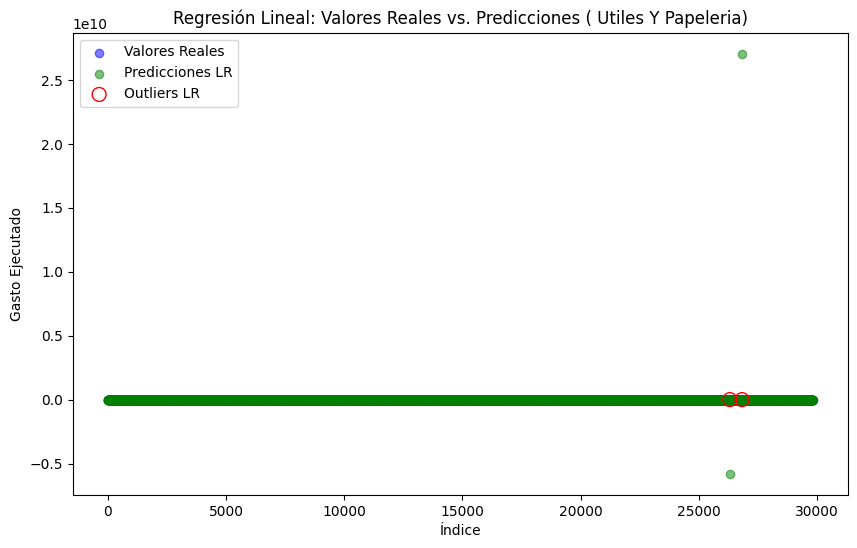

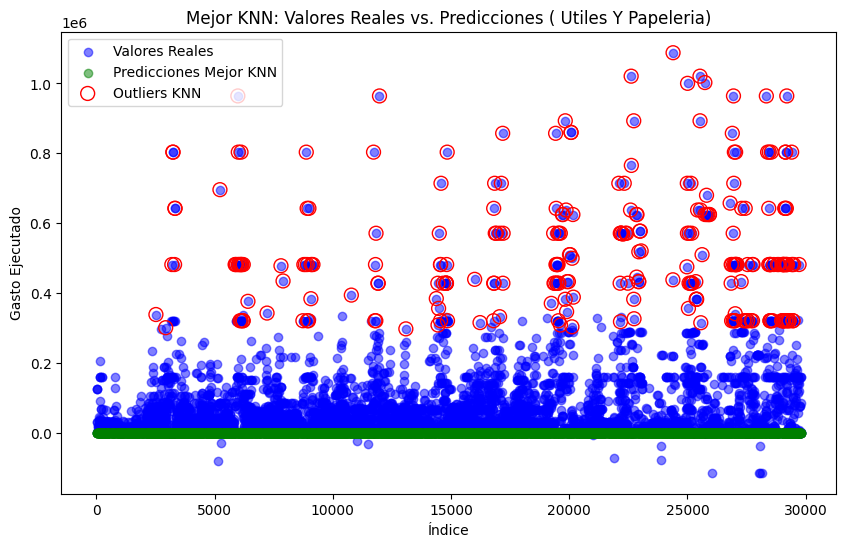

  3%|▎         | 1/35 [03:39<2:04:14, 219.25s/it]

Procesando  Transporte


El mejor valor de k para  Transporte es: 99
Mejor KNN - MSE: 0.003677177548760066, MAE: 0.02583596435836685
Regresión Lineal - MSE: 2.3264894942885584e+17, MAE: 8141360.599331463
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal no es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría no estar capturando suficiente variabilidad inherente en los datos.


Regresión Lineal (Train) - MSE: 0.0040918010871341505, MAE: 0.027559842576587678
KNN (Train) - MSE: 0.00411217393248451, MAE: 0.026360484564630183
Variación MSE Regresión Lineal: 5.685734581780475e+19
Variación MSE KNN: -0.10578258382704796
Variación MAE Regresión Lineal: 295406642.8045484
Variación MAE KNN: -0.01989797285316678
Outliers detectados por Regresión Lineal: 1
Outliers detectados por KNN: 108


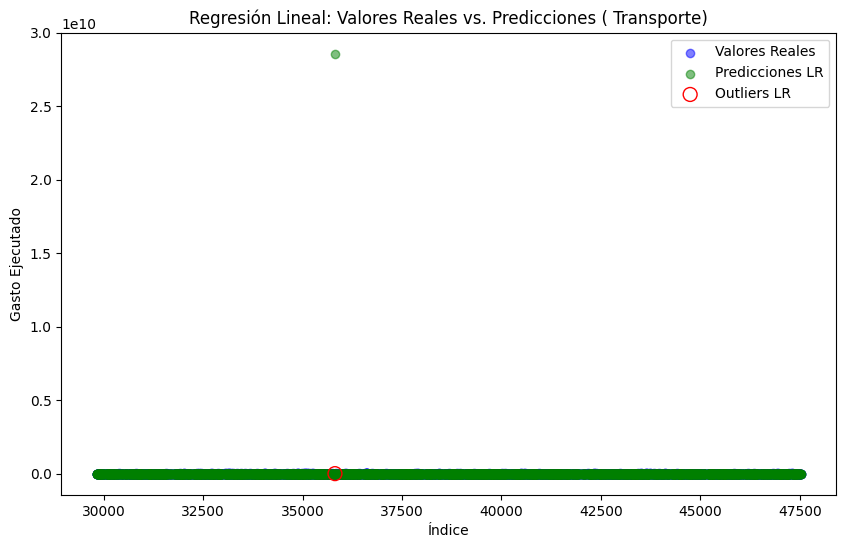

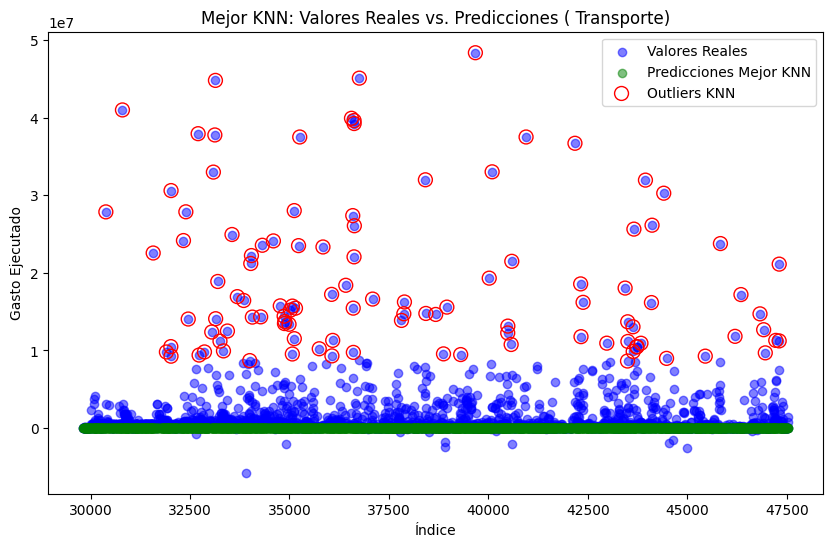

  6%|▌         | 2/35 [04:49<1:12:28, 131.78s/it]

Procesando  Aportes A La Seguridad Social


El mejor valor de k para  Aportes A La Seguridad Social es: 29


Mejor KNN - MSE: 0.006070884481593724, MAE: 0.04857971661390441
Regresión Lineal - MSE: 0.006051559241500055, MAE: 0.04933390939099709
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.


Regresión Lineal (Train) - MSE: 0.006055718755460649, MAE: 0.0494261165396554
KNN (Train) - MSE: 0.006106980621099412, MAE: 0.04886638304652653
Variación MSE Regresión Lineal: -0.0006868737021254552
Variación MSE KNN: -0.005910635999232997
Variación MAE Regresión Lineal: -0.0018655551986232301
Variación MAE KNN: -0.005866332123439205
Outliers detectados por Regresión Lineal: 306
Outliers detectados por KNN: 313


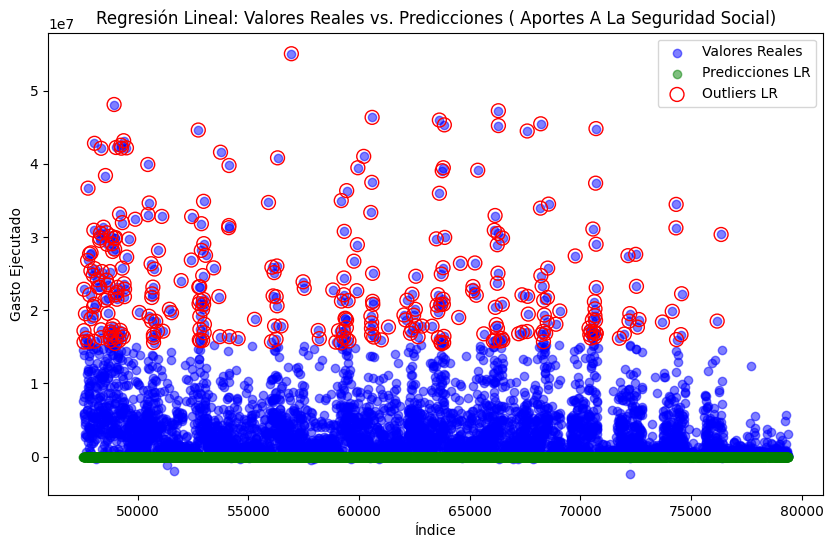

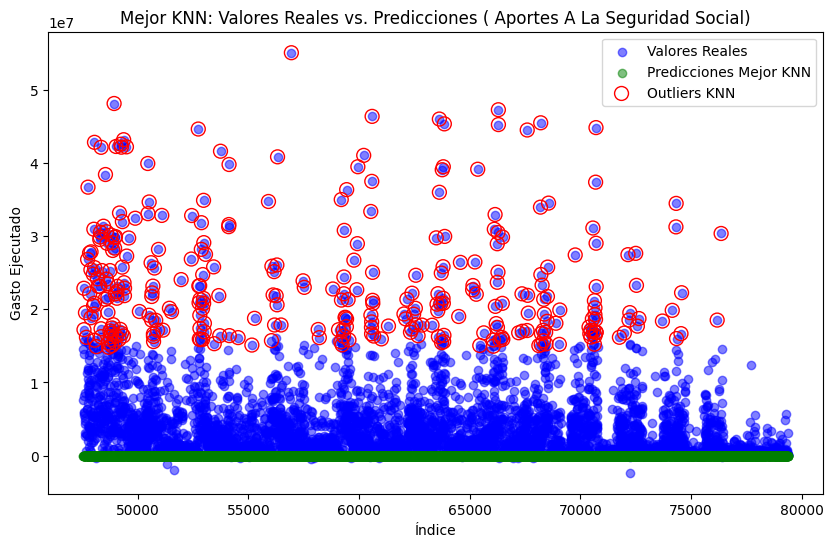

  9%|▊         | 3/35 [05:53<53:38, 100.58s/it]  

Procesando  Impuestos Y Contribuciones


El mejor valor de k para  Impuestos Y Contribuciones es: 62


Mejor KNN - MSE: 0.0019320933226494624, MAE: 0.016692914472297968
Regresión Lineal - MSE: 0.0018591474727574523, MAE: 0.013970740738790902
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.


Regresión Lineal (Train) - MSE: 0.0020945380936693474, MAE: 0.014595599517344439
KNN (Train) - MSE: 0.002159260711405905, MAE: 0.017263967013671177
Variación MSE Regresión Lineal: -0.11238306986316135
Variación MSE KNN: -0.10520609556616854
Variación MAE Regresión Lineal: -0.042811449972369825
Variación MAE KNN: -0.033077712725064747
Outliers detectados por Regresión Lineal: 576
Outliers detectados por KNN: 549


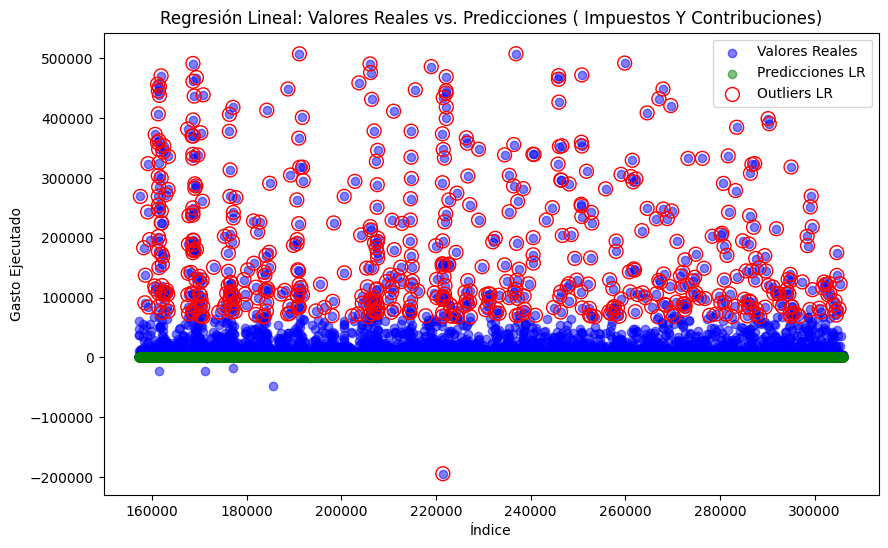

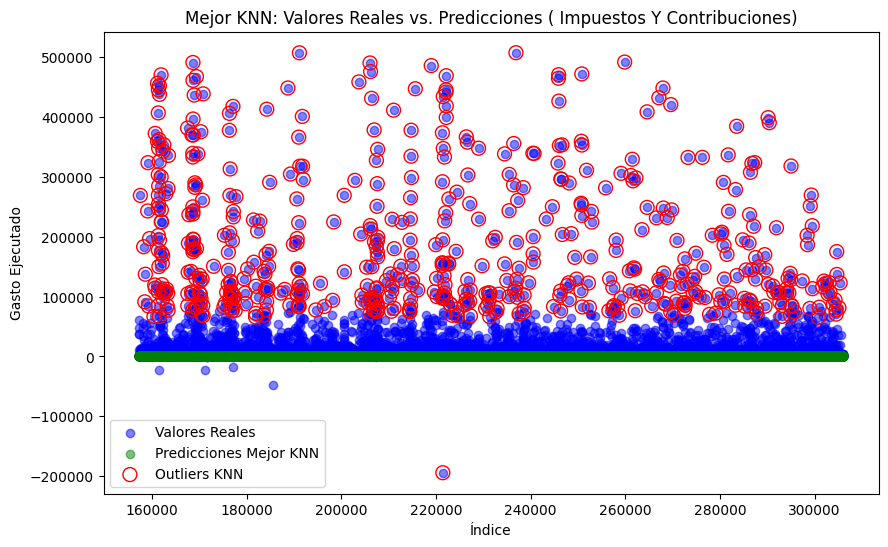

 11%|█▏        | 4/35 [1:29:08<17:30:15, 2032.76s/it]

Procesando  Adecuación E Instalación


El mejor valor de k para  Adecuación E Instalación es: 92
Mejor KNN - MSE: 0.0019723403172297463, MAE: 0.020965106007287945
Regresión Lineal - MSE: 0.0019712437784871312, MAE: 0.020284098291034378
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.


Regresión Lineal (Train) - MSE: 0.0022495500889071936, MAE: 0.020897136346847905
KNN (Train) - MSE: 0.002260673387797106, MAE: 0.021583952436388505
Variación MSE Regresión Lineal: -0.12371643191784205
Variación MSE KNN: -0.12754300206467392
Variación MAE Regresión Lineal: -0.029335983918485416
Variación MAE KNN: -0.028671599000433458
Outliers detectados por Regresión Lineal: 98
Outliers detectados por KNN: 98


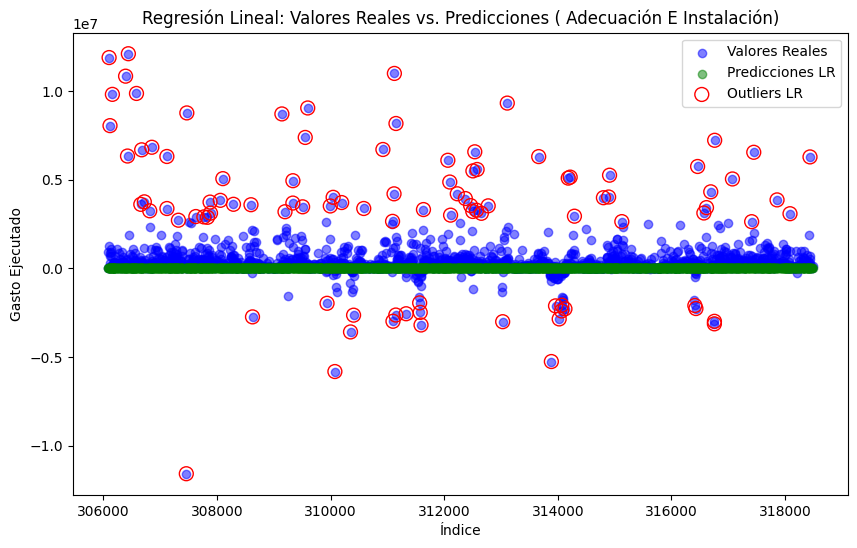

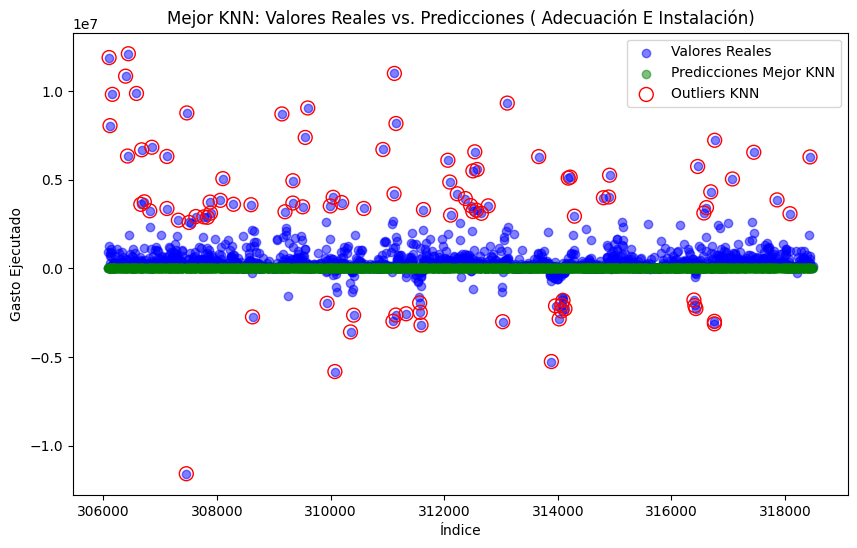

 14%|█▍        | 5/35 [1:29:37<10:55:14, 1310.48s/it]

Procesando  Mantenimiento Y Reparaciones


El mejor valor de k para  Mantenimiento Y Reparaciones es: 94


Mejor KNN - MSE: 0.0011111361572285353, MAE: 0.012695157450146282
Regresión Lineal - MSE: 1290698578073648.5, MAE: 426306.63573359704
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal no es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría no estar capturando suficiente variabilidad inherente en los datos.


Regresión Lineal (Train) - MSE: 0.0011669539702542336, MAE: 0.01092362336752131
KNN (Train) - MSE: 0.001189069282333381, MAE: 0.012910645602537197
Variación MSE Regresión Lineal: 1.1060406930981655e+18
Variación MSE KNN: -0.06554128196122672
Variación MAE Regresión Lineal: 39026118.94121972
Variación MAE KNN: -0.01669073406744028
Outliers detectados por Regresión Lineal: 1
Outliers detectados por KNN: 135


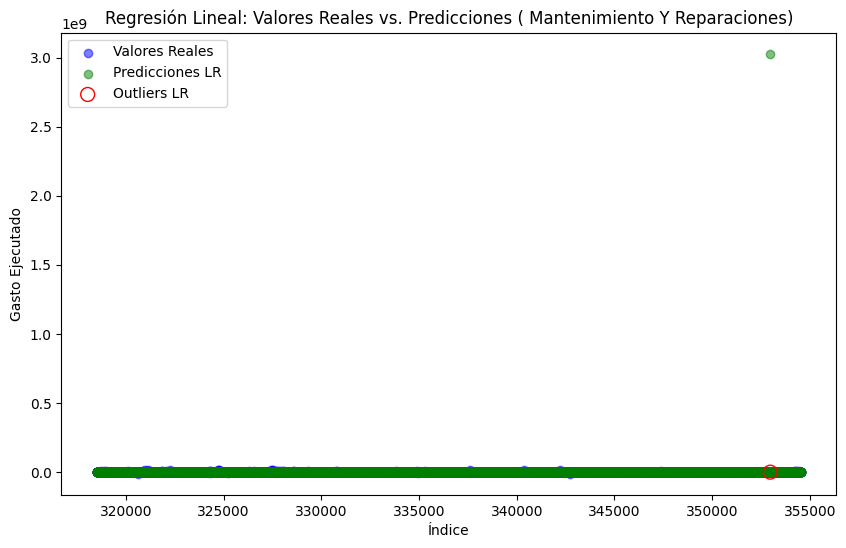

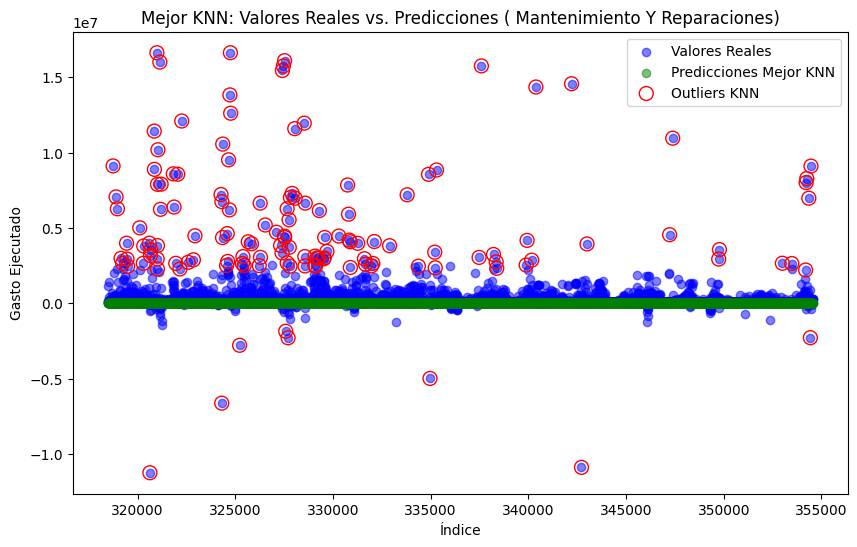

 17%|█▋        | 6/35 [1:34:43<7:48:18, 968.92s/it]  

Procesando  Arrendamientos


El mejor valor de k para  Arrendamientos es: 89
Mejor KNN - MSE: 0.0027743729240758156, MAE: 0.026815164708853197
Regresión Lineal - MSE: 6.366104113939652e+18, MAE: 96033266.53611441
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal no es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría no estar capturando suficiente variabilidad inherente en los datos.


Regresión Lineal (Train) - MSE: 0.0030227194540512676, MAE: 0.02729417399377777
KNN (Train) - MSE: 0.003052880804461109, MAE: 0.028112464528181058
Variación MSE Regresión Lineal: 2.1060850041532428e+21
Variación MSE KNN: -0.09122789202196026
Variación MAE Regresión Lineal: 3518452931.7763147
Variación MAE KNN: -0.04614678368121712
Outliers detectados por Regresión Lineal: 3
Outliers detectados por KNN: 124


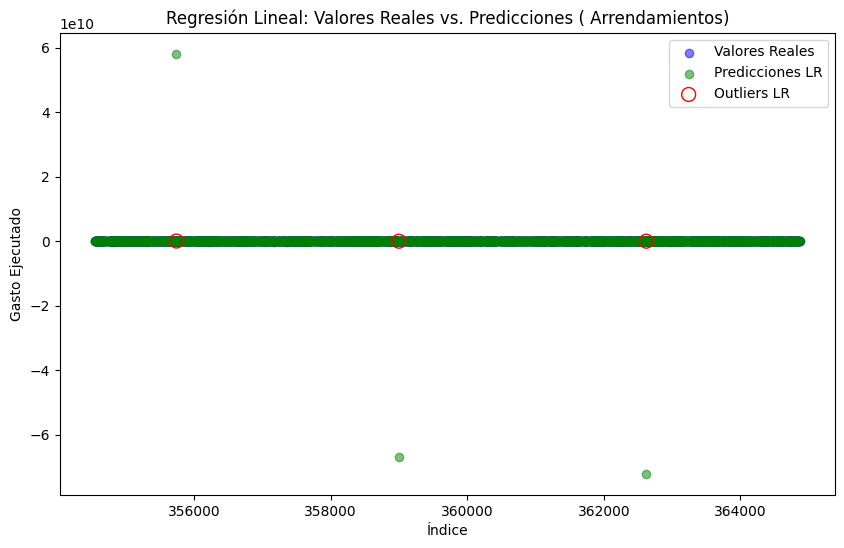

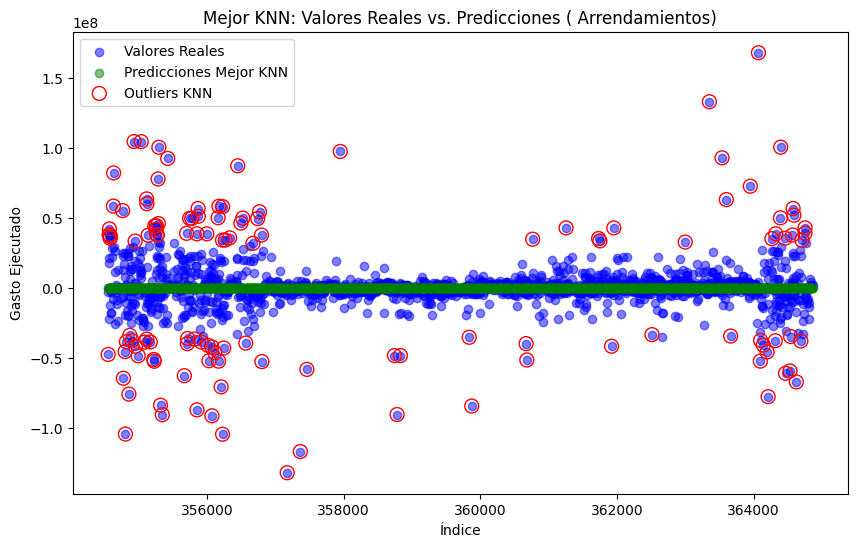

 20%|██        | 7/35 [1:35:10<5:08:26, 660.95s/it]

Procesando Diversos Otros


El mejor valor de k para Diversos Otros es: 98


Mejor KNN - MSE: 0.0016411307450205864, MAE: 0.011777486514202429


Regresión Lineal - MSE: 0.0016275837135239551, MAE: 0.01259047715624927
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.


Regresión Lineal (Train) - MSE: 0.0014723571655868531, MAE: 0.012190412767711874
KNN (Train) - MSE: 0.001482728071067537, MAE: 0.011426848970690679
Variación MSE Regresión Lineal: 0.10542723706257218
Variación MSE KNN: 0.10683191142324726
Variación MAE Regresión Lineal: 0.03281795261248458
Variación MAE KNN: 0.030685409810799015
Outliers detectados por Regresión Lineal: 365
Outliers detectados por KNN: 363


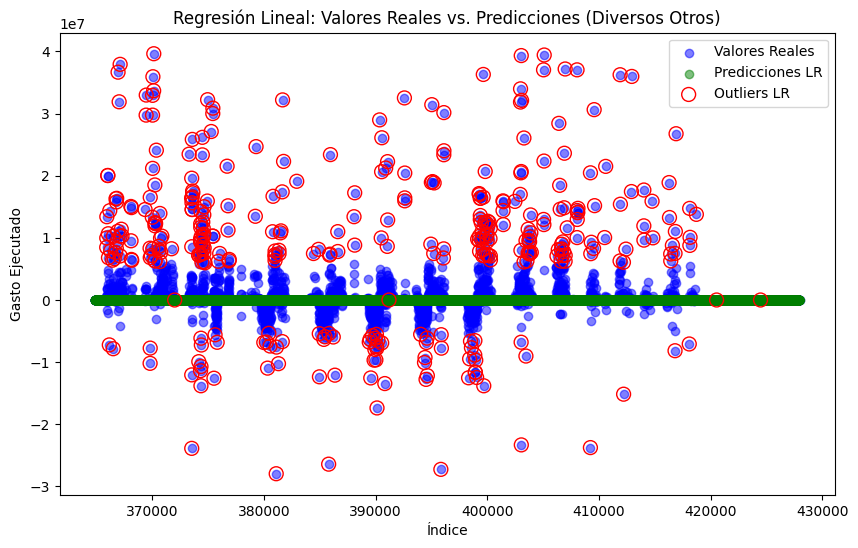

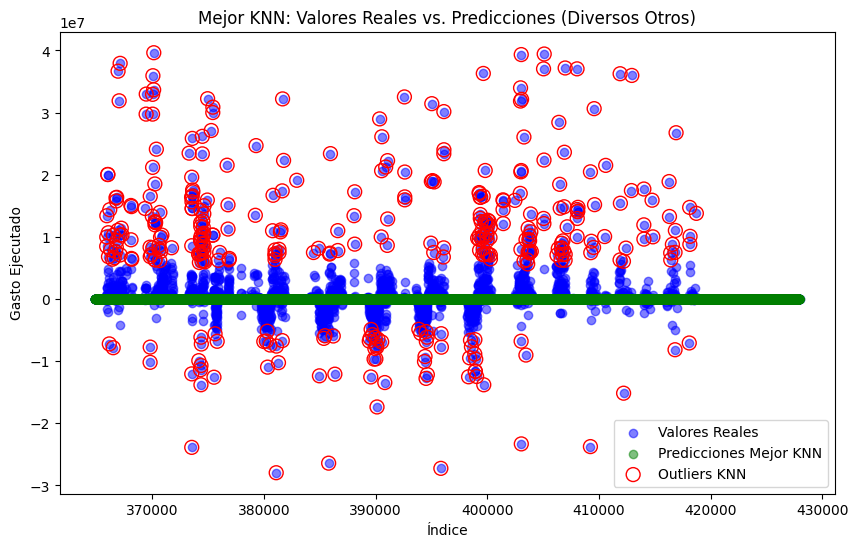

 23%|██▎       | 8/35 [1:52:49<5:54:23, 787.53s/it]

Procesando  Servicios De Aseo Y Vigilancia


El mejor valor de k para  Servicios De Aseo Y Vigilancia es: 82


Mejor KNN - MSE: 0.0043993753923747495, MAE: 0.03213184091735919
Regresión Lineal - MSE: 267523699679047.97, MAE: 189091.64955494853
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal no es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría no estar capturando suficiente variabilidad inherente en los datos.


Regresión Lineal (Train) - MSE: 0.00453668788724866, MAE: 0.03168730630643855
KNN (Train) - MSE: 0.004604825482362274, MAE: 0.03288275092405525
Variación MSE Regresión Lineal: 5.896894525871639e+16
Variación MSE KNN: -0.04461625978540424
Variación MAE Regresión Lineal: 5967424.811657805
Variación MAE KNN: -0.022835984995000388
Outliers detectados por Regresión Lineal: 1
Outliers detectados por KNN: 305


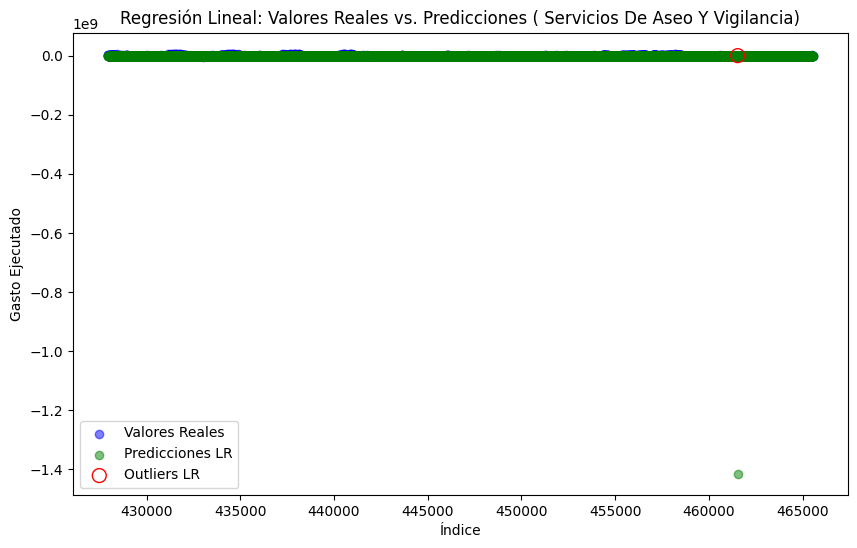

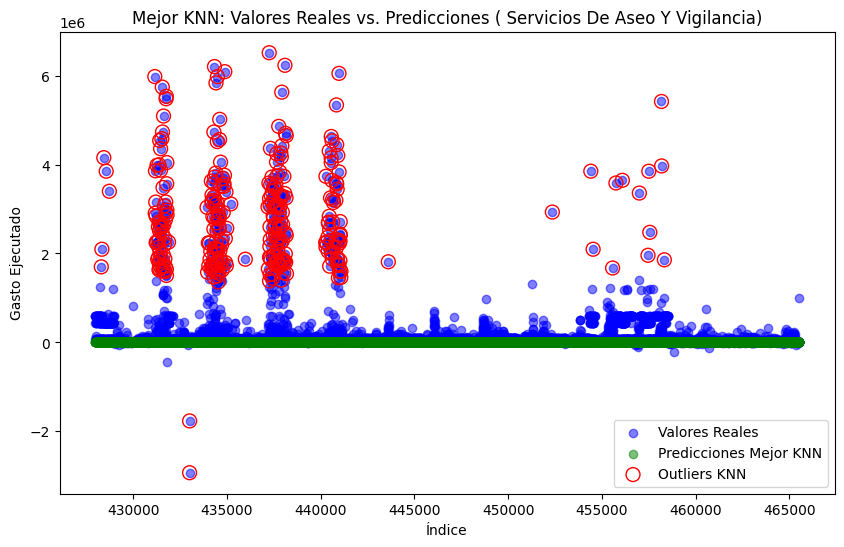

 26%|██▌       | 9/35 [2:00:11<4:54:26, 679.50s/it]

Procesando  Otros


El mejor valor de k para  Otros es: 56
Mejor KNN - MSE: 0.0033798234365373454, MAE: 0.032559302194144414


Regresión Lineal - MSE: 0.0033497673703150915, MAE: 0.030875631867187624
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.


Regresión Lineal (Train) - MSE: 0.0033029013197054856, MAE: 0.030498264439921655
KNN (Train) - MSE: 0.0033407033043590336, MAE: 0.032240316995229286
Variación MSE Regresión Lineal: 0.014189358407409185
Variación MSE KNN: 0.011710148616690053
Variación MAE Regresión Lineal: 0.012373406624804599
Variación MAE KNN: 0.009893984571005602
Outliers detectados por Regresión Lineal: 316
Outliers detectados por KNN: 305


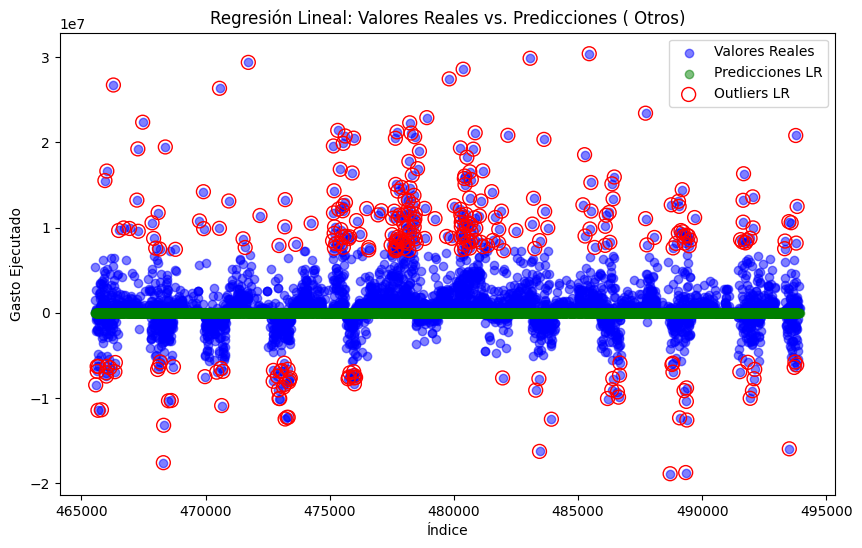

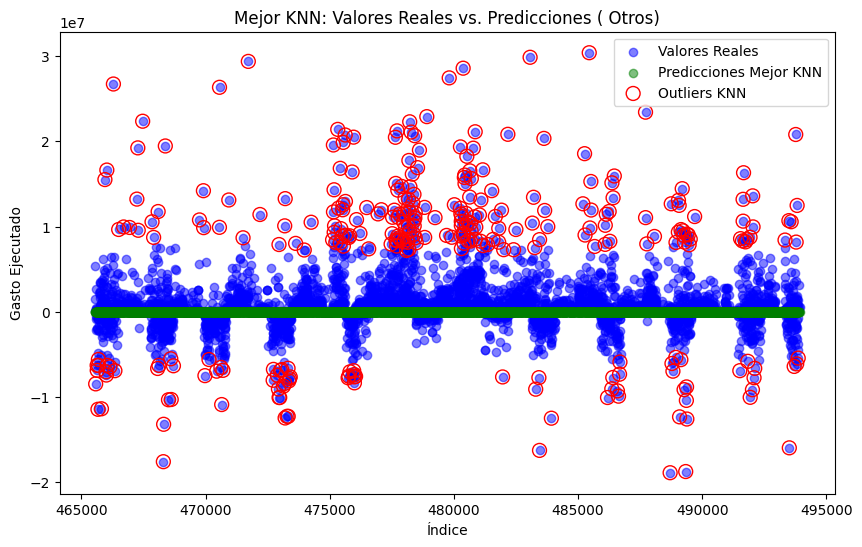

 29%|██▊       | 10/35 [2:03:26<3:40:53, 530.16s/it]

Procesando  Multas Y Sanciones


El mejor valor de k para  Multas Y Sanciones es: 55
Mejor KNN - MSE: 0.001406718056940989, MAE: 0.016638036339971525
Regresión Lineal - MSE: 0.0016108762112169827, MAE: 0.014813890352572747
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Regresión Lineal (Train) - MSE: 0.004716635758549885, MAE: 0.02308647924565389
KNN (Train) - MSE: 0.004968498443382904, MAE: 0.025301618865759146
Variación MSE Regresión Lineal: -0.6584692366170243
Variación MSE KNN: -0.7168725978339653
Variación MAE Regresión Lineal: -0.3583304671559431
Variación MAE KNN: -0.34241218207235374
Outliers detectados por Regresión Lineal: 5
Outliers detectados por KNN: 2


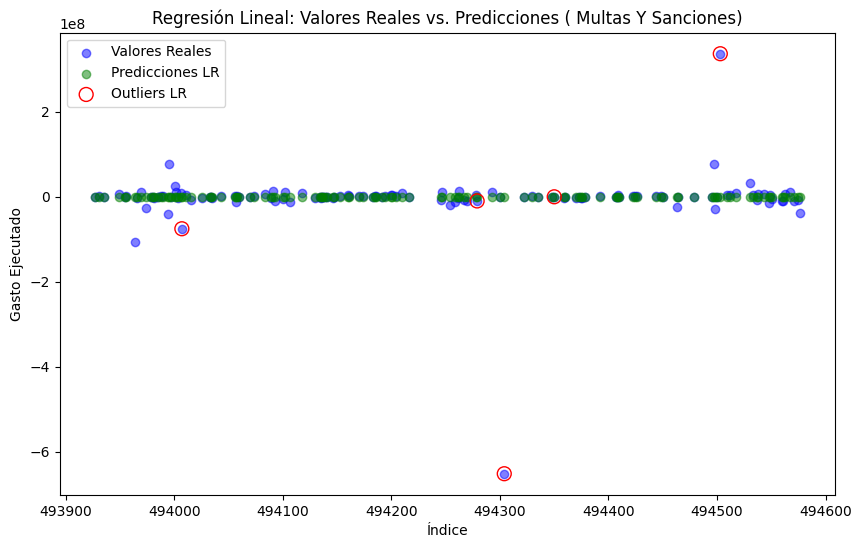

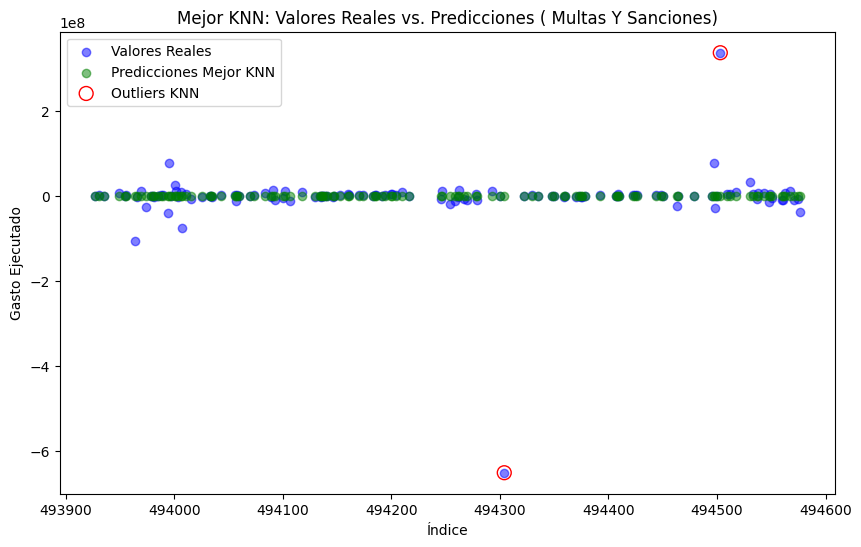

 31%|███▏      | 11/35 [2:03:27<2:27:13, 368.05s/it]

Procesando  Salarios


El mejor valor de k para  Salarios es: 50
Mejor KNN - MSE: 0.011889500642480334, MAE: 0.07329542930852115


Regresión Lineal - MSE: 1.257720877030233e+19, MAE: 73852037.8980676
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal no es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría no estar capturando suficiente variabilidad inherente en los datos.
Regresión Lineal (Train) - MSE: 0.010074862373410496, MAE: 0.0677788367489345
KNN (Train) - MSE: 0.010218255579117479, MAE: 0.06876132286396834
Variación MSE Regresión Lineal: 1.2483752436654628e+21
Variación MSE KNN: 0.16355483090267306
Variación MAE Regresión Lineal: 1089603206.1430993
Variación MAE KNN: 0.06593977916222911
Outliers detectados por Regresión Lineal: 1
Outliers detectados por KNN: 99


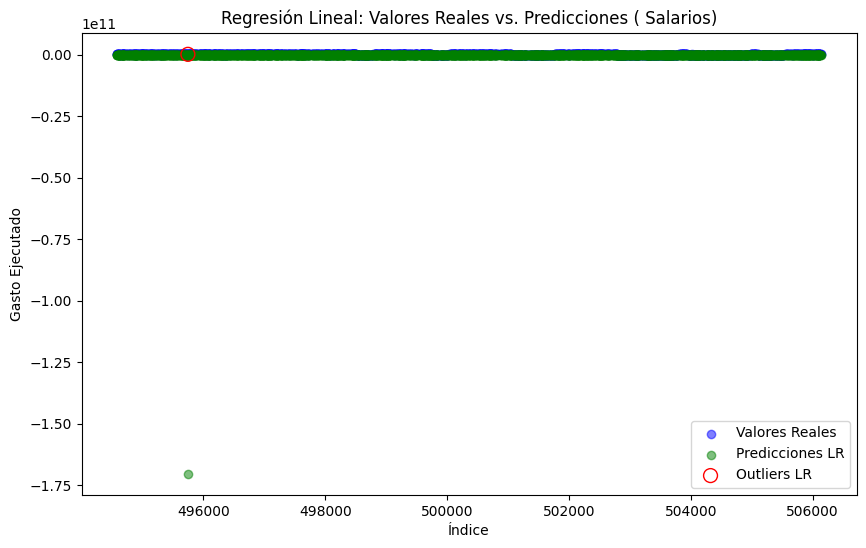

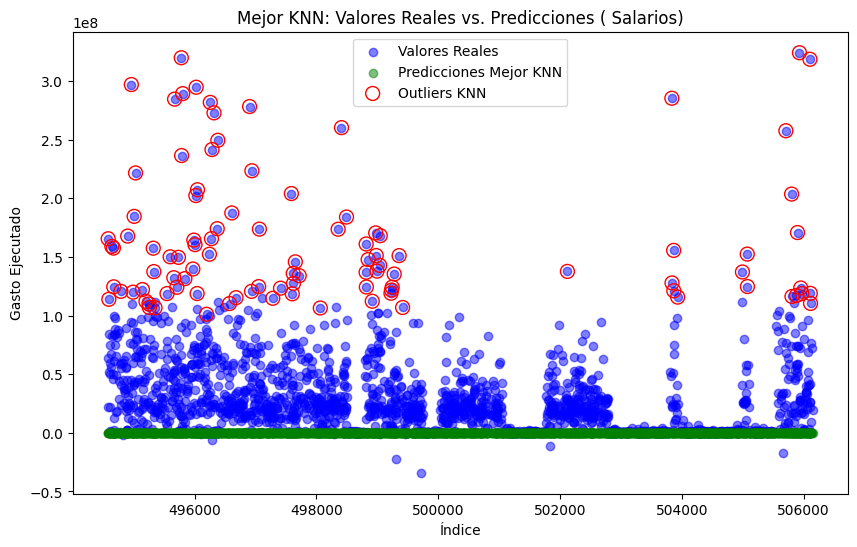

 34%|███▍      | 12/35 [2:04:00<1:42:01, 266.15s/it]

Procesando  Vacaciones Legales Y Extralegales


El mejor valor de k para  Vacaciones Legales Y Extralegales es: 64
Mejor KNN - MSE: 0.004020285416983749, MAE: 0.04111754756157336
Regresión Lineal - MSE: 0.004016231335033667, MAE: 0.042256247563377654
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.


Regresión Lineal (Train) - MSE: 0.0044884764015622625, MAE: 0.044268415140431526
KNN (Train) - MSE: 0.004505807024216839, MAE: 0.043241553775724695
Variación MSE Regresión Lineal: -0.10521277696017865
Variación MSE KNN: -0.10775463854168932
Variación MAE Regresión Lineal: -0.045453797491297715
Variación MAE KNN: -0.04911956275132106
Outliers detectados por Regresión Lineal: 116
Outliers detectados por KNN: 116


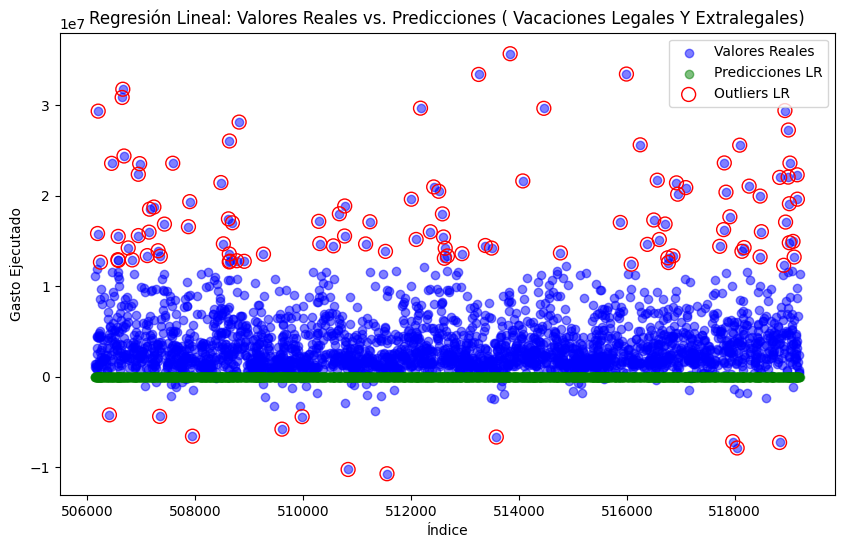

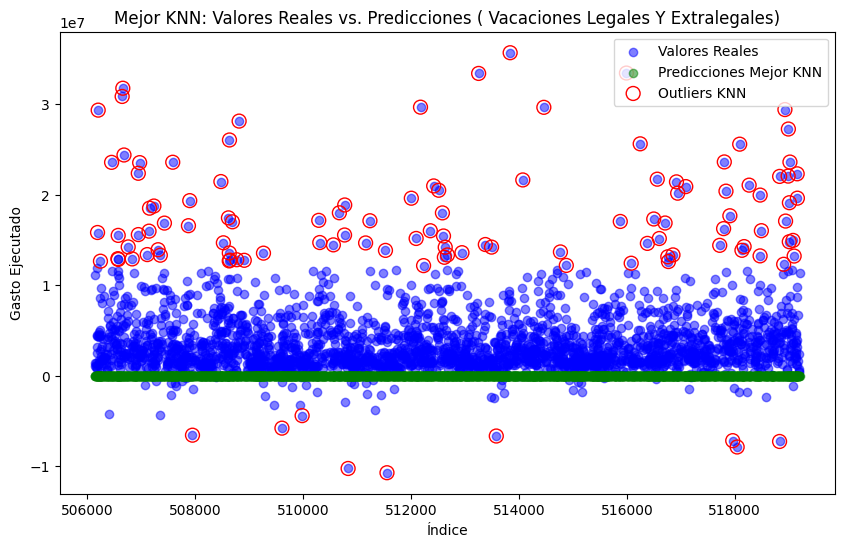

 37%|███▋      | 13/35 [2:04:20<1:10:14, 191.58s/it]

Procesando  Prima Legal Y Extralegal


El mejor valor de k para  Prima Legal Y Extralegal es: 12
Mejor KNN - MSE: 0.011695712837631192, MAE: 0.07090514479995425
Regresión Lineal - MSE: 0.011694167425381014, MAE: 0.07170170947017922
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.


Regresión Lineal (Train) - MSE: 0.011267283913226069, MAE: 0.07170222727677213
KNN (Train) - MSE: 0.011286205509896296, MAE: 0.07095020592856086
Variación MSE Regresión Lineal: 0.037886993479755014
Variación MSE KNN: 0.036283880120366444
Variación MAE Regresión Lineal: -7.221624942141124e-06
Variación MAE KNN: -0.0006351092011203202
Outliers detectados por Regresión Lineal: 115
Outliers detectados por KNN: 117


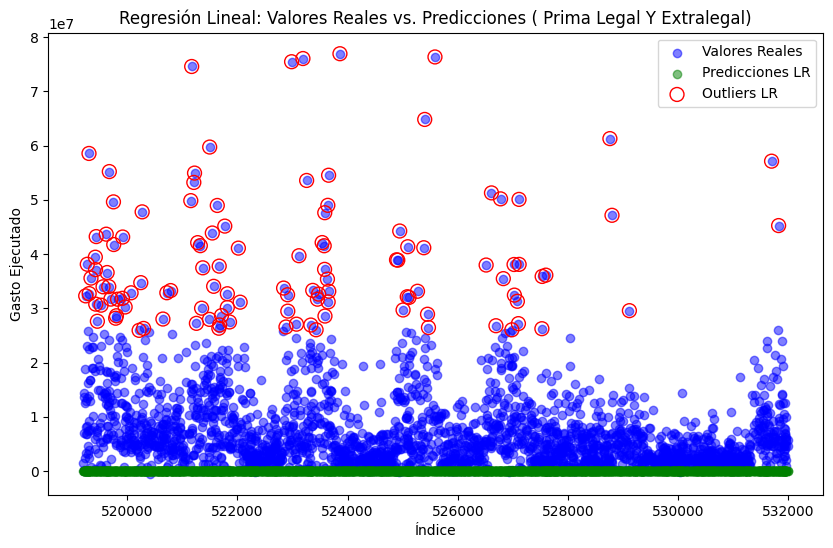

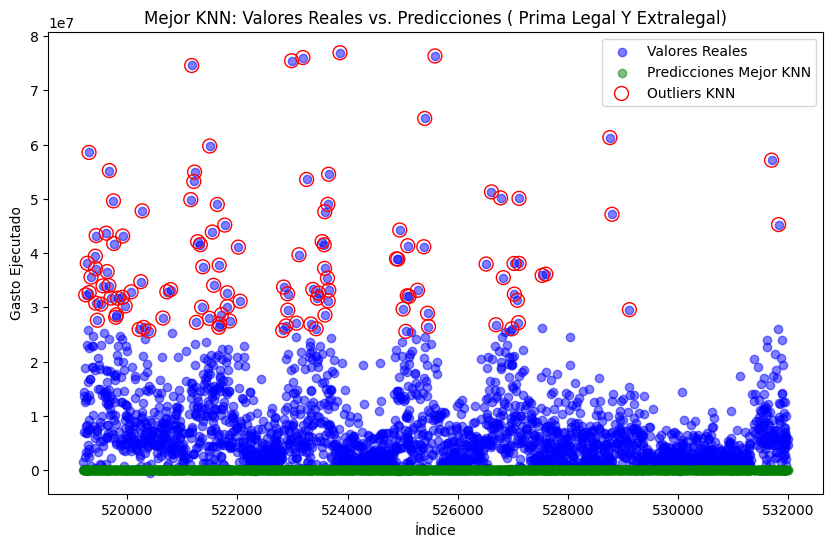

 40%|████      | 14/35 [2:04:35<48:20, 138.13s/it]  

Procesando  Bonificaciones


El mejor valor de k para  Bonificaciones es: 36
Mejor KNN - MSE: 0.005187079912867797, MAE: 0.05014899289858079
Regresión Lineal - MSE: 0.005195384944191248, MAE: 0.05010821312420902
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Regresión Lineal (Train) - MSE: 0.0043842585860550684, MAE: 0.047276120780142934
KNN (Train) - MSE: 0.004393380726040365, MAE: 0.04735942274117203
Variación MSE Regresión Lineal: 0.18500878591333872
Variación MSE KNN: 0.18065795712241214
Variación MAE Regresión Lineal: 0.05990534539068246
Variación MAE KNN: 0.05890211484743538
Outliers detectados por Regresión Lineal: 32
Outliers detectados por KNN: 32


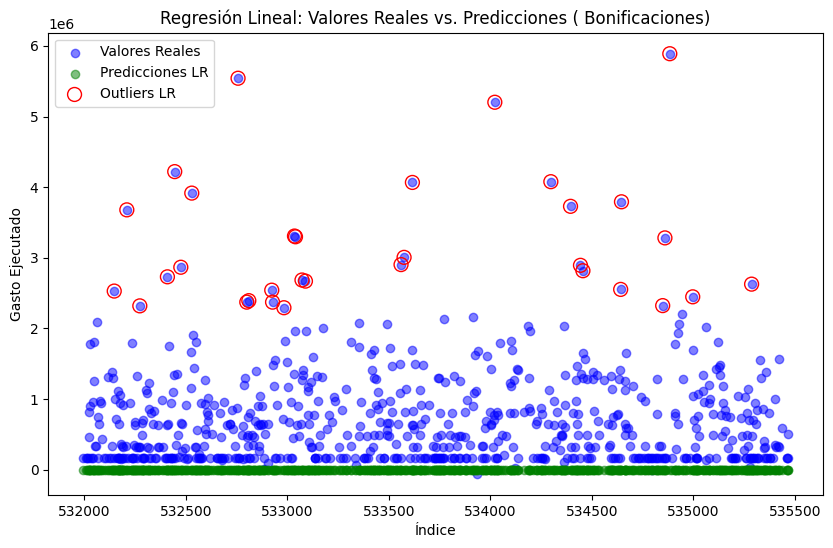

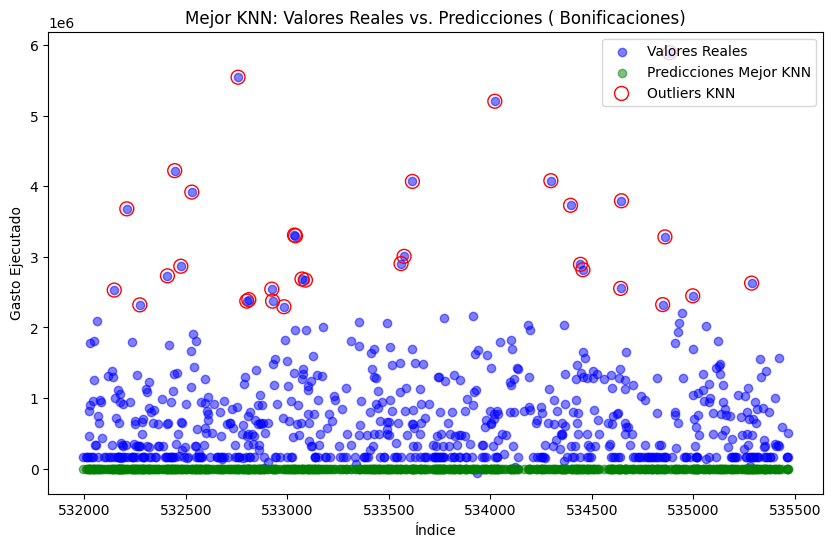

 43%|████▎     | 15/35 [2:04:37<32:27, 97.36s/it] 

Procesando Cuentas_menos_100_reg


El mejor valor de k para Cuentas_menos_100_reg es: 69
Mejor KNN - MSE: 0.025151212188132464, MAE: 0.038397221296709735
Regresión Lineal - MSE: 0.025701061737606785, MAE: 0.04088011372780784
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Regresión Lineal (Train) - MSE: 0.0031718491447179373, MAE: 0.013795907159894686
KNN (Train) - MSE: 0.0033116858839932215, MAE: 0.0138000130080613
Variación MSE Regresión Lineal: 7.102863839034281
Variación MSE KNN: 6.594685326195613
Variación MAE Regresión Lineal: 1.9632059170888119
Variación MAE KNN: 1.782404717610044
Outliers detectados por Regresión Lineal: 2
Outliers detectados por KNN: 2


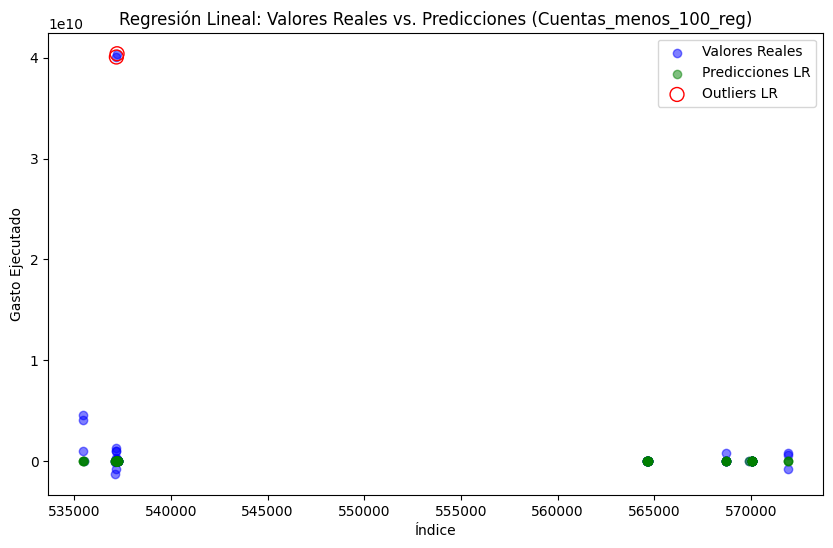

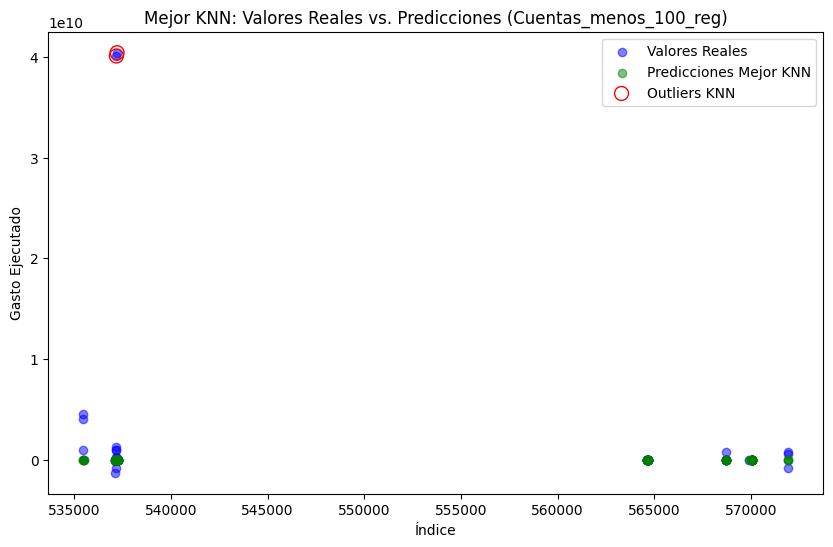

 46%|████▌     | 16/35 [2:04:38<21:38, 68.34s/it]

Procesando  Riesgo Operativo


El mejor valor de k para  Riesgo Operativo es: 2
Mejor KNN - MSE: 0.003193681533295471, MAE: 0.01513502156268796
Regresión Lineal - MSE: 2.969538243210621e+20, MAE: 1583015933.5279458
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal no es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría no estar capturando suficiente variabilidad inherente en los datos.
Regresión Lineal (Train) - MSE: 0.002694651068092046, MAE: 0.017188104277731372
KNN (Train) - MSE: 0.002848000783338409, MAE: 0.016049378640371616
Variación MSE Regresión Lineal: 1.1020121597091269e+23
Variación MSE KNN: 0.12137663443752883
Variación MAE Regresión Lineal: 92099507190.07956
Variación MAE KNN: -0.05697149392336127
Outliers detectados por Regresión Lineal: 2
Outliers detectados por KNN: 6


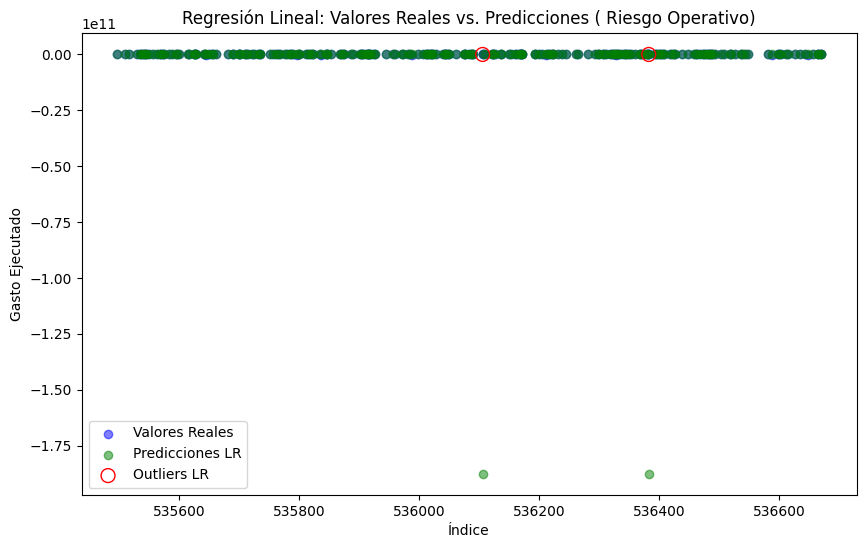

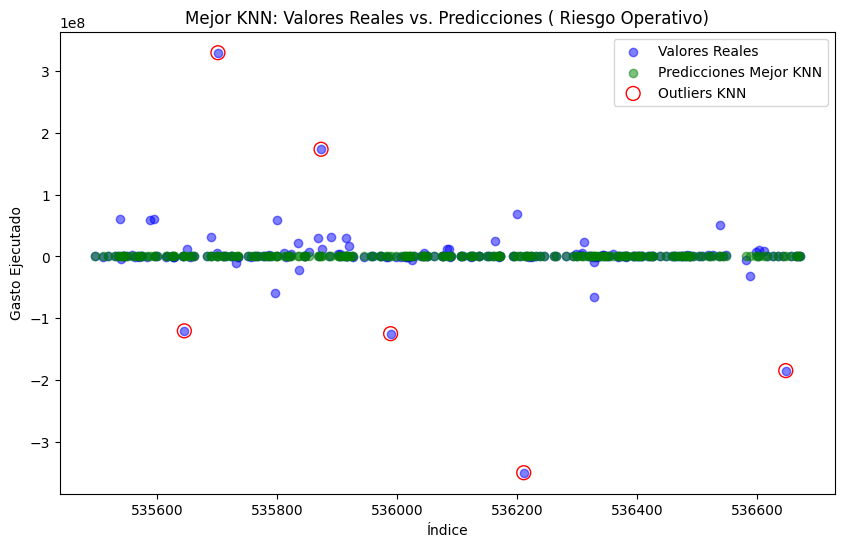

 49%|████▊     | 17/35 [2:04:40<14:27, 48.19s/it]

Procesando Licencias De Software


El mejor valor de k para Licencias De Software es: 2
Mejor KNN - MSE: 0.06435150376131368, MAE: 0.1418392890012699
Regresión Lineal - MSE: 8.840941933619715e+21, MAE: 12915503287.390184
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal no es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría no estar capturando suficiente variabilidad inherente en los datos.
Regresión Lineal (Train) - MSE: 0.027787038085153728, MAE: 0.10251658241566061
KNN (Train) - MSE: 0.024874893263659208, MAE: 0.08627538993628656
Variación MSE Regresión Lineal: 3.181678416579175e+23
Variación MSE KNN: 1.5870062266891227
Variación MAE Regresión Lineal: 125984528385.08469
Variación MAE KNN: 0.6440295327093473
Outliers detectados por Regresión Lineal: 1
Outliers detectados por KNN: 3


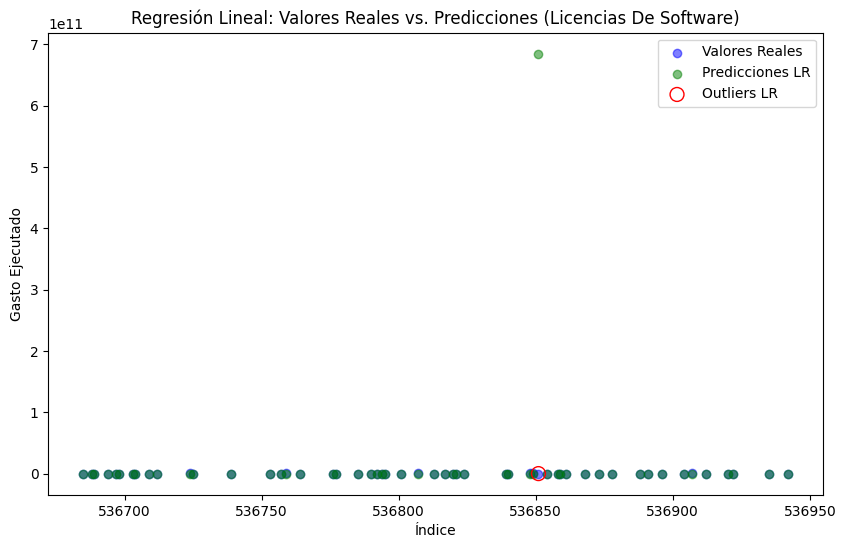

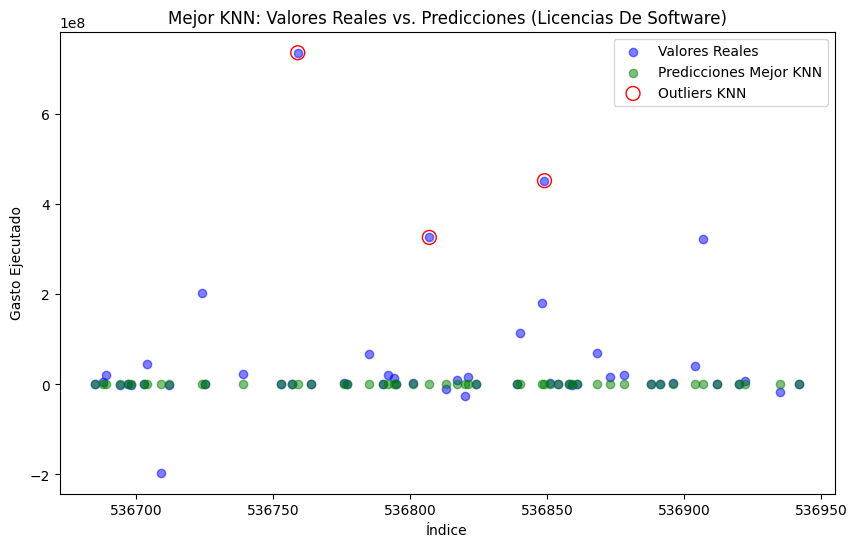

 51%|█████▏    | 18/35 [2:04:41<09:37, 33.96s/it]

Procesando  Gastos Legales


El mejor valor de k para  Gastos Legales es: 78
Mejor KNN - MSE: 0.0014615263141789063, MAE: 0.02549616799946939
Regresión Lineal - MSE: 0.0026297538490991125, MAE: 0.03327409971097341
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Regresión Lineal (Train) - MSE: 0.012764538780072799, MAE: 0.04540633053725438
KNN (Train) - MSE: 0.013623678982987721, MAE: 0.041491887796953
Variación MSE Regresión Lineal: -0.7939797203480223
Variación MSE KNN: -0.8927216124217286
Variación MAE Regresión Lineal: -0.26719249678911805
Variación MAE KNN: -0.38551438960215917
Outliers detectados por Regresión Lineal: 2
Outliers detectados por KNN: 1


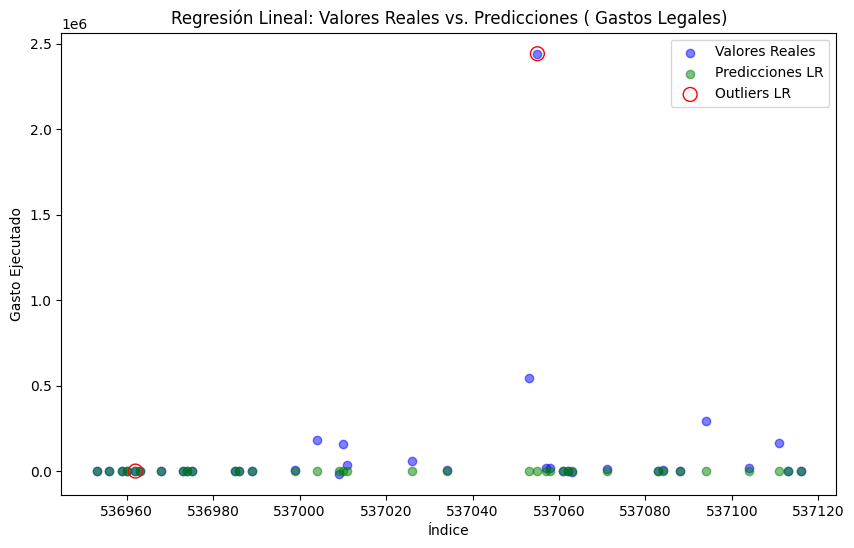

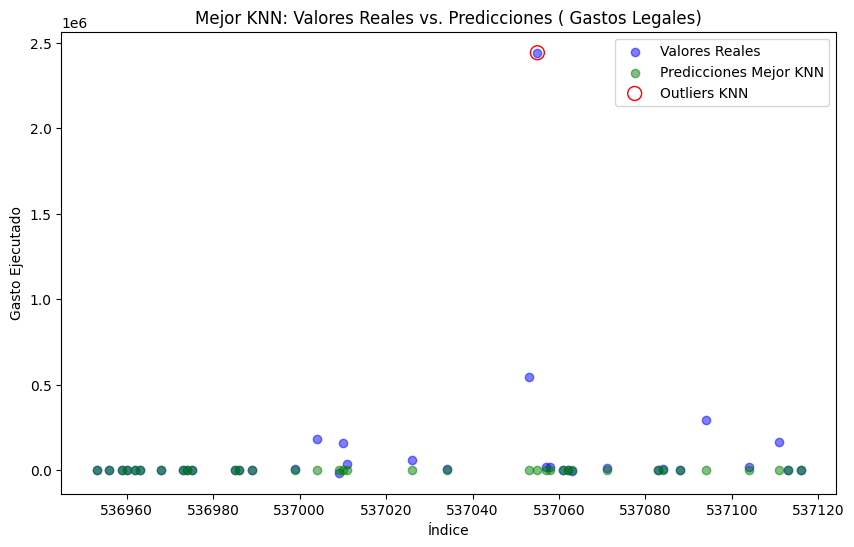

 54%|█████▍    | 19/35 [2:04:41<06:23, 23.94s/it]

Procesando  Depreciación Y Amortización


El mejor valor de k para  Depreciación Y Amortización es: 92
Mejor KNN - MSE: 0.005512375949823172, MAE: 0.022395311264388075
Regresión Lineal - MSE: 1.1437700850013188e+19, MAE: 454648696.3254869
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal no es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría no estar capturando suficiente variabilidad inherente en los datos.
Regresión Lineal (Train) - MSE: 0.0039103069865333556, MAE: 0.019357267582452698
KNN (Train) - MSE: 0.003984040267745253, MAE: 0.017008601054364653
Variación MSE Regresión Lineal: 2.925013532032985e+21
Variación MSE KNN: 0.38361451676362507
Variación MAE Regresión Lineal: 23487235188.00077
Variación MAE KNN: 0.316705071322789
Outliers detectados por Regresión Lineal: 3
Outliers detectados por KNN: 6


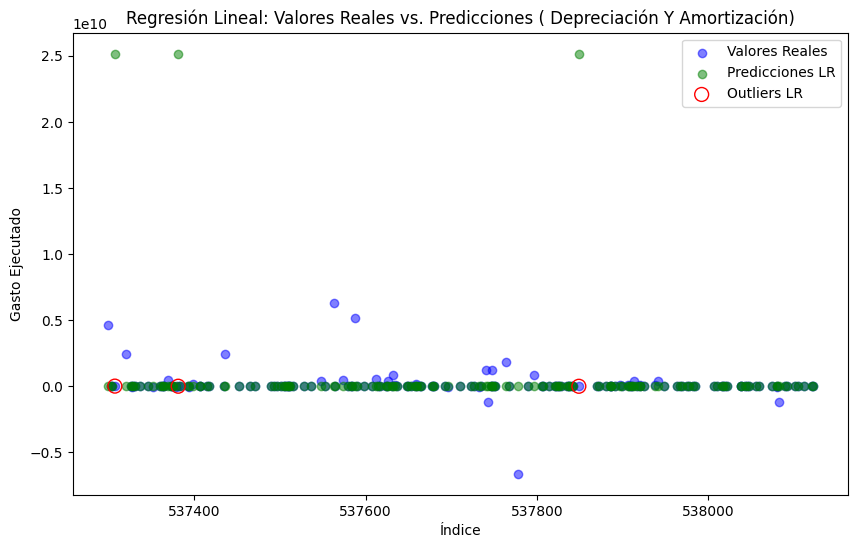

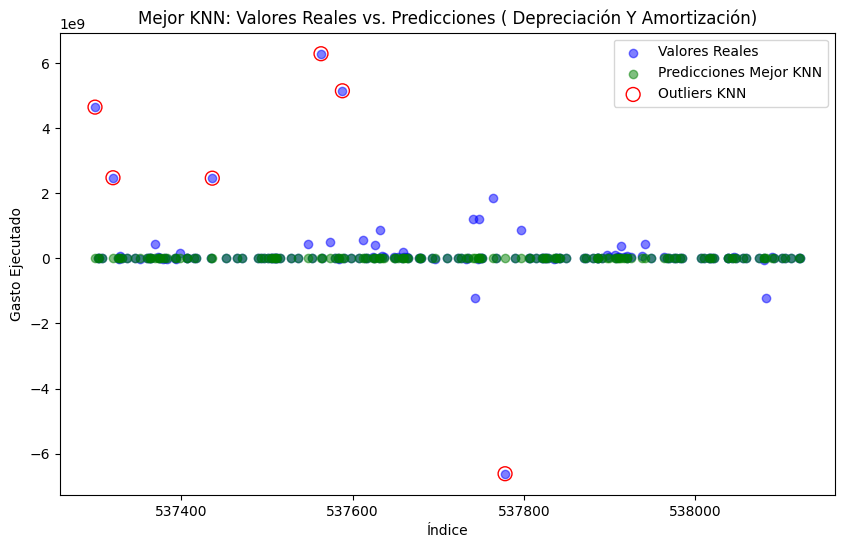

 57%|█████▋    | 20/35 [2:04:42<04:15, 17.02s/it]

Procesando  Publicidad


El mejor valor de k para  Publicidad es: 99
Mejor KNN - MSE: 0.00527249458476898, MAE: 0.03649396093519759
Regresión Lineal - MSE: 2.2983101066669893e+21, MAE: 5294163959.767817
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal no es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría no estar capturando suficiente variabilidad inherente en los datos.
Regresión Lineal (Train) - MSE: 0.005973397765092982, MAE: 0.035962907289639204
KNN (Train) - MSE: 0.006120220873362936, MAE: 0.036697227993636124
Variación MSE Regresión Lineal: 3.847575863937488e+23
Variación MSE KNN: -0.13851236844792952
Variación MAE Regresión Lineal: 147211790111.78235
Variación MAE KNN: -0.005539030317869827
Outliers detectados por Regresión Lineal: 2
Outliers detectados por KNN: 8


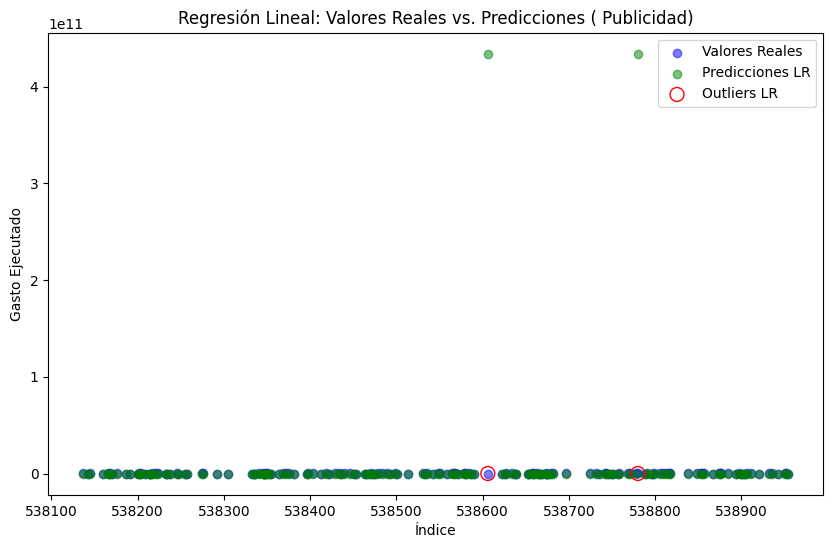

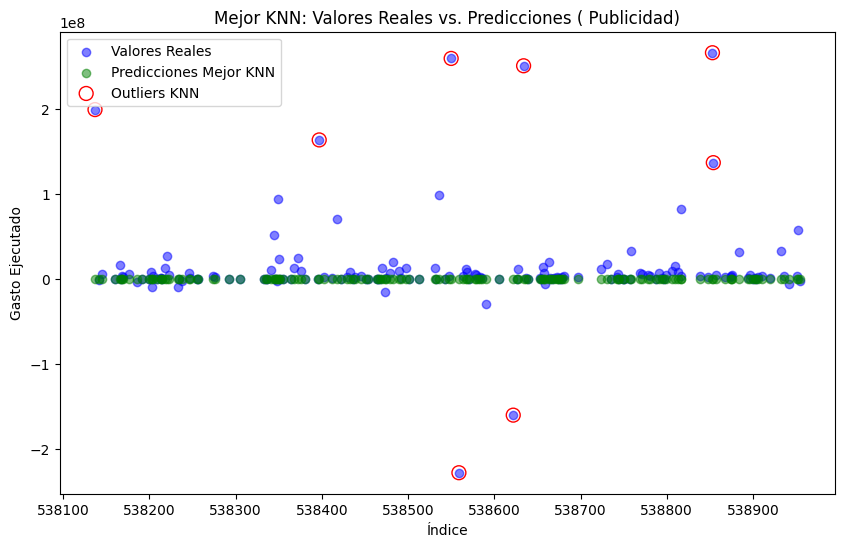

 60%|██████    | 21/35 [2:04:43<02:50, 12.21s/it]

Procesando  Cesantias E Intereses A Las Cesantías


El mejor valor de k para  Cesantias E Intereses A Las Cesantías es: 4
Mejor KNN - MSE: 0.011458560623733604, MAE: 0.0734505144441601
Regresión Lineal - MSE: 0.011424146268760274, MAE: 0.07532493474729218
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.


Regresión Lineal (Train) - MSE: 0.012098809332538193, MAE: 0.07597110174877596
KNN (Train) - MSE: 0.012137111564189758, MAE: 0.07409941038287661
Variación MSE Regresión Lineal: -0.05576276518082649
Variación MSE KNN: -0.05590711899346805
Variación MAE Regresión Lineal: -0.008505431494471982
Variación MAE KNN: -0.008757099892746988
Outliers detectados por Regresión Lineal: 119
Outliers detectados por KNN: 124


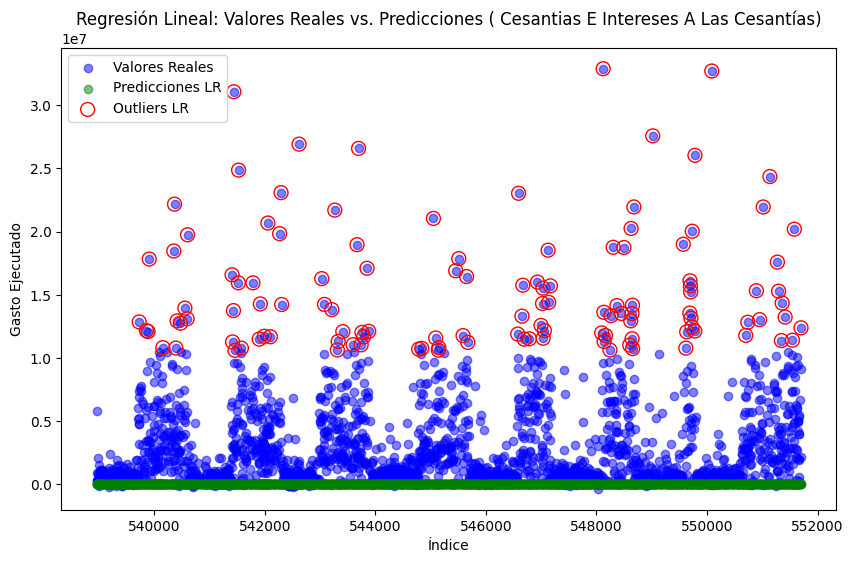

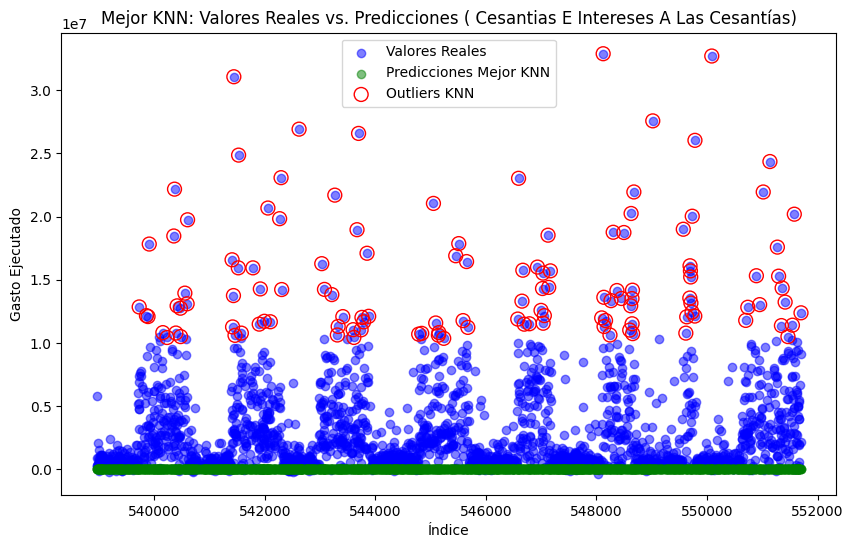

 63%|██████▎   | 22/35 [2:04:59<02:54, 13.43s/it]

Procesando  Asesoría Jurídica


El mejor valor de k para  Asesoría Jurídica es: 23
Mejor KNN - MSE: 0.01094900516282619, MAE: 0.05265356334985916
Regresión Lineal - MSE: 0.010936275437284773, MAE: 0.05577019578329851
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Regresión Lineal (Train) - MSE: 0.005282196107132595, MAE: 0.034135785670248275
KNN (Train) - MSE: 0.005632456299677257, MAE: 0.03195757028215731
Variación MSE Regresión Lineal: 1.0704031458653014
Variación MSE KNN: 0.9439130248473607
Variación MAE Regresión Lineal: 0.6337750746984019
Variación MAE KNN: 0.6476084660058443
Outliers detectados por Regresión Lineal: 4
Outliers detectados por KNN: 5


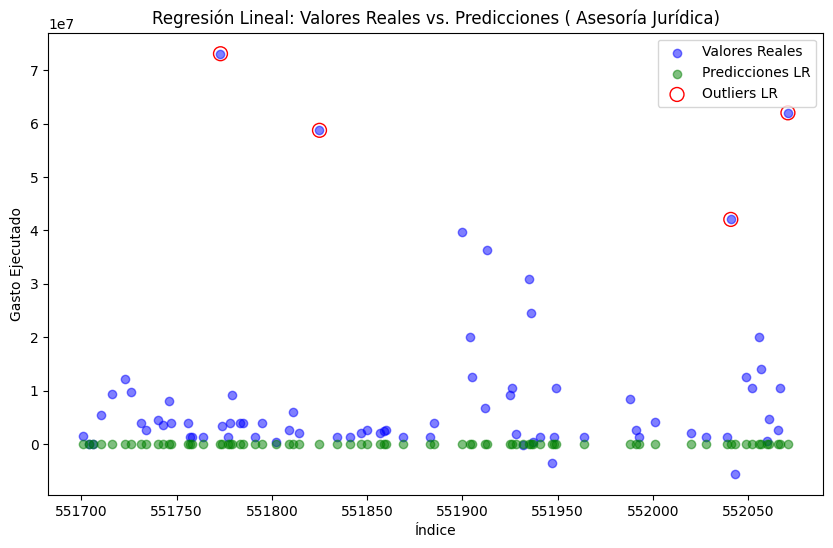

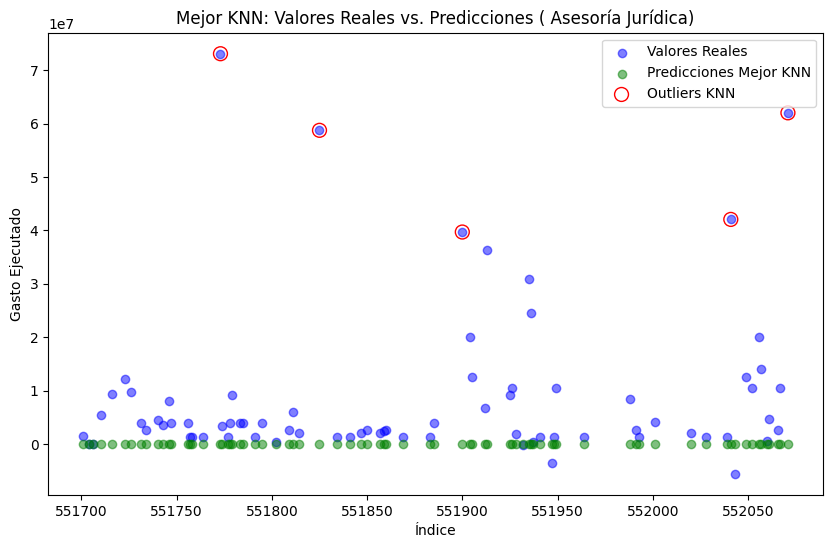

 66%|██████▌   | 23/35 [2:05:00<01:55,  9.67s/it]

Procesando Honorarios Otros


El mejor valor de k para Honorarios Otros es: 94
Mejor KNN - MSE: 0.004793596337714047, MAE: 0.0385150354130045
Regresión Lineal - MSE: 2.4459922116998765e+20, MAE: 550542394.7165047
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal no es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría no estar capturando suficiente variabilidad inherente en los datos.
Regresión Lineal (Train) - MSE: 0.004309578063567763, MAE: 0.03401274776328107
KNN (Train) - MSE: 0.004372234445854964, MAE: 0.03587828095031489
Variación MSE Regresión Lineal: 5.6757115792326945e+22
Variación MSE KNN: 0.09637220901055496
Variación MAE Regresión Lineal: 16186354554.88949
Variación MAE KNN: 0.07349166105090306
Outliers detectados por Regresión Lineal: 1
Outliers detectados por KNN: 38


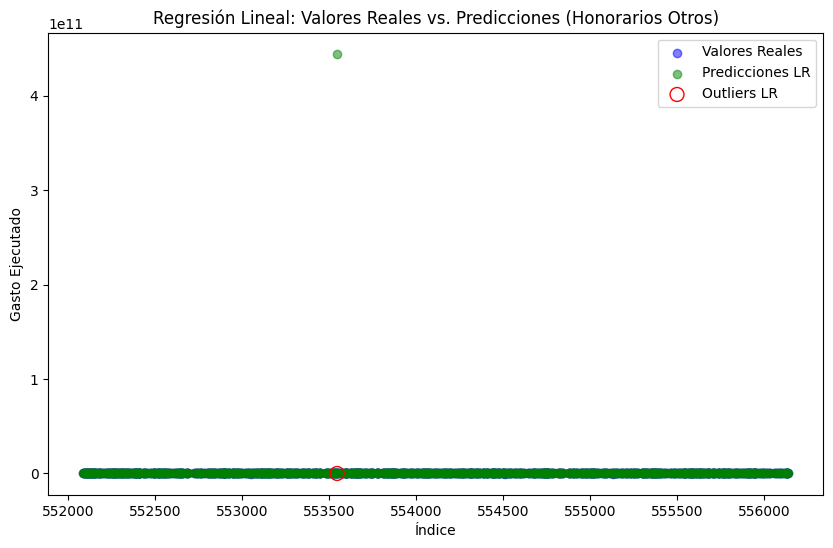

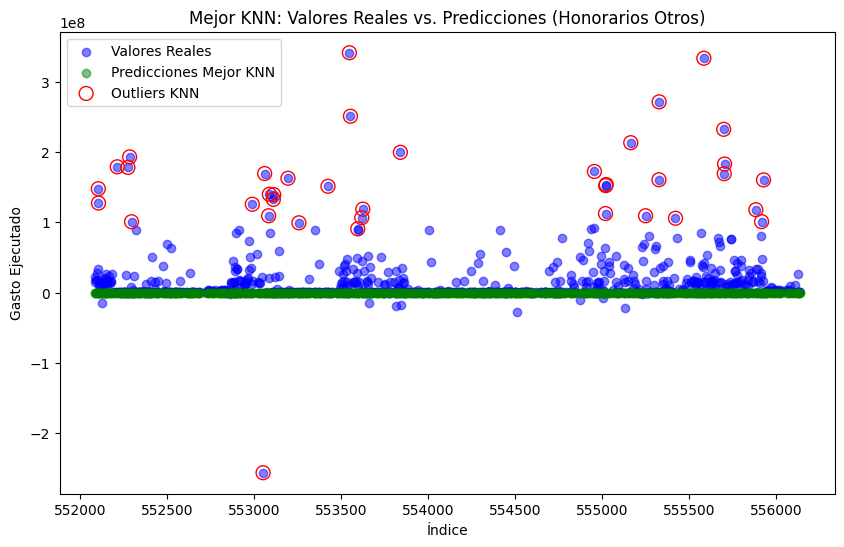

 69%|██████▊   | 24/35 [2:05:06<01:33,  8.47s/it]

Procesando Honorarios Riesgo Operativo


El mejor valor de k para Honorarios Riesgo Operativo es: 91
Mejor KNN - MSE: 0.0010360660354992817, MAE: 0.02134607841303683
Regresión Lineal - MSE: 0.0014809633998380091, MAE: 0.028293994021908426
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Regresión Lineal (Train) - MSE: 0.010860488640899215, MAE: 0.05014785080537321
KNN (Train) - MSE: 0.01133567766920576, MAE: 0.04389641966212733
Variación MSE Regresión Lineal: -0.8636374983846592
Variación MSE KNN: -0.9086013147397589
Variación MAE Regresión Lineal: -0.43578850204928826
Variación MAE KNN: -0.51371709635231
Outliers detectados por Regresión Lineal: 2
Outliers detectados por KNN: 3


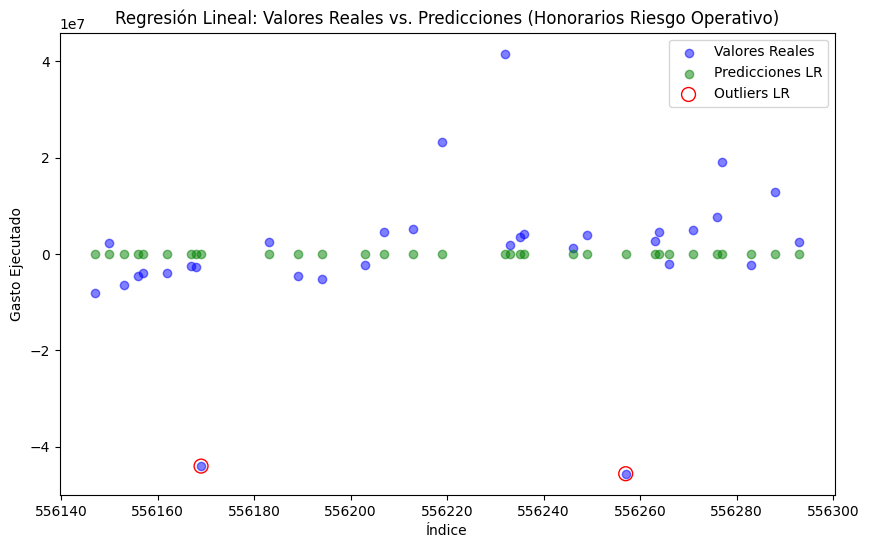

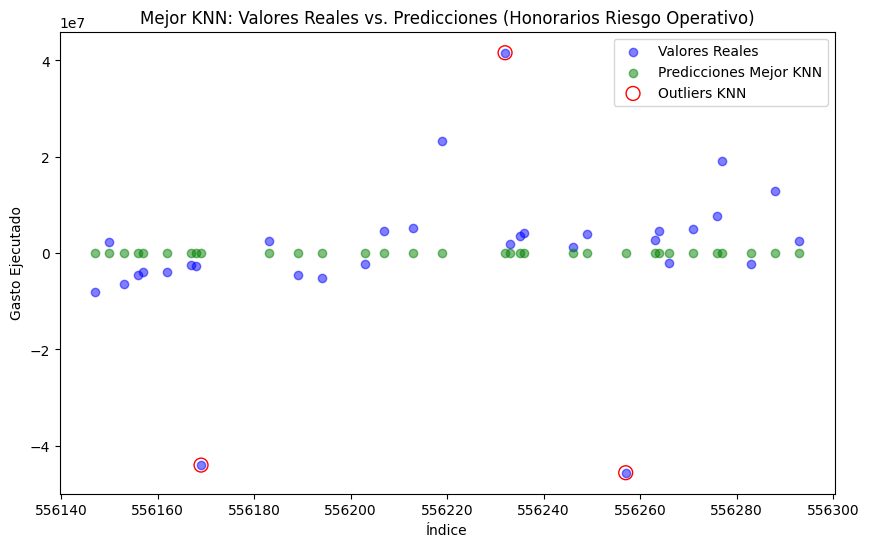

 71%|███████▏  | 25/35 [2:05:07<01:01,  6.12s/it]

Procesando  Servicios Publicos


El mejor valor de k para  Servicios Publicos es: 45
Mejor KNN - MSE: 0.004597081377660811, MAE: 0.04263432524267971
Regresión Lineal - MSE: 8.598820975331946e+19, MAE: 414700397.3274693
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal no es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría no estar capturando suficiente variabilidad inherente en los datos.
Regresión Lineal (Train) - MSE: 0.004207299093857739, MAE: 0.04342735475548118
KNN (Train) - MSE: 0.004246294069765486, MAE: 0.04118986028696229
Variación MSE Regresión Lineal: 2.043786472866979e+22
Variación MSE KNN: 0.0826102248530088
Variación MAE Regresión Lineal: 9549289834.000322
Variación MAE KNN: 0.035068459704745196
Outliers detectados por Regresión Lineal: 2
Outliers detectados por KNN: 53


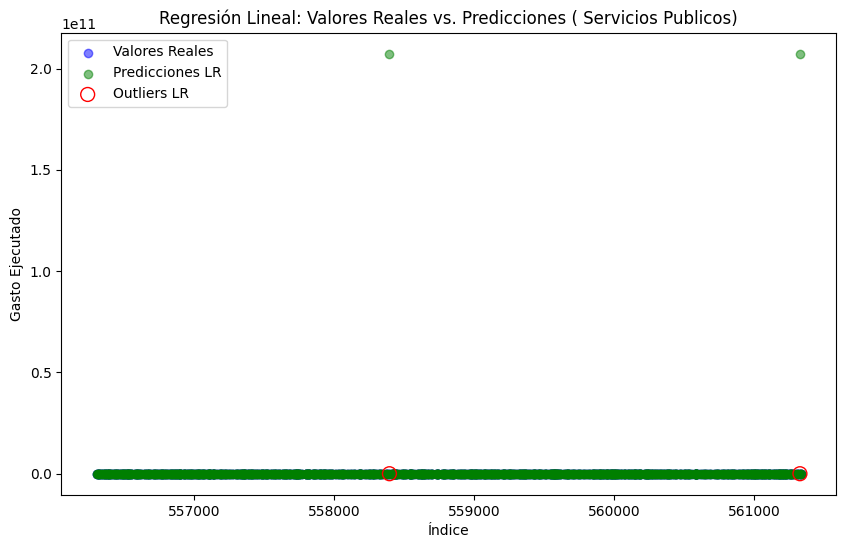

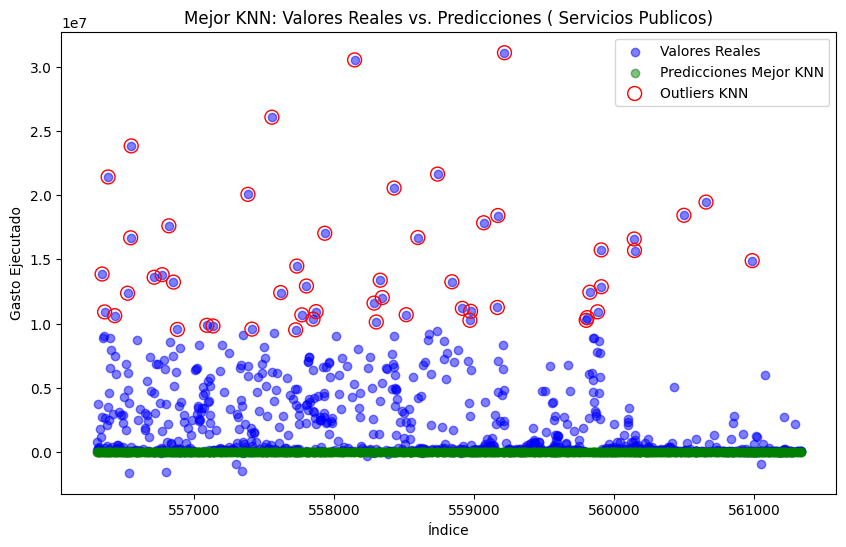

 74%|███████▍  | 26/35 [2:05:15<01:01,  6.81s/it]

Procesando  Contribuciones Y Afiliaciones


El mejor valor de k para  Contribuciones Y Afiliaciones es: 4
Mejor KNN - MSE: 1.1157567596510898e-05, MAE: 0.0013320547156058377
Regresión Lineal - MSE: 5.2265772339397965e+20, MAE: 3810284778.6462193
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal no es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría no estar capturando suficiente variabilidad inherente en los datos.
Regresión Lineal (Train) - MSE: 0.004239851276425843, MAE: 0.022344168328106383
KNN (Train) - MSE: 0.004633997159459545, MAE: 0.01218413317263244
Variación MSE Regresión Lineal: 1.2327265493957973e+23
Variación MSE KNN: -0.9975922368502677
Variación MAE Regresión Lineal: 170527035183.08966
Variación MAE KNN: -0.8906730009650706
Outliers detectados por Regresión Lineal: 1
Outliers detectados por KNN: 1


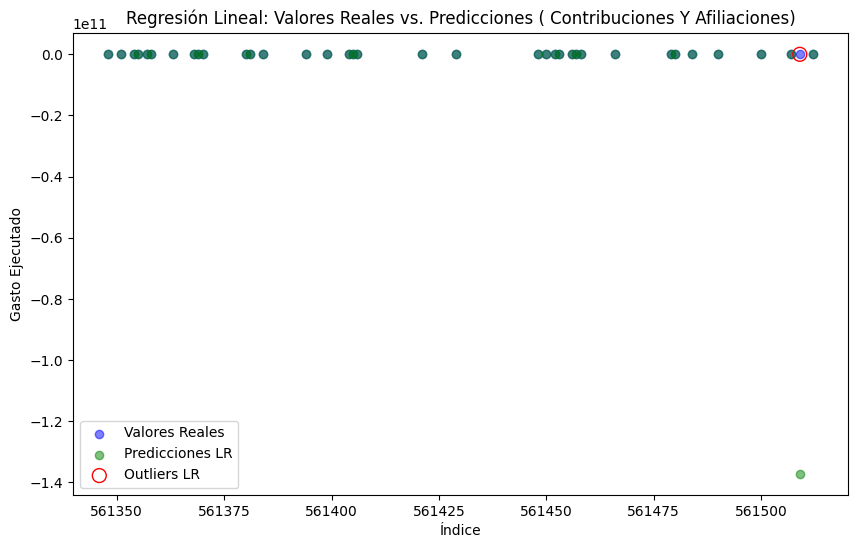

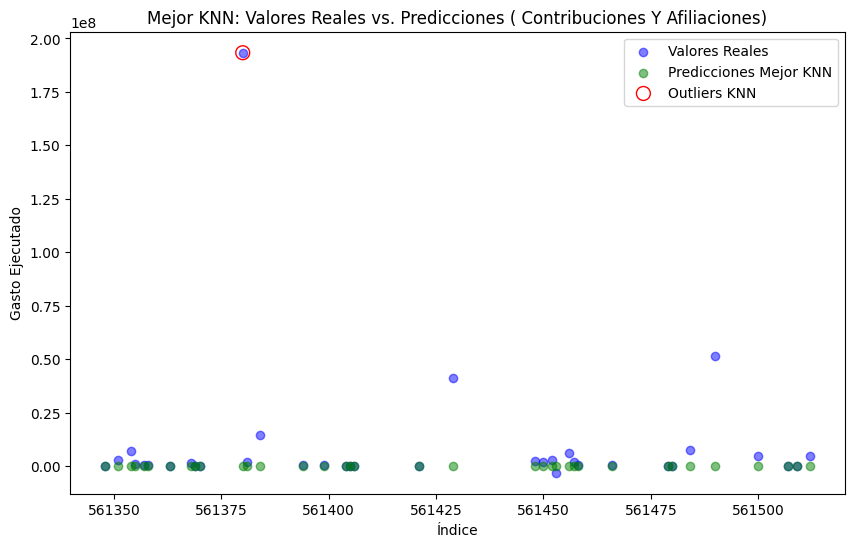

 77%|███████▋  | 27/35 [2:05:16<00:39,  4.96s/it]

Procesando  Garantías


El mejor valor de k para  Garantías es: 97
Mejor KNN - MSE: 0.002266414107835157, MAE: 0.022954382213322716
Regresión Lineal - MSE: 0.0022558582065103703, MAE: 0.02139320039999214
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Regresión Lineal (Train) - MSE: 0.0023906356399264585, MAE: 0.021340397672069952
KNN (Train) - MSE: 0.0024066280230013756, MAE: 0.02293073787357426
Variación MSE Regresión Lineal: -0.0563772375702699
Variación MSE KNN: -0.05826156507201047
Variación MAE Regresión Lineal: 0.0024743085266539554
Variación MAE KNN: 0.001031119882788548
Outliers detectados por Regresión Lineal: 38
Outliers detectados por KNN: 37


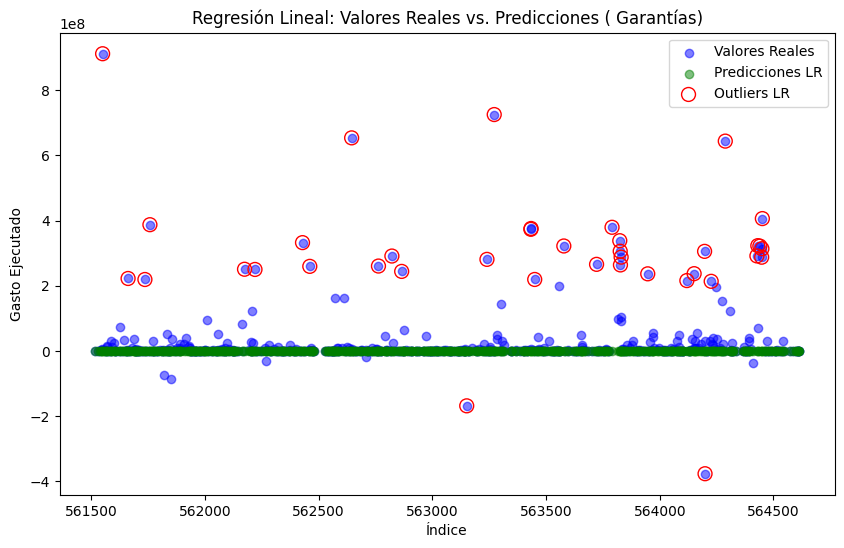

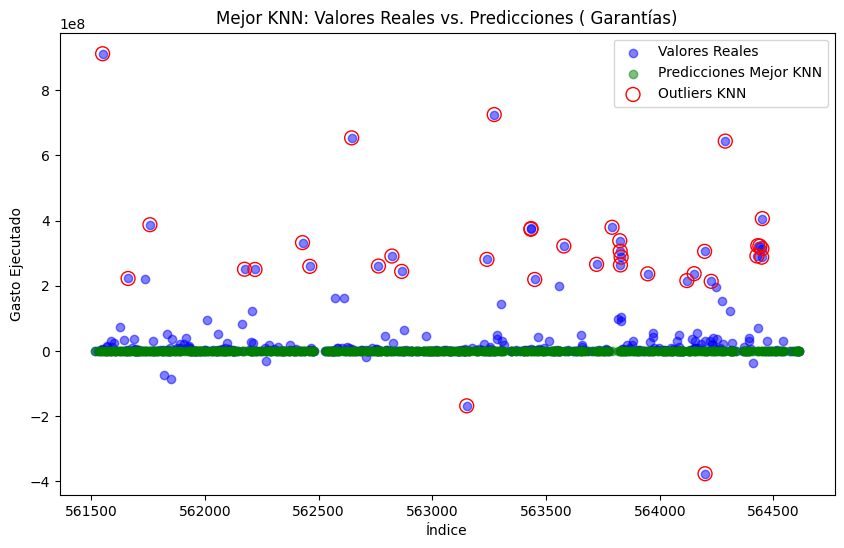

 80%|████████  | 28/35 [2:05:19<00:31,  4.44s/it]

Procesando  Actividades Fiduciarias


El mejor valor de k para  Actividades Fiduciarias es: 82
Mejor KNN - MSE: 0.003606679422896867, MAE: 0.05295537210427733
Regresión Lineal - MSE: 0.003446207511855433, MAE: 0.05304447902303662
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Regresión Lineal (Train) - MSE: 0.007062357506063504, MAE: 0.05835681897338318
KNN (Train) - MSE: 0.007030790842247939, MAE: 0.057392282831209035
Variación MSE Regresión Lineal: -0.5120315689347877
Variación MSE KNN: -0.48701653856286364
Variación MAE Regresión Lineal: -0.09103203436721835
Variación MAE KNN: -0.07730849006269151
Outliers detectados por Regresión Lineal: 4
Outliers detectados por KNN: 3


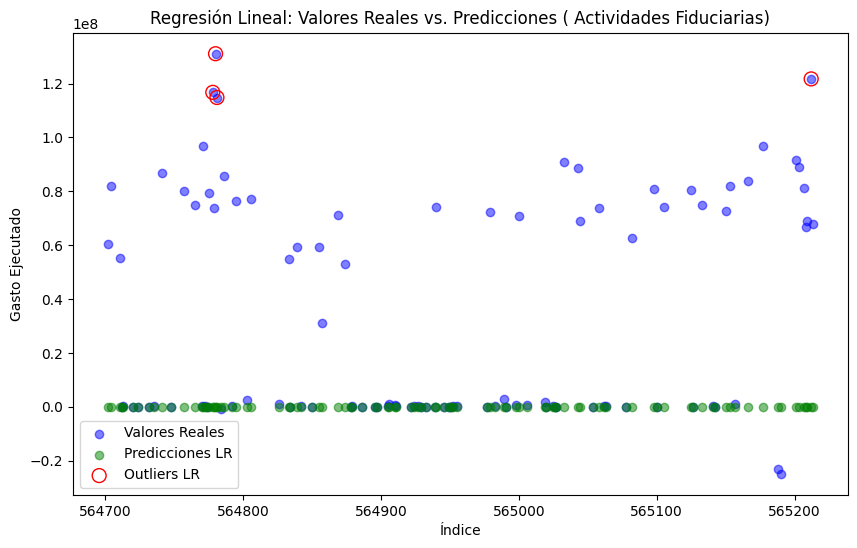

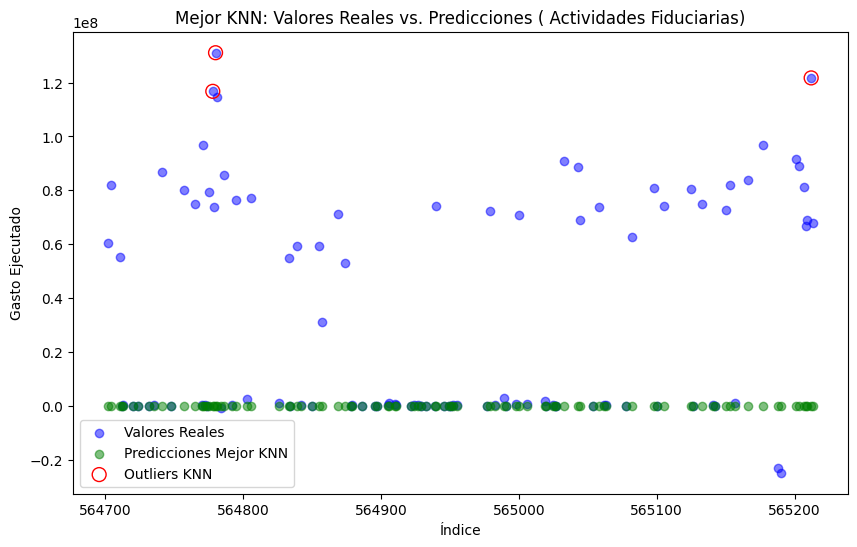

 83%|████████▎ | 29/35 [2:05:20<00:20,  3.34s/it]

Procesando  Gastos De Viaje


El mejor valor de k para  Gastos De Viaje es: 95
Mejor KNN - MSE: 0.002301218589516708, MAE: 0.024086173898423345


Regresión Lineal - MSE: 8775507150020341.0, MAE: 6176923.118072909
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal no es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría no estar capturando suficiente variabilidad inherente en los datos.
Regresión Lineal (Train) - MSE: 0.0030163724700303994, MAE: 0.02666367123693861
KNN (Train) - MSE: 0.0031441926630475805, MAE: 0.027263631822523934
Variación MSE Regresión Lineal: 2.909291620053773e+18
Variación MSE KNN: -0.26810509528821325
Variación MAE Regresión Lineal: 231660638.04642236
Variación MAE KNN: -0.11654565850891233
Outliers detectados por Regresión Lineal: 3
Outliers detectados por KNN: 23


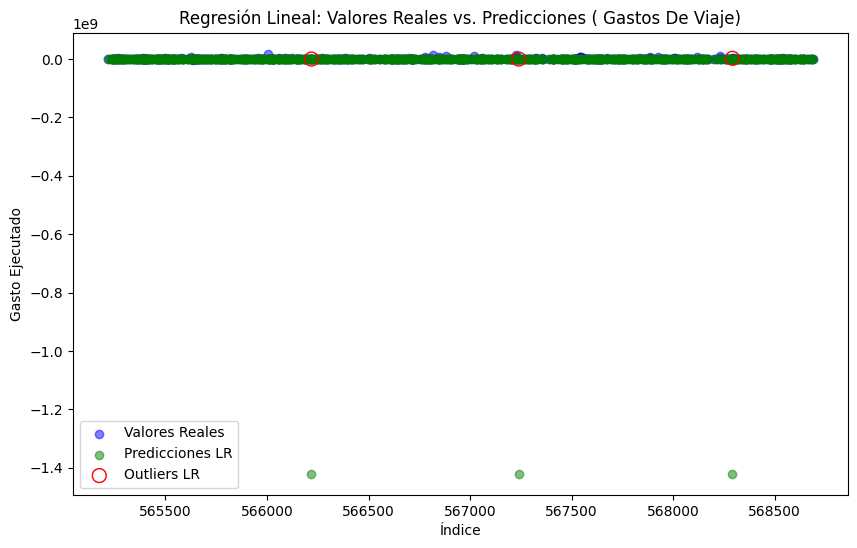

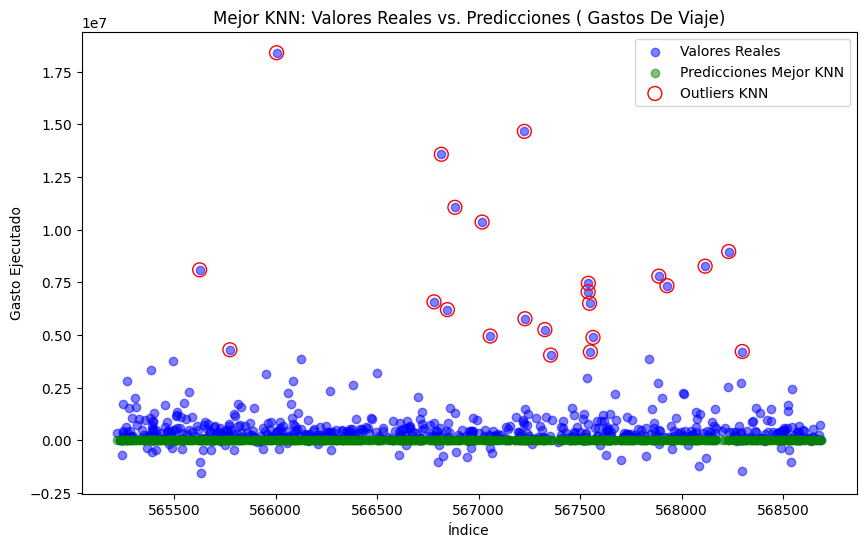

 86%|████████▌ | 30/35 [2:05:25<00:19,  3.91s/it]

Procesando  Servicios Temporales


El mejor valor de k para  Servicios Temporales es: 95
Mejor KNN - MSE: 0.006774431120918842, MAE: 0.03702140784691783
Regresión Lineal - MSE: 0.00679132480818566, MAE: 0.0396193130379558
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Regresión Lineal (Train) - MSE: 0.00466900299793146, MAE: 0.03500699817843215
KNN (Train) - MSE: 0.0046136570823732395, MAE: 0.03202666367633492
Variación MSE Regresión Lineal: 0.4545556752039926
Variación MSE KNN: 0.4683430085866096
Variación MAE Regresión Lineal: 0.1317540805988131
Variación MAE KNN: 0.15595580673217643
Outliers detectados por Regresión Lineal: 8
Outliers detectados por KNN: 7


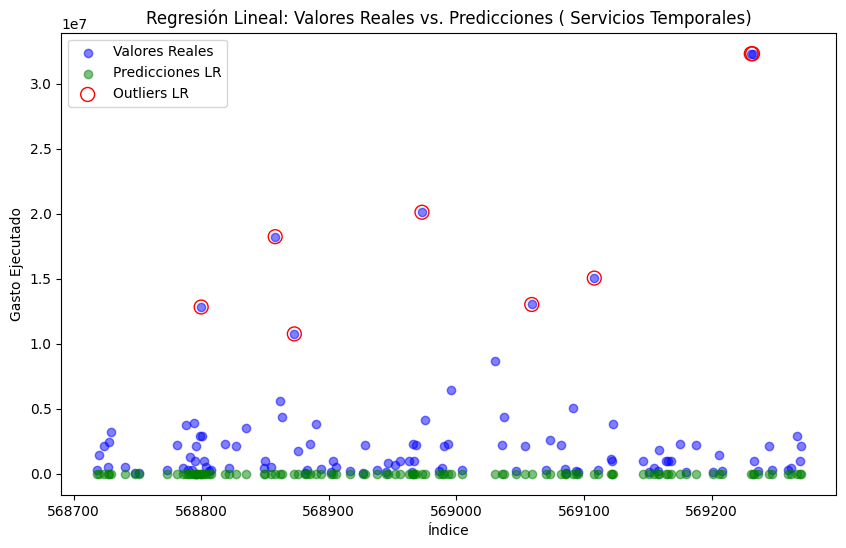

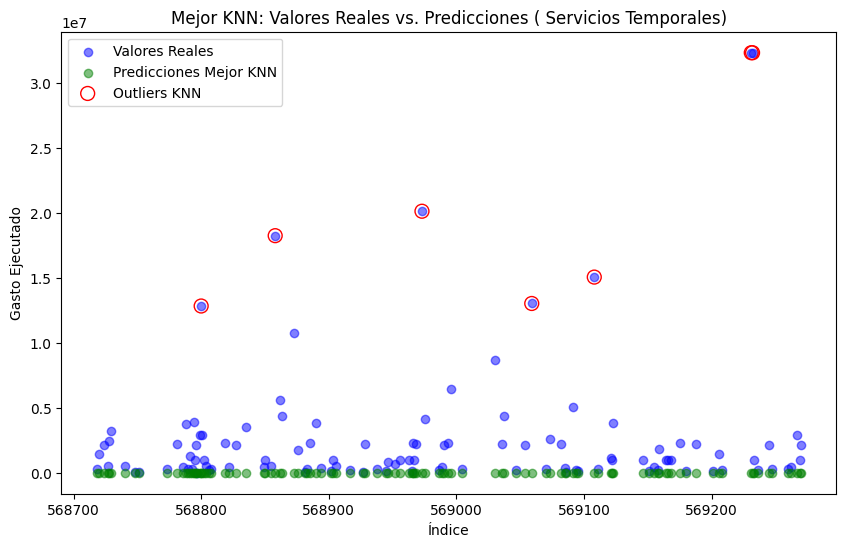

 89%|████████▊ | 31/35 [2:05:26<00:12,  3.06s/it]

Procesando  Indeminizaciones


El mejor valor de k para  Indeminizaciones es: 74
Mejor KNN - MSE: 0.021239961976536544, MAE: 0.1182200244467395
Regresión Lineal - MSE: 0.020895155611867413, MAE: 0.1152516320127707
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Regresión Lineal (Train) - MSE: 0.03685298382963427, MAE: 0.15002048112736532
KNN (Train) - MSE: 0.037457406346829605, MAE: 0.15184017526087673
Variación MSE Regresión Lineal: -0.4330131934916713
Variación MSE KNN: -0.43295694902446724
Variación MAE Regresión Lineal: -0.23176068263023603
Variación MAE KNN: -0.22141801902147717
Outliers detectados por Regresión Lineal: 2
Outliers detectados por KNN: 2


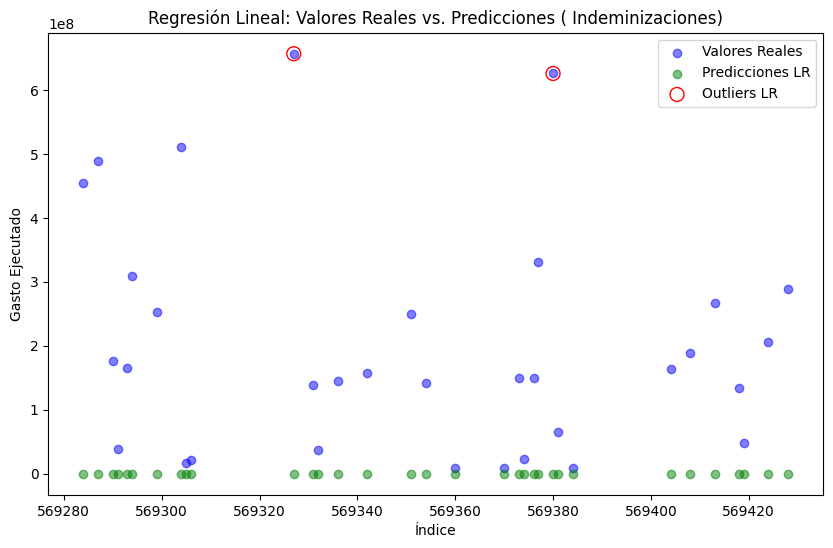

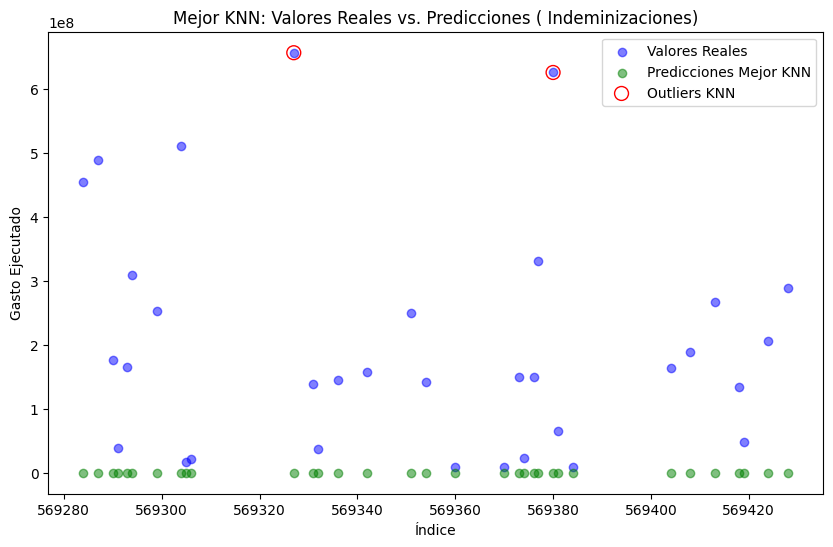

 91%|█████████▏| 32/35 [2:05:27<00:07,  2.37s/it]

Procesando  Procesamiento De Datos


El mejor valor de k para  Procesamiento De Datos es: 3
Mejor KNN - MSE: 0.0017004249908862737, MAE: 0.014156571485316663
Regresión Lineal - MSE: 0.0017196897004840735, MAE: 0.020290391493318412
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Regresión Lineal (Train) - MSE: 0.004746585284723845, MAE: 0.023125727684174216
KNN (Train) - MSE: 0.004858794548717761, MAE: 0.016735916464154312
Variación MSE Regresión Lineal: -0.6376996098608761
Variación MSE KNN: -0.6500315101129318
Variación MAE Regresión Lineal: -0.12260527450542145
Variación MAE KNN: -0.154120330629171
Outliers detectados por Regresión Lineal: 6
Outliers detectados por KNN: 6


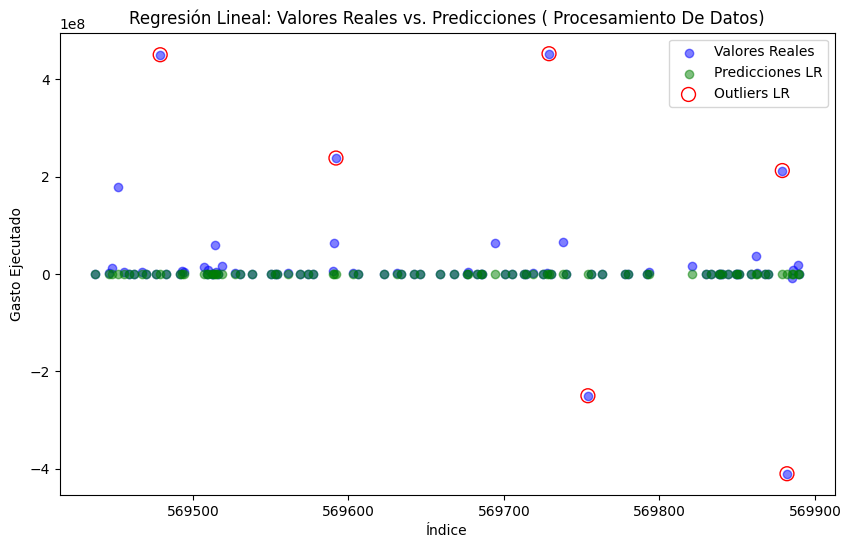

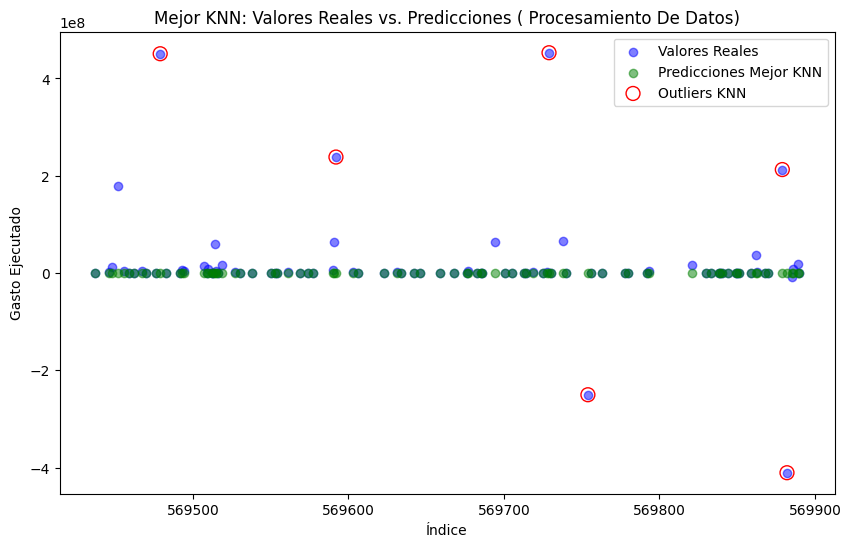

 94%|█████████▍| 33/35 [2:05:28<00:03,  1.91s/it]

Procesando  Gastos De Representación


El mejor valor de k para  Gastos De Representación es: 2
Mejor KNN - MSE: 0.021646820852329222, MAE: 0.09968886727354158
Regresión Lineal - MSE: 4.87734434160686e+23, MAE: 164422140400.03098
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal no es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría no estar capturando suficiente variabilidad inherente en los datos.
Regresión Lineal (Train) - MSE: 0.023822017268823714, MAE: 0.10227467776444359
KNN (Train) - MSE: 0.020252448275066854, MAE: 0.09075759838887892
Variación MSE Regresión Lineal: 2.0474102955125992e+25
Variación MSE KNN: 0.06884958096542848
Variación MAE Regresión Lineal: 1607652490273.512
Variación MAE KNN: 0.09840794647731729
Outliers detectados por Regresión Lineal: 1
Outliers detectados por KNN: 2


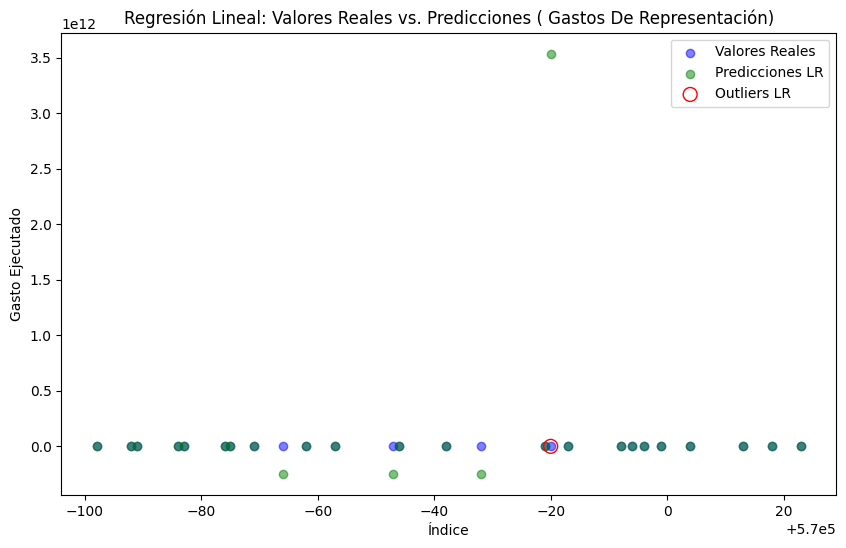

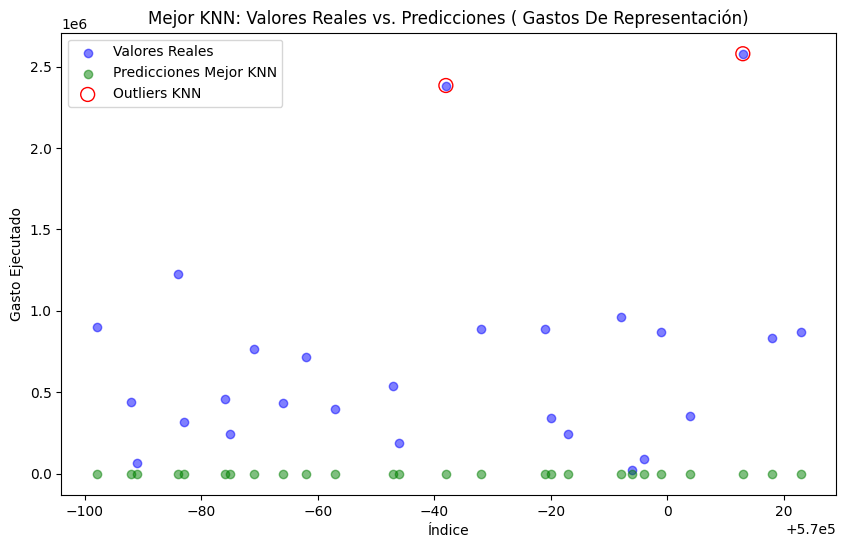

 97%|█████████▋| 34/35 [2:05:28<00:01,  1.54s/it]

Procesando  Daños  Y Riesgos Operacionales


El mejor valor de k para  Daños  Y Riesgos Operacionales es: 68
Mejor KNN - MSE: 0.0023031703966628777, MAE: 0.022940836158566277
Regresión Lineal - MSE: 7.709790045820356e+20, MAE: 1461395193.9953535
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
El MSE del modelo de Regresión Lineal no es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría no estar capturando suficiente variabilidad inherente en los datos.
Regresión Lineal (Train) - MSE: 0.0024307704298684135, MAE: 0.01984985547233217
KNN (Train) - MSE: 0.0024471281375839813, MAE: 0.021360900068023308
Variación MSE Regresión Lineal: 3.1717475048590724e+23
Variación MSE KNN: -0.05882721820330639
Variación MAE Regresión Lineal: 73622460174.20517
Variación MAE KNN: 0.07396392874418674
Outliers detectados por Regresión Lineal: 1
Outliers detectados por KNN: 19


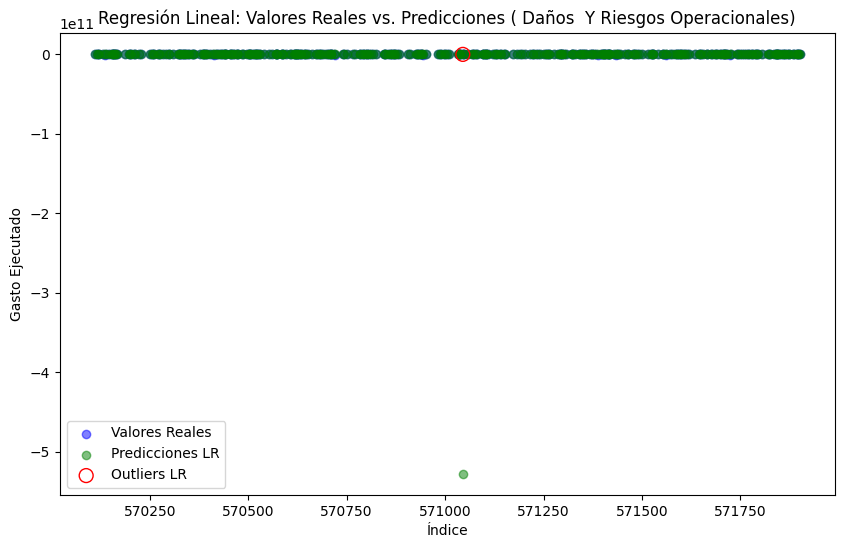

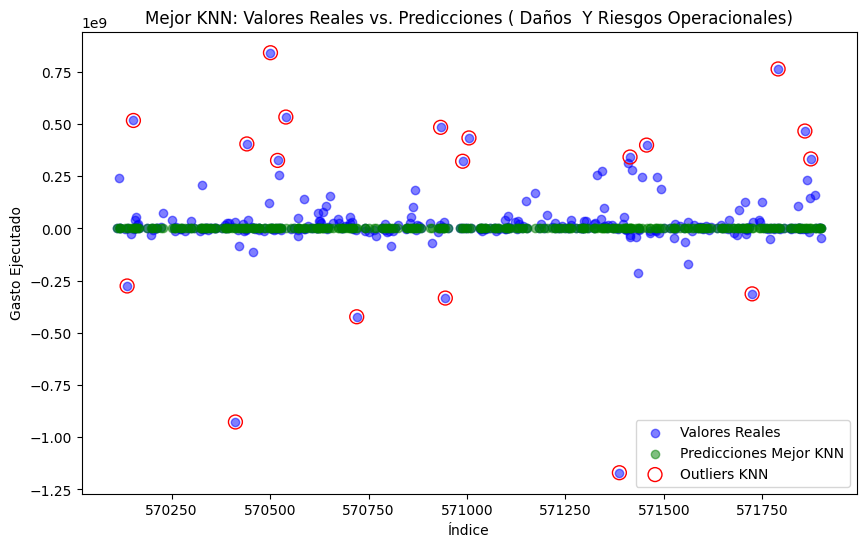

100%|██████████| 35/35 [2:05:30<00:00,  1.61s/it]

100%|██████████| 35/35 [2:05:30<00:00, 215.16s/it]

In [16]:
# Procesar cada DataFrame
cantidad_outliers_knn = 0
cantidad_outliers_lr = 0

for value, df_value in tqdm(dataframes.items()):
    num_outliers_knn, num_outliers_lr, best_k = process_dataframe(df_value, value)
    cantidad_outliers_lr = cantidad_outliers_lr + num_outliers_lr
    cantidad_outliers_knn = cantidad_outliers_knn + num_outliers_knn
    best_knn_cuenta[value] = [best_k]

In [17]:
print(cantidad_outliers_lr)
print(cantidad_outliers_knn)
print(best_knn_cuenta)

2142
3282
{' Utiles Y Papeleria': [79], ' Transporte': [99], ' Aportes A La Seguridad Social': [29], ' Impuestos Y Contribuciones': [62], ' Adecuación E Instalación': [92], ' Mantenimiento Y Reparaciones': [94], ' Arrendamientos': [89], 'Diversos Otros': [98], ' Servicios De Aseo Y Vigilancia': [82], ' Otros': [56], ' Multas Y Sanciones': [55], ' Salarios': [50], ' Vacaciones Legales Y Extralegales': [64], ' Prima Legal Y Extralegal': [12], ' Bonificaciones': [36], 'Cuentas_menos_100_reg': [69], ' Riesgo Operativo': [2], 'Licencias De Software': [2], ' Gastos Legales': [78], ' Depreciación Y Amortización': [92], ' Publicidad': [99], ' Cesantias E Intereses A Las Cesantías': [4], ' Asesoría Jurídica': [23], 'Honorarios Otros': [94], 'Honorarios Riesgo Operativo': [91], ' Servicios Publicos': [45], ' Contribuciones Y Afiliaciones': [4], ' Garantías': [97], ' Actividades Fiduciarias': [82], ' Gastos De Viaje': [95], ' Servicios Temporales': [95], ' Indeminizaciones': [74], ' Procesamiento

Ejecución con la base completa

In [18]:
# Cargar los datos
df = pd.read_csv("query_3ec5aea3_20240410T153703.csv")
df['Index'] = range(len(df))
df.set_index("Index", inplace=True)

In [19]:
df = df[df["sociedad"] == 1000]
df = df[df["fecha"] != 202413]
df['mes'] = df['fecha'].apply(lambda x: str(x)[4:6])

In [20]:
df = df[[
"mes",
"moneda",
"gestoria",
"concepto",
"nivel_1_cuenta",
"vicepresidencia_direccion_cumpl",
"gasto_ejecutado"]]

In [21]:
df['gasto_ejecutado'] = df['gasto_ejecutado']*65987456

In [22]:
df.loc[df['nivel_1_cuenta'].isnull(),'nivel_1_cuenta']= 'Sin descripcion'
df.loc[df['gestoria'].isnull(),'gestoria']= 'Sin_Gestoria'

In [23]:
df = df[df['nivel_1_cuenta'] != 'Sin descripcion']

In [24]:
cuentas_conteo = df['nivel_1_cuenta'].value_counts()

In [25]:
cuentas_conteo

nivel_1_cuenta
 Impuestos Y Contribuciones               148888
Diversos Otros                             63080
 Servicios De Aseo Y Vigilancia            37599
 Mantenimiento Y Reparaciones              36064
 Aportes A La Seguridad Social             31853
 Utiles Y Papeleria                        29816
 Otros                                     28379
 Transporte                                17717
 Vacaciones Legales Y Extralegales         13054
 Prima Legal Y Extralegal                  12793
 Cesantias E Intereses A Las Cesantías     12744
 Adecuación E Instalación                  12402
 Salarios                                  11568
 Arrendamientos                            10315
 Servicios Publicos                         5044
Honorarios Otros                            4058
 Bonificaciones                             3476
 Gastos De Viaje                            3471
 Garantías                                  3103
 Daños  Y Riesgos Operacionales             1819
 Ries

In [26]:
# Aplicar la condición y cambiar los valores 
df['nivel_1_cuenta'] = df['nivel_1_cuenta'].apply(lambda x: 'Cuentas_menos_100_reg' if cuentas_conteo[x] < 100 else x)

In [27]:
# Crear DataFrames separados para cada valor único en 'nivel_1_cuenta'
unique_values = df['nivel_1_cuenta'].unique()
dataframes = {}

for value in tqdm(unique_values):
    dataframes[value] = df[df['nivel_1_cuenta'] == value]

  0%|          | 0/35 [00:00<?, ?it/s]

 11%|█▏        | 4/35 [00:00<00:01, 30.39it/s]

 26%|██▌       | 9/35 [00:00<00:00, 36.69it/s]

 37%|███▋      | 13/35 [00:00<00:00, 37.27it/s]

 49%|████▊     | 17/35 [00:00<00:00, 36.72it/s]

 63%|██████▎   | 22/35 [00:00<00:00, 38.73it/s]

 74%|███████▍  | 26/35 [00:00<00:00, 37.61it/s]

 86%|████████▌ | 30/35 [00:00<00:00, 38.05it/s]

 97%|█████████▋| 34/35 [00:00<00:00, 38.20it/s]

100%|██████████| 35/35 [00:00<00:00, 37.52it/s]

In [28]:
for i, item in tqdm(enumerate(list(df.concepto.unique()))):
    df['concepto'] = df['concepto'].str.replace(item, f'Conc {i}')  

0it [00:00, ?it/s]

1it [00:00,  6.19it/s]

2it [00:00,  6.68it/s]

3it [00:00,  5.81it/s]

4it [00:00,  6.15it/s]

5it [00:00,  6.45it/s]

6it [00:00,  6.59it/s]

7it [00:01,  7.04it/s]

8it [00:01,  7.09it/s]

9it [00:01,  6.39it/s]

10it [00:01,  6.34it/s]

11it [00:01,  6.79it/s]

12it [00:01,  7.14it/s]

13it [00:01,  7.75it/s]

14it [00:02,  7.80it/s]

16it [00:02,  8.53it/s]

17it [00:02,  7.59it/s]

18it [00:02,  7.81it/s]

20it [00:02,  8.27it/s]

22it [00:02,  9.91it/s]

24it [00:03, 11.14it/s]

26it [00:03, 12.09it/s]

28it [00:03, 10.68it/s]

30it [00:03, 10.76it/s]

32it [00:03, 11.71it/s]

34it [00:03, 11.03it/s]

36it [00:04, 11.97it/s]

38it [00:04, 12.12it/s]

40it [00:04, 12.95it/s]

42it [00:04, 13.72it/s]

44it [00:04, 14.14it/s]

46it [00:04, 14.12it/s]

48it [00:04, 14.36it/s]

50it [00:05, 14.51it/s]

52it [00:05, 14.89it/s]

54it [00:05, 14.94it/s]

56it [00:05, 15.24it/s]

58it [00:05, 15.30it/s]

60it [00:05, 15.80it/s]

62it [00:06,  9.88it/s]

64it [00:06, 11.32it/s]

66it [00:06, 12.08it/s]

68it [00:06, 12.87it/s]

69it [00:06, 10.64it/s]

In [29]:
for i, item in tqdm(enumerate(list(df.vicepresidencia_direccion_cumpl.unique()))):
    df['vicepresidencia_direccion_cumpl'] = df['vicepresidencia_direccion_cumpl'].str.replace(item, f'Vice {i}')  

0it [00:00, ?it/s]

1it [00:00,  8.94it/s]

3it [00:00, 11.26it/s]

5it [00:00, 11.57it/s]

7it [00:00, 12.75it/s]

9it [00:00, 13.62it/s]

11it [00:00, 14.19it/s]

13it [00:01, 13.39it/s]

15it [00:01, 14.69it/s]

17it [00:01, 15.37it/s]

19it [00:01, 15.36it/s]

21it [00:01, 15.73it/s]

23it [00:01, 15.89it/s]

25it [00:01, 16.43it/s]

27it [00:01, 16.39it/s]

29it [00:01, 16.60it/s]

31it [00:02, 15.47it/s]

33it [00:02, 15.89it/s]

35it [00:02, 15.14it/s]

37it [00:02,  9.33it/s]

39it [00:02, 10.69it/s]

41it [00:03, 12.10it/s]

43it [00:03, 12.71it/s]

45it [00:03, 13.84it/s]

47it [00:03, 13.98it/s]

49it [00:03, 14.92it/s]

51it [00:03, 15.12it/s]

53it [00:03, 15.63it/s]

55it [00:03, 15.87it/s]

57it [00:04, 16.16it/s]

59it [00:04, 16.88it/s]

61it [00:04, 17.10it/s]

63it [00:04, 17.12it/s]

65it [00:04, 16.91it/s]

67it [00:04, 17.23it/s]

69it [00:04, 16.98it/s]

71it [00:04, 17.09it/s]

73it [00:04, 17.61it/s]

75it [00:05, 17.06it/s]

77it [00:05, 17.48it/s]

79it [00:05, 16.84it/s]

81it [00:05, 10.46it/s]

81it [00:05, 14.36it/s]

In [30]:
# Convertir el array a lista (opcional, dependiendo del uso)
lista_unique_values = unique_values.tolist()

# Crear un diccionario con claves del array y listas vacías como valores
#best_knn_cuenta = {' Utiles Y Papeleria': [79], ' Transporte': [99], ' Aportes A La Seguridad Social': [29], 'Sin descripcion': [31], ' Impuestos Y Contribuciones': [70], ' Adecuación E Instalación': [92], ' Mantenimiento Y Reparaciones': [94], ' Arrendamientos': [89], 'Diversos Otros': [98], ' Servicios De Aseo Y Vigilancia': [82], ' Otros': [56], ' Multas Y Sanciones': [55], ' Salarios': [50], ' Vacaciones Legales Y Extralegales': [64], ' Prima Legal Y Extralegal': [12], ' Bonificaciones': [36], 'Cuentas_menos_100_reg': [69], ' Riesgo Operativo': [2], 'Licencias De Software': [2], ' Gastos Legales': [78], ' Depreciación Y Amortización': [92], ' Publicidad': [99], ' Cesantias E Intereses A Las Cesantías': [4], ' Asesoría Jurídica': [23], 'Honorarios Otros': [94], 'Honorarios Riesgo Operativo': [91], ' Servicios Publicos': [45], ' Contribuciones Y Afiliaciones': [4], ' Garantías': [97], ' Actividades Fiduciarias': [82], ' Gastos De Viaje': [95], ' Servicios Temporales': [95], ' Indeminizaciones': [74], ' Procesamiento De Datos': [3], ' Gastos De Representación': [2], ' Daños  Y Riesgos Operacionales': [68]}


  0%|          | 0/35 [00:00<?, ?it/s]

Procesando  Utiles Y Papeleria


Mejor KNN - MSE: 0.06251660437850204, MAE: 0.2499946292380758
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 29816


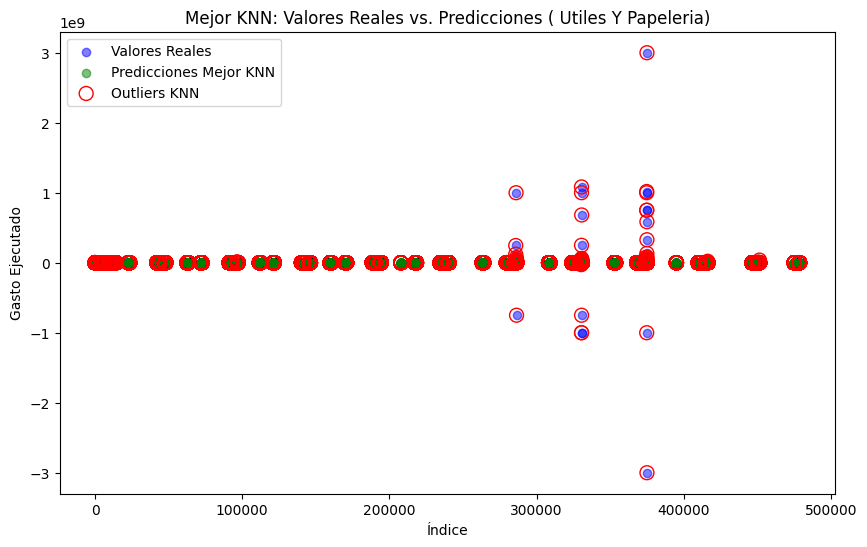

  3%|▎         | 1/35 [00:01<00:51,  1.51s/it]

Procesando  Transporte


Mejor KNN - MSE: 4.045874014350732e-05, MAE: 0.0009849390162762837
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 68


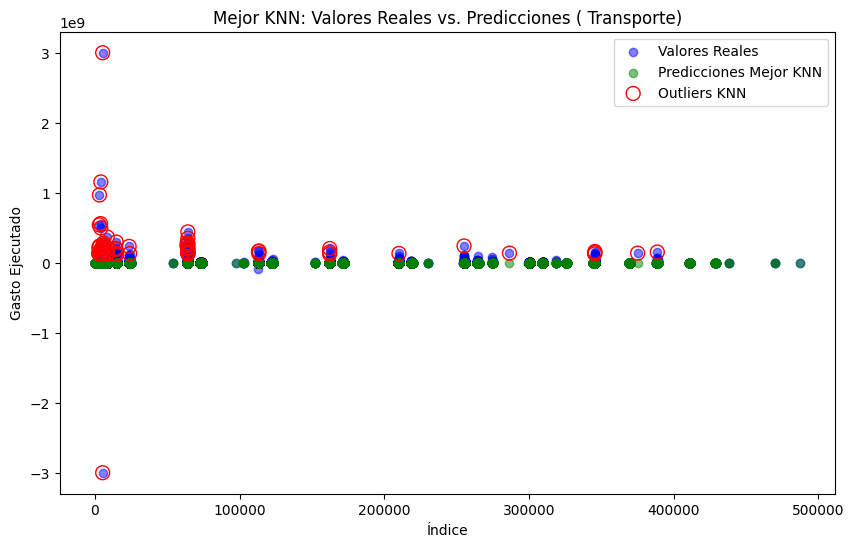

  6%|▌         | 2/35 [00:02<00:30,  1.07it/s]

Procesando  Aportes A La Seguridad Social


Mejor KNN - MSE: 0.0006334995946894417, MAE: 0.012565449117552916
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 425


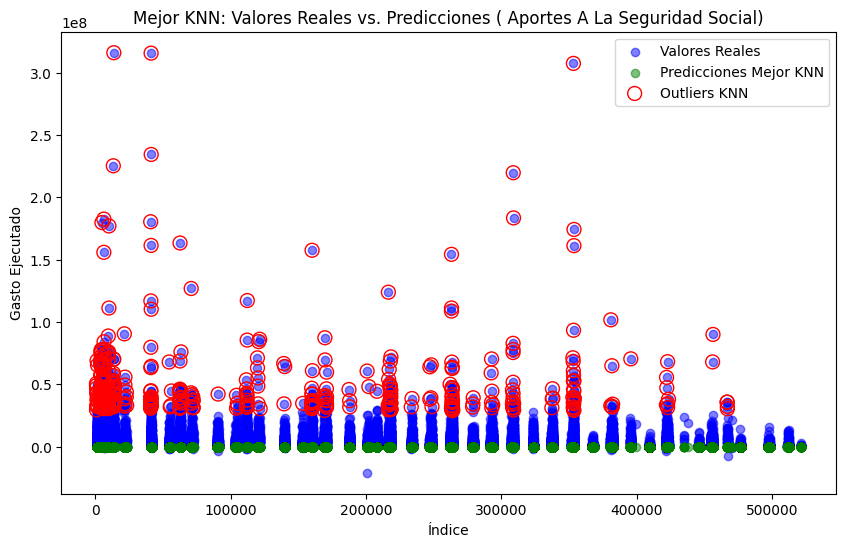

  9%|▊         | 3/35 [00:05<01:06,  2.06s/it]

Procesando  Impuestos Y Contribuciones


Mejor KNN - MSE: 2.297349280324821e-05, MAE: 3.981956483664017e-05
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 24


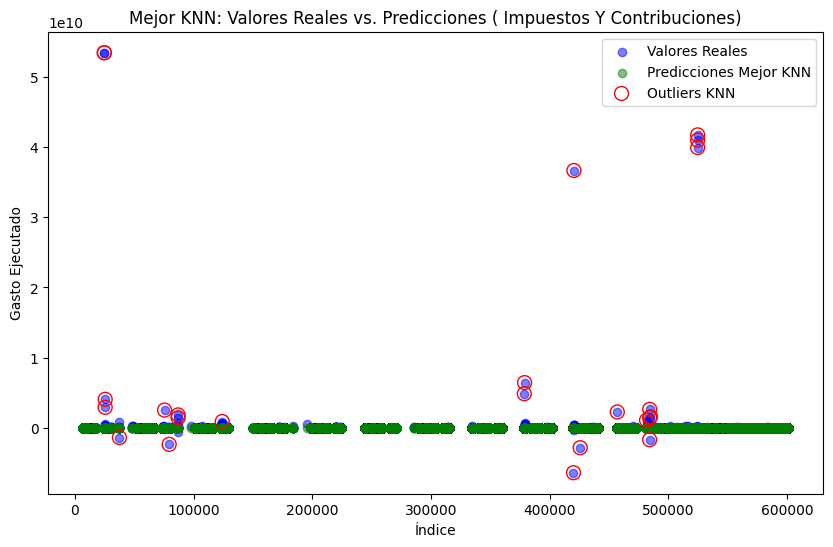

 11%|█▏        | 4/35 [00:16<02:57,  5.71s/it]

Procesando  Adecuación E Instalación
Mejor KNN - MSE: 0.0002444589415247487, MAE: 0.0025029458036387115
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 72


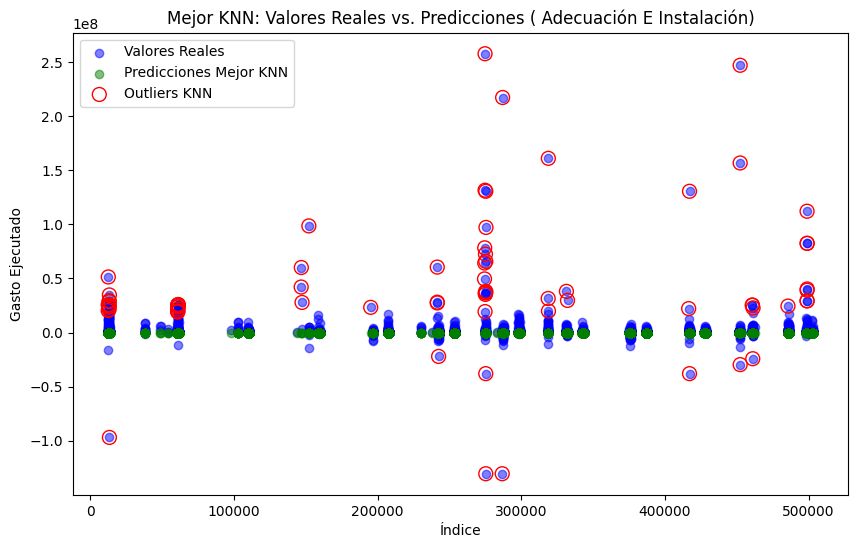

 14%|█▍        | 5/35 [00:17<01:54,  3.80s/it]

Procesando  Mantenimiento Y Reparaciones


Mejor KNN - MSE: 3.419600714908406e-05, MAE: 0.00013464239736164213
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 13


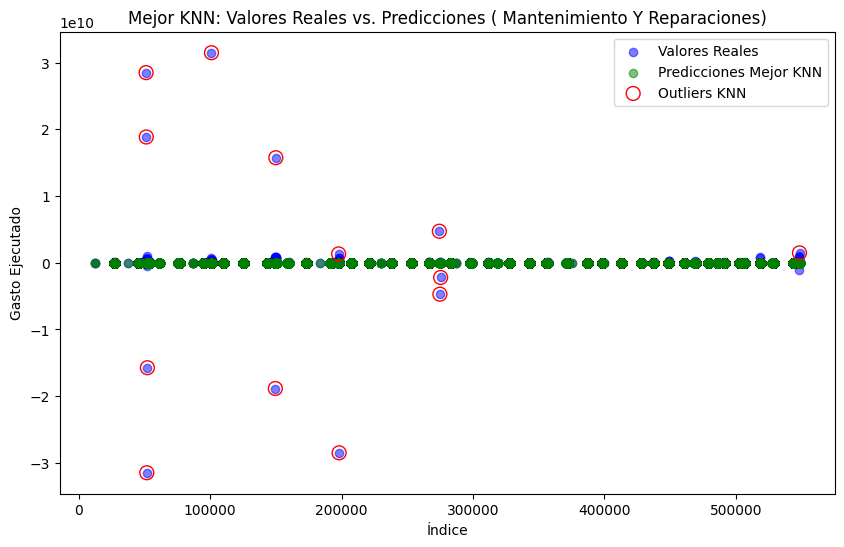

 17%|█▋        | 6/35 [00:18<01:26,  2.98s/it]

Procesando  Arrendamientos
Mejor KNN - MSE: 0.0005253103553005544, MAE: 0.01319837900415835
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 53


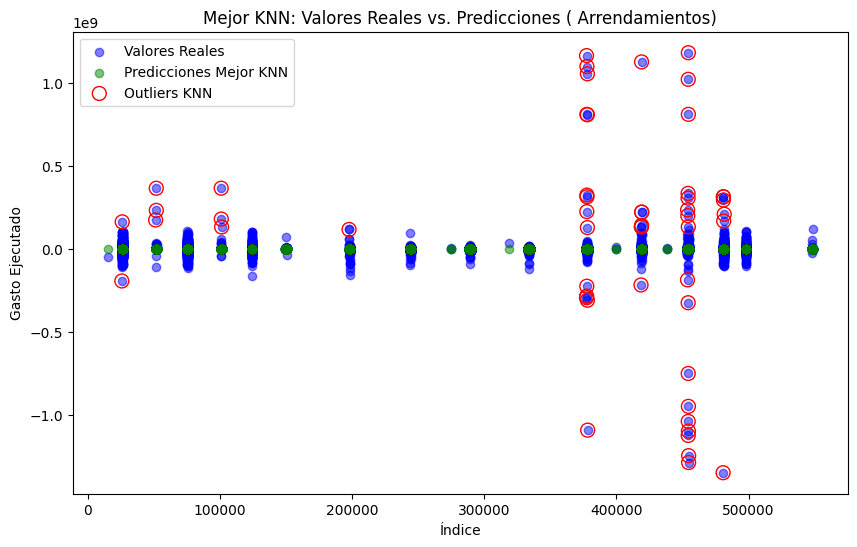

 20%|██        | 7/35 [00:18<00:59,  2.12s/it]

Procesando Diversos Otros


Mejor KNN - MSE: 3.017751853887811e-05, MAE: 0.0004329788163319096
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 153


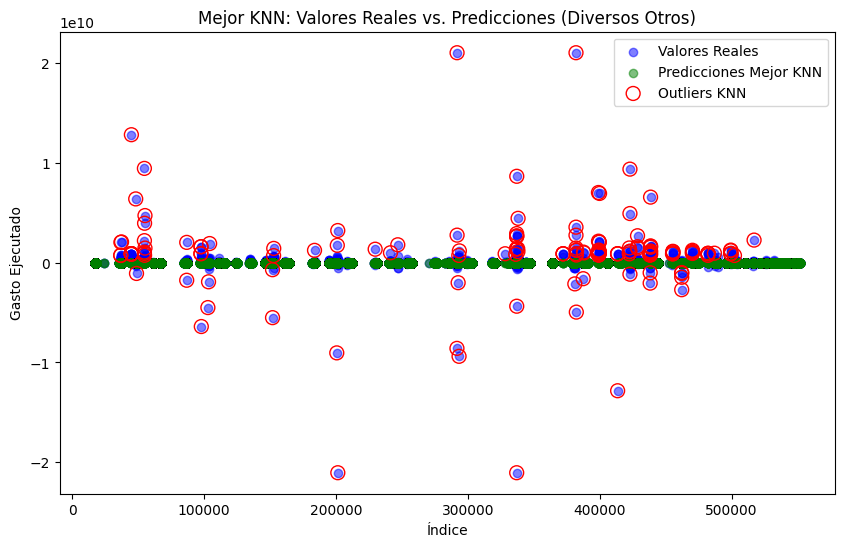

 23%|██▎       | 8/35 [00:25<01:36,  3.57s/it]

Procesando  Servicios De Aseo Y Vigilancia


Mejor KNN - MSE: 9.272798822372485e-05, MAE: 0.0022678012083519397
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 57


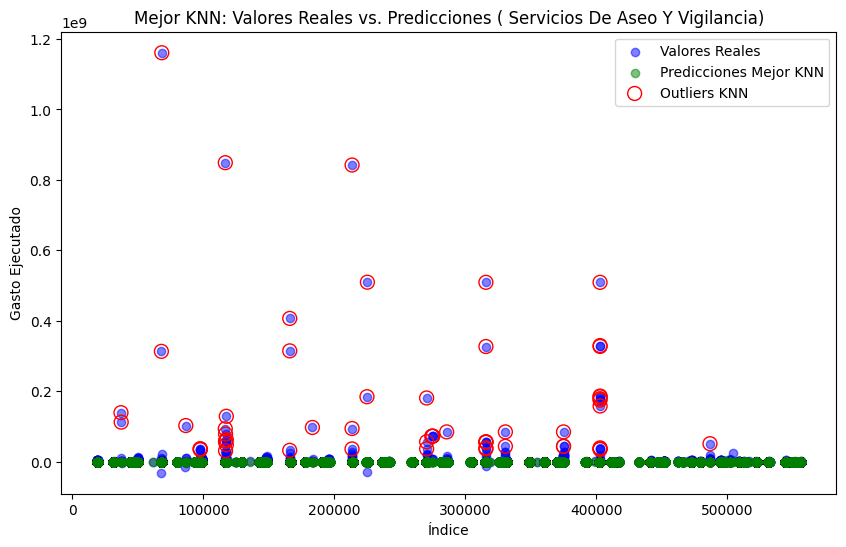

 26%|██▌       | 9/35 [00:27<01:18,  3.03s/it]

Procesando  Otros


Mejor KNN - MSE: 0.00013360049885773056, MAE: 0.0004957872508229095
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 21


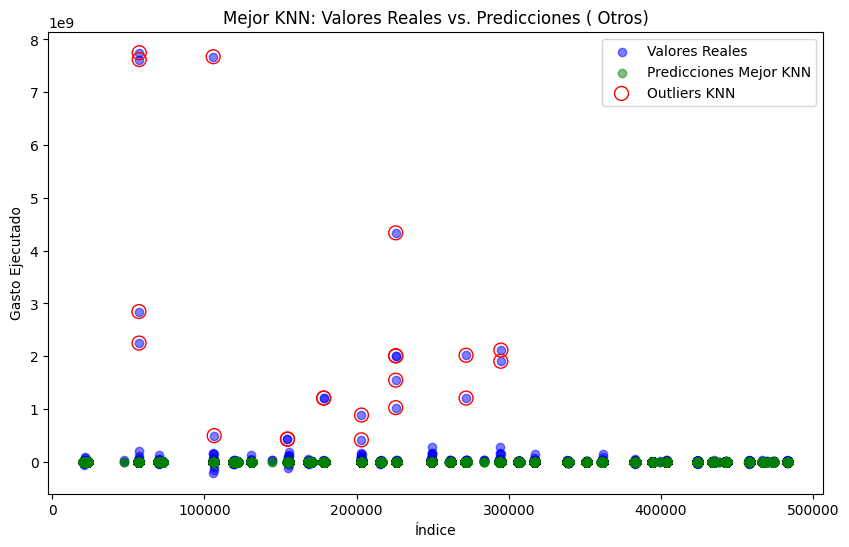

 29%|██▊       | 10/35 [00:28<00:58,  2.35s/it]

Procesando  Multas Y Sanciones
Mejor KNN - MSE: 0.0011841400416833234, MAE: 0.004991373754613667
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 3


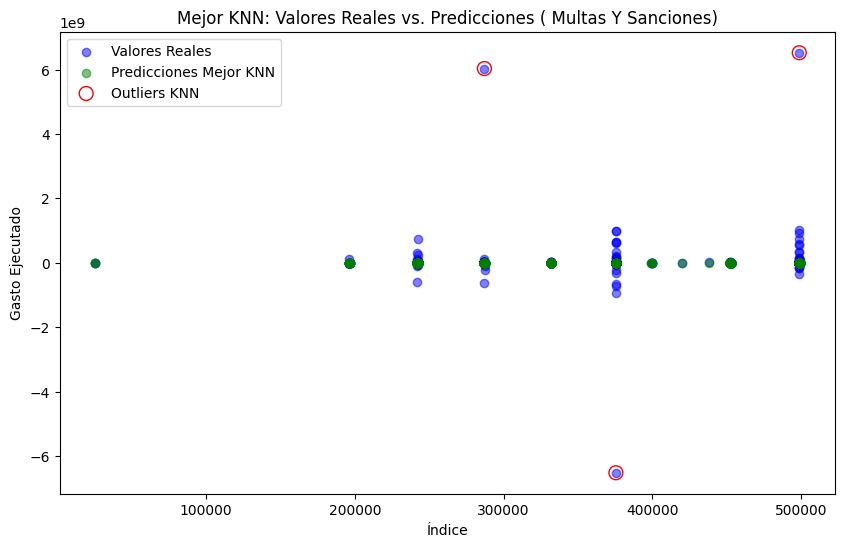

 31%|███▏      | 11/35 [00:28<00:40,  1.67s/it]

Procesando  Salarios


Mejor KNN - MSE: 0.0014283856760651799, MAE: 0.018038171778930148
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.


Outliers detectados por KNN: 124


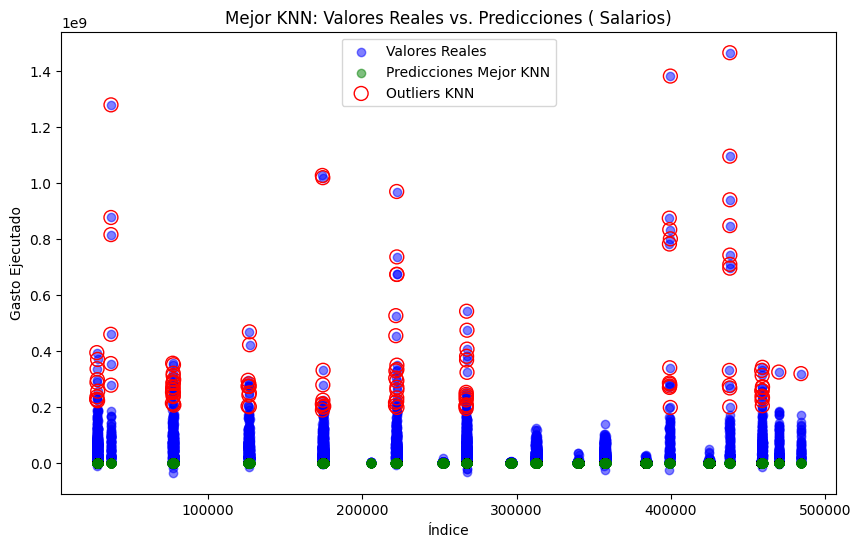

 34%|███▍      | 12/35 [00:29<00:31,  1.36s/it]

Procesando  Vacaciones Legales Y Extralegales


Mejor KNN - MSE: 0.0011719955688722003, MAE: 0.021269358392449454
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 152


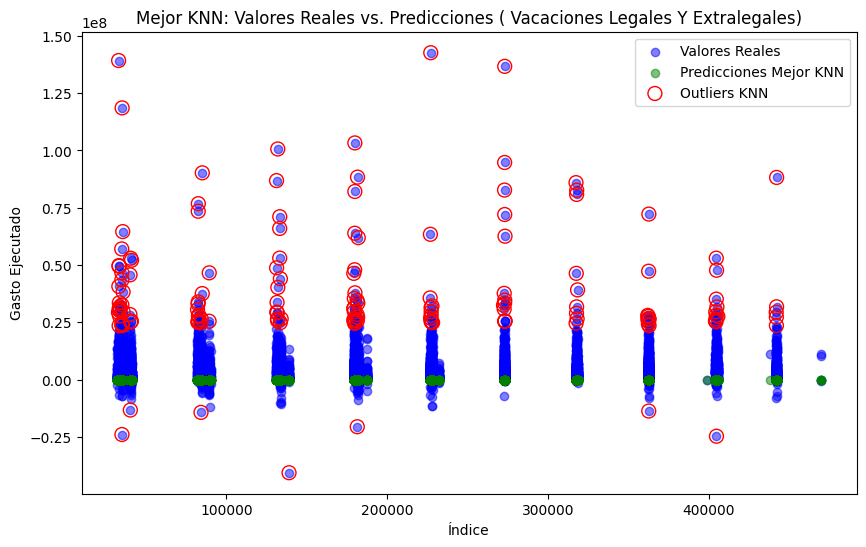

 37%|███▋      | 13/35 [00:30<00:27,  1.25s/it]

Procesando  Prima Legal Y Extralegal


Mejor KNN - MSE: 0.0011634842349695946, MAE: 0.015805370656244128
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 127


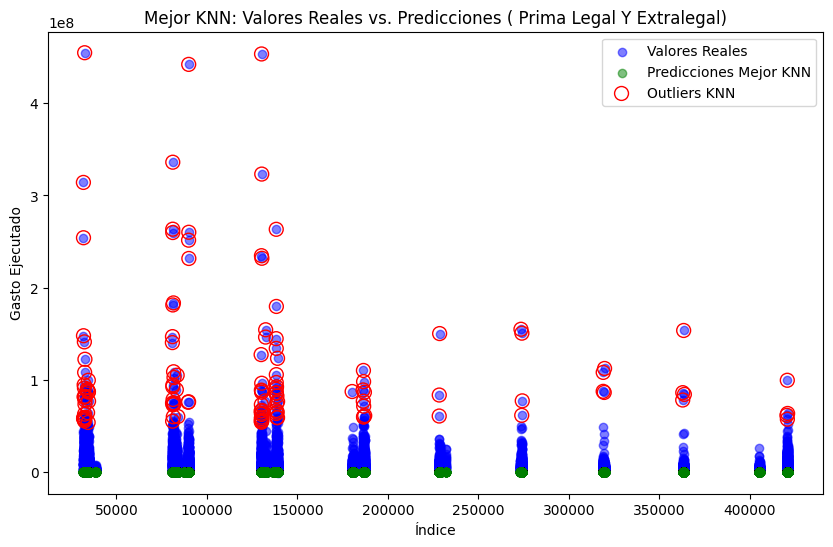

 40%|████      | 14/35 [00:30<00:22,  1.07s/it]

Procesando  Bonificaciones
Mejor KNN - MSE: 0.00020314796959056814, MAE: 0.0005196991412621923
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 4


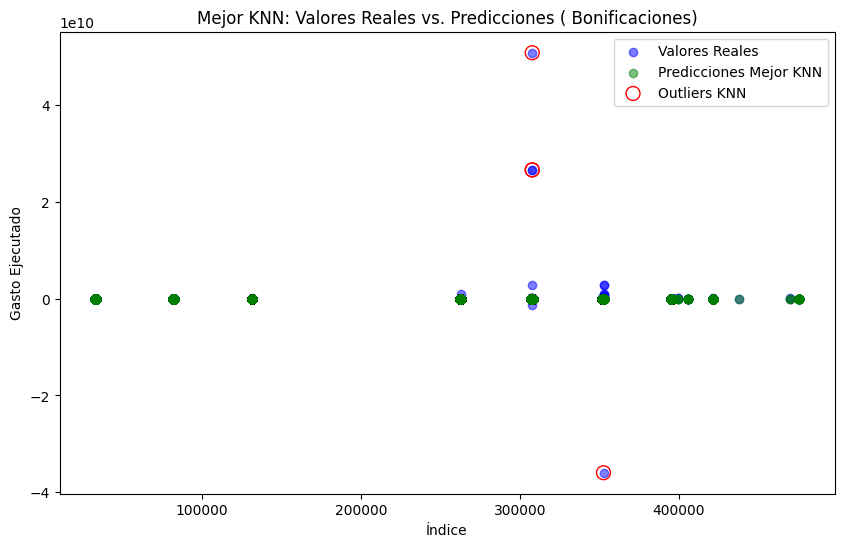

 43%|████▎     | 15/35 [00:30<00:16,  1.22it/s]

Procesando Cuentas_menos_100_reg
Mejor KNN - MSE: 0.0075639676469391, MAE: 0.026683372727588694
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 3


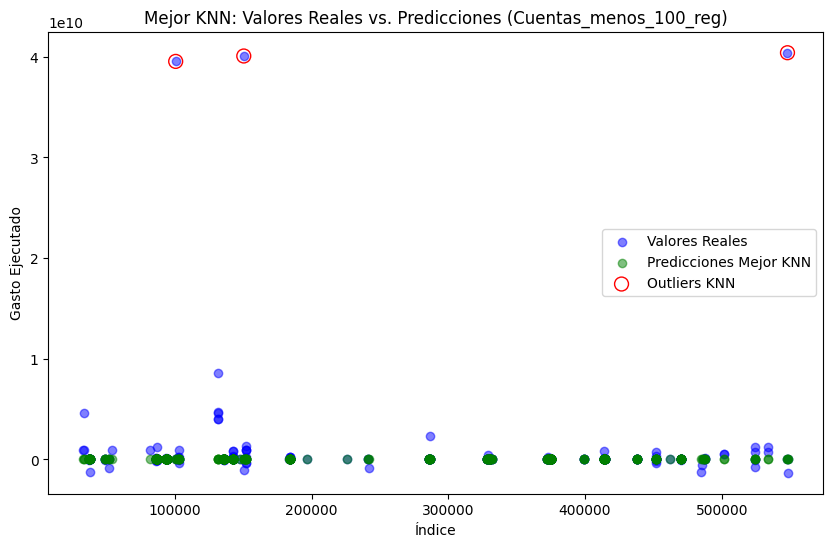

 46%|████▌     | 16/35 [00:31<00:11,  1.65it/s]

Procesando  Riesgo Operativo
Mejor KNN - MSE: 0.00197320158948742, MAE: 0.0076631443992813755
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 12


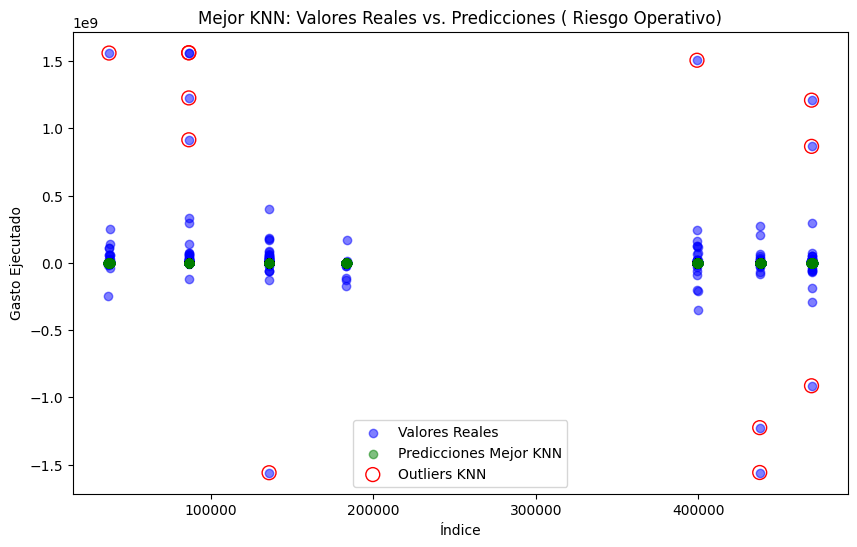

 49%|████▊     | 17/35 [00:31<00:08,  2.10it/s]

Procesando Licencias De Software
Mejor KNN - MSE: 0.24026979095471493, MAE: 0.4855009458820219
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 261


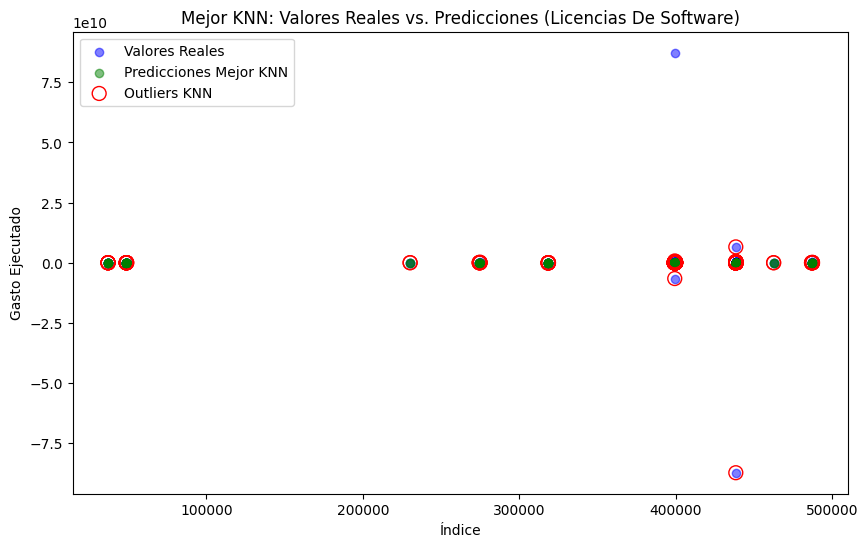

 51%|█████▏    | 18/35 [00:31<00:06,  2.63it/s]

Procesando  Gastos Legales
Mejor KNN - MSE: 0.013003369474168401, MAE: 0.04037674315924327
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 4


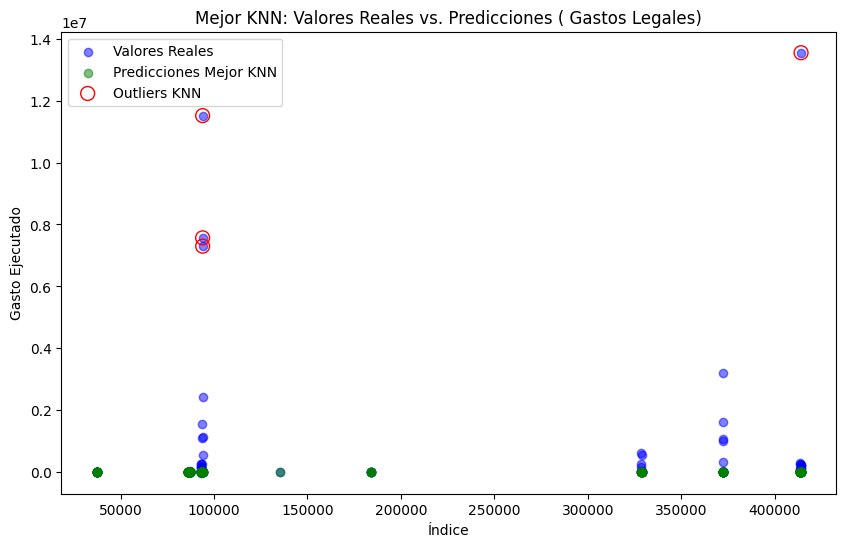

 54%|█████▍    | 19/35 [00:31<00:04,  3.29it/s]

Procesando  Depreciación Y Amortización
Mejor KNN - MSE: 0.002945765504480774, MAE: 0.012526609084438617
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 6


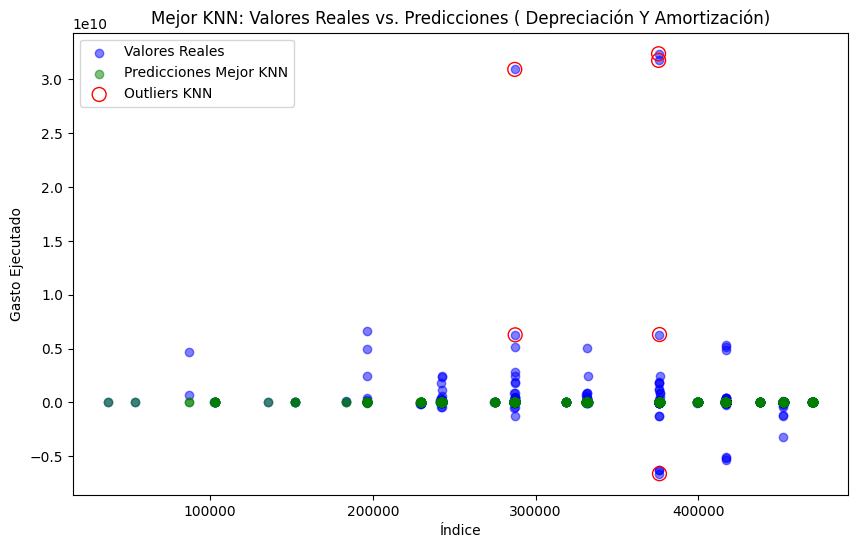

 57%|█████▋    | 20/35 [00:31<00:03,  3.83it/s]

Procesando  Publicidad
Mejor KNN - MSE: 0.005751755773707815, MAE: 0.06366181293160922
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 20


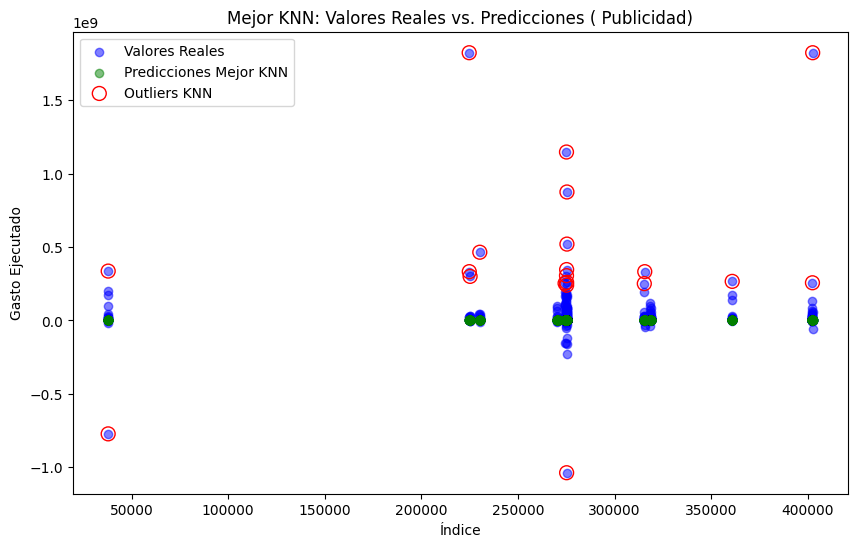

 60%|██████    | 21/35 [00:31<00:03,  4.52it/s]

Procesando  Cesantias E Intereses A Las Cesantías


Mejor KNN - MSE: 0.00032918343860767273, MAE: 0.007876934250260396
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 92


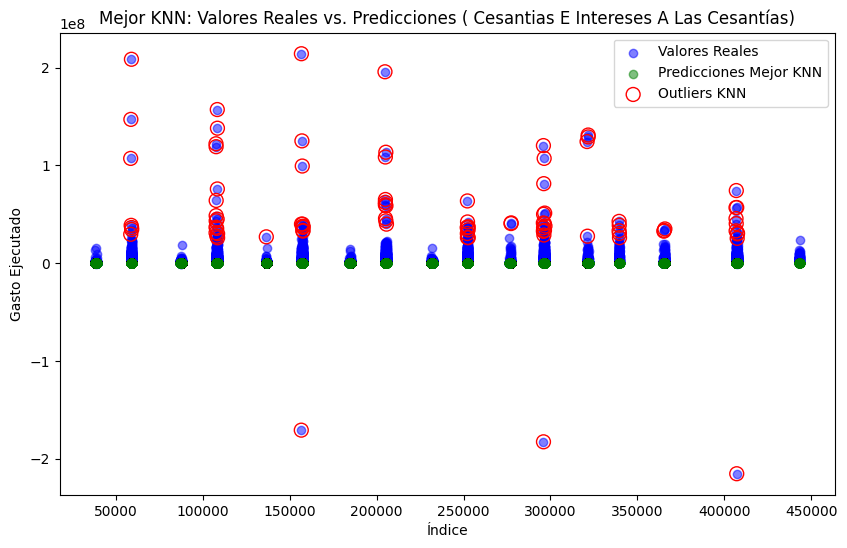

 63%|██████▎   | 22/35 [00:32<00:04,  2.85it/s]

Procesando  Asesoría Jurídica
Mejor KNN - MSE: 0.0034665758356188163, MAE: 0.024151068713592624
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 9


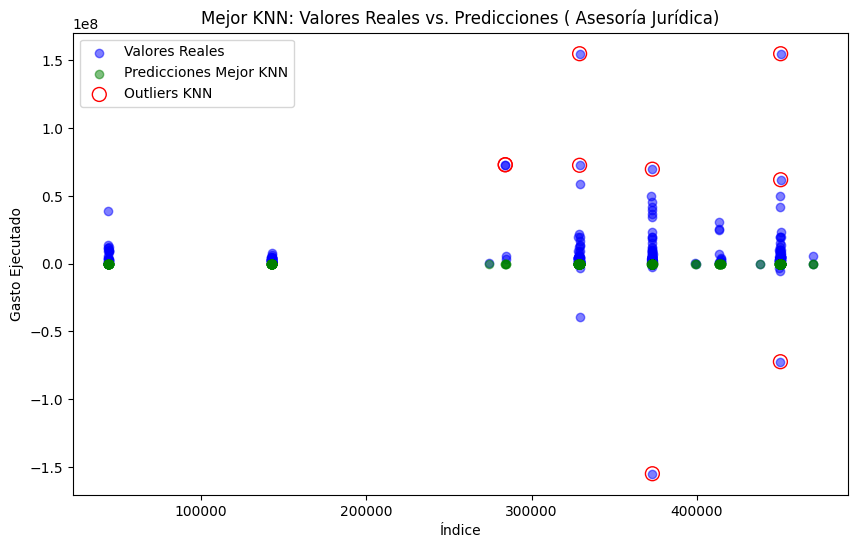

 66%|██████▌   | 23/35 [00:32<00:03,  3.56it/s]

Procesando Honorarios Otros
Mejor KNN - MSE: 0.03175083412414828, MAE: 0.1779160041215695
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 4058


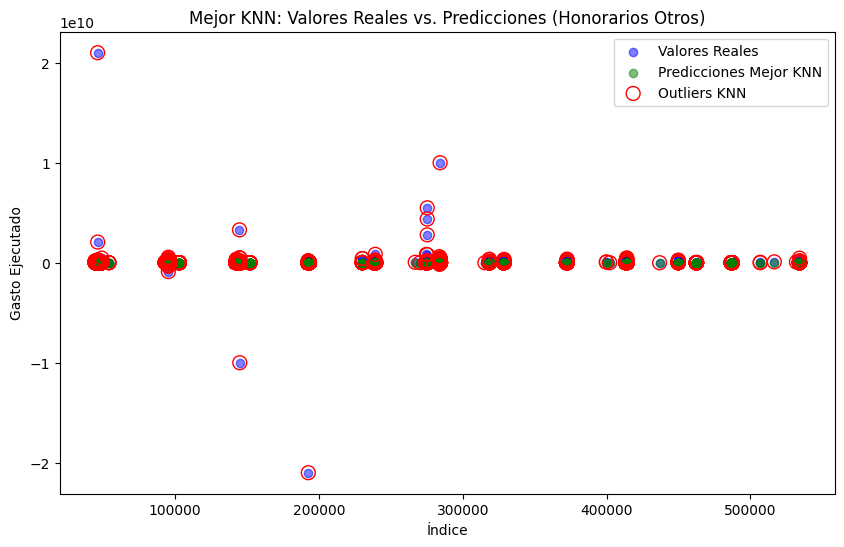

 69%|██████▊   | 24/35 [00:32<00:03,  3.61it/s]

Procesando Honorarios Riesgo Operativo
Mejor KNN - MSE: 0.009385068627813816, MAE: 0.03946220894973979
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 5


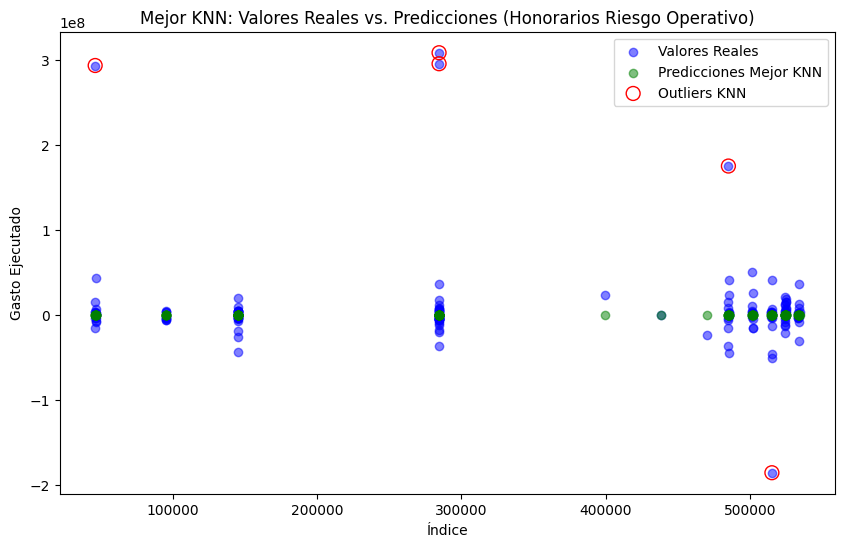

 71%|███████▏  | 25/35 [00:32<00:02,  4.27it/s]

Procesando  Servicios Publicos
Mejor KNN - MSE: 0.0009816887727181795, MAE: 0.006872596400383927
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 23


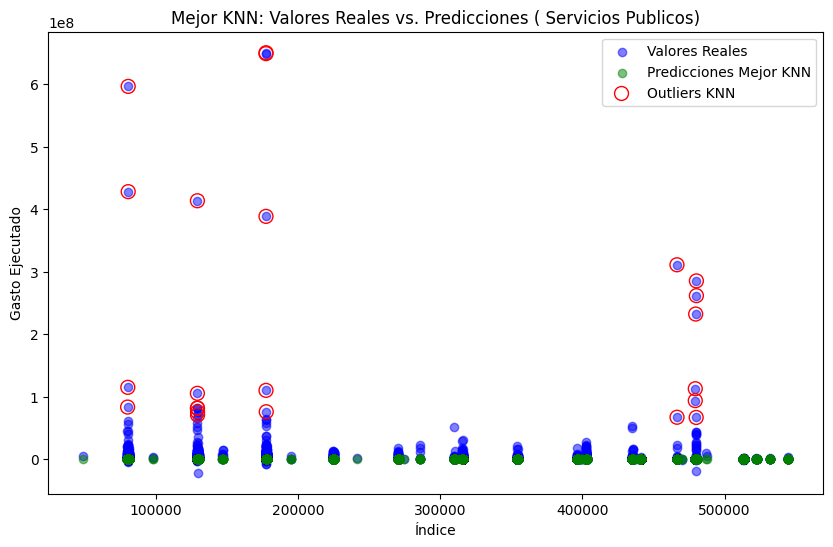

 74%|███████▍  | 26/35 [00:33<00:02,  4.42it/s]

Procesando  Contribuciones Y Afiliaciones
Mejor KNN - MSE: 0.004877781741185338, MAE: 0.013332104608123226
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 4


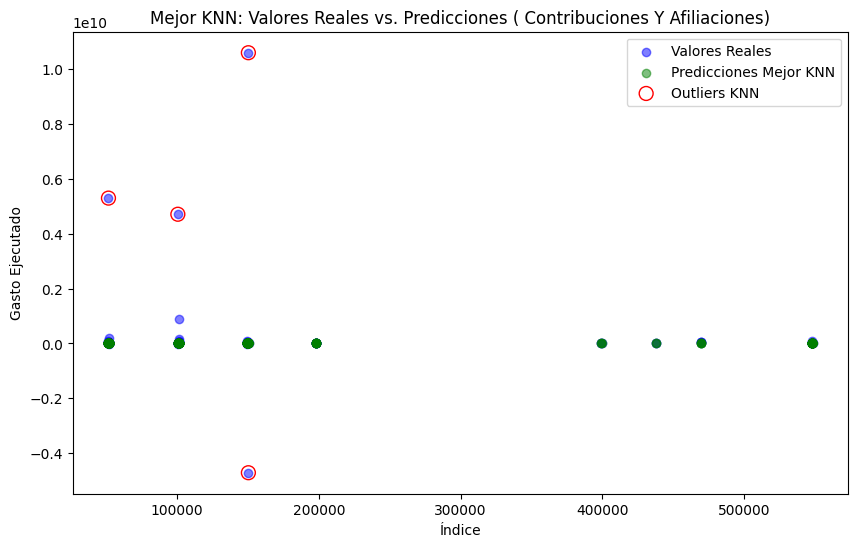

 77%|███████▋  | 27/35 [00:33<00:01,  4.99it/s]

Procesando  Garantías
Mejor KNN - MSE: 0.0007918499754672915, MAE: 0.005613481834064354
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 38


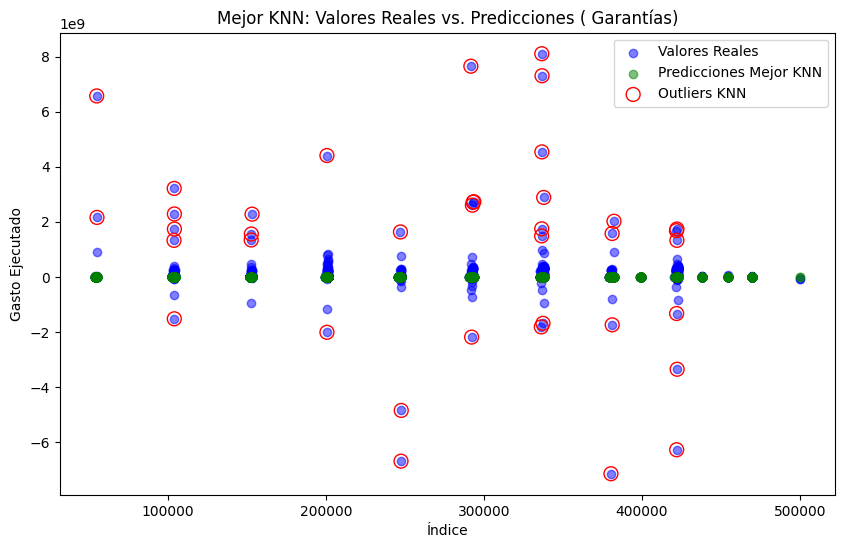

 80%|████████  | 28/35 [00:33<00:01,  4.97it/s]

Procesando  Actividades Fiduciarias
Mejor KNN - MSE: 0.004435718836782197, MAE: 0.02572736531056446
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 5


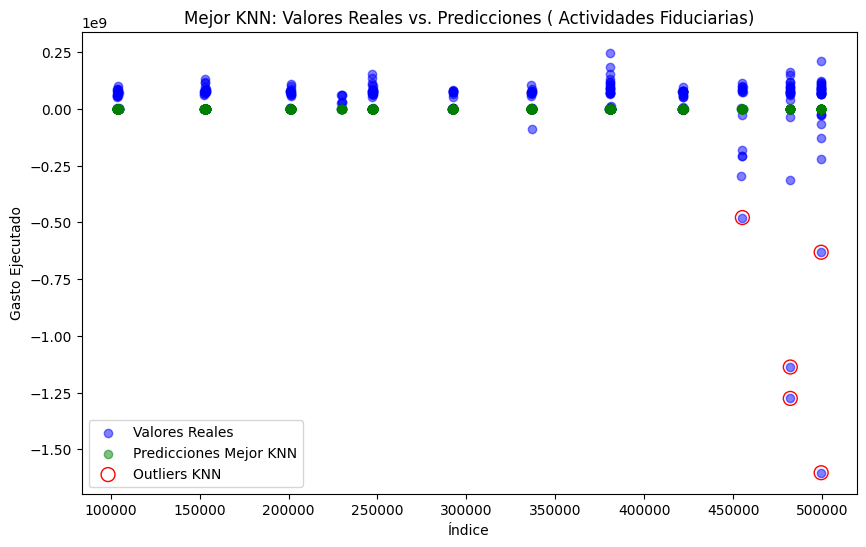

 83%|████████▎ | 29/35 [00:33<00:01,  5.53it/s]

Procesando  Gastos De Viaje
Mejor KNN - MSE: 0.004538615770767096, MAE: 0.0625186000666292
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 28


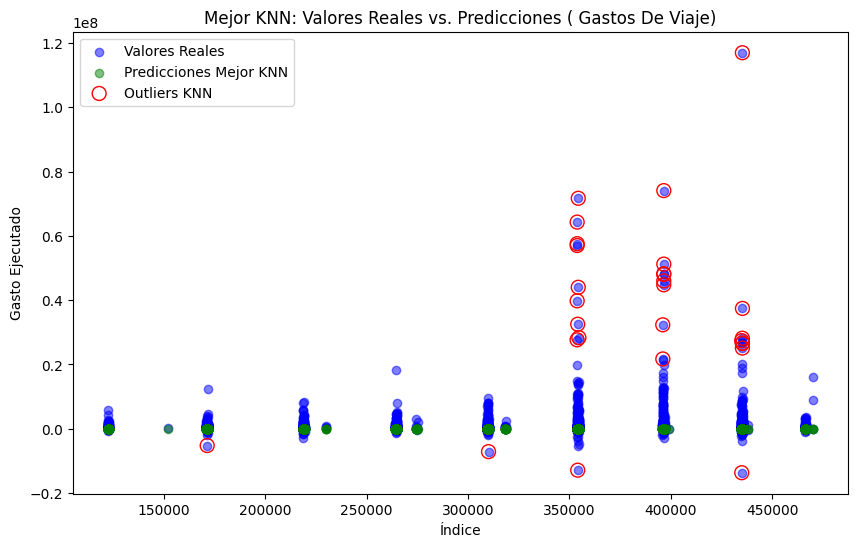

 86%|████████▌ | 30/35 [00:33<00:00,  5.21it/s]

Procesando  Servicios Temporales
Mejor KNN - MSE: 0.005116386045115485, MAE: 0.03225986864512038
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 17


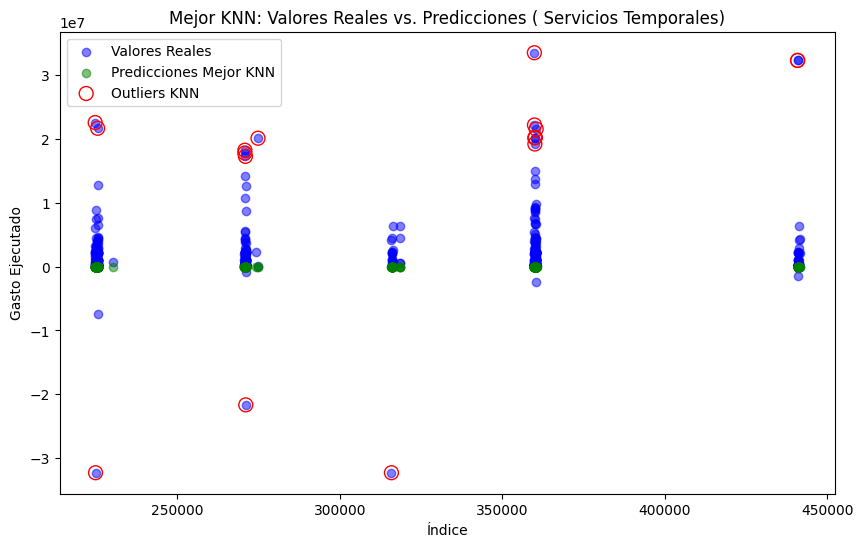

 89%|████████▊ | 31/35 [00:33<00:00,  5.67it/s]

Procesando  Indeminizaciones
Mejor KNN - MSE: 0.02251442192009468, MAE: 0.1145894685367584
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 2


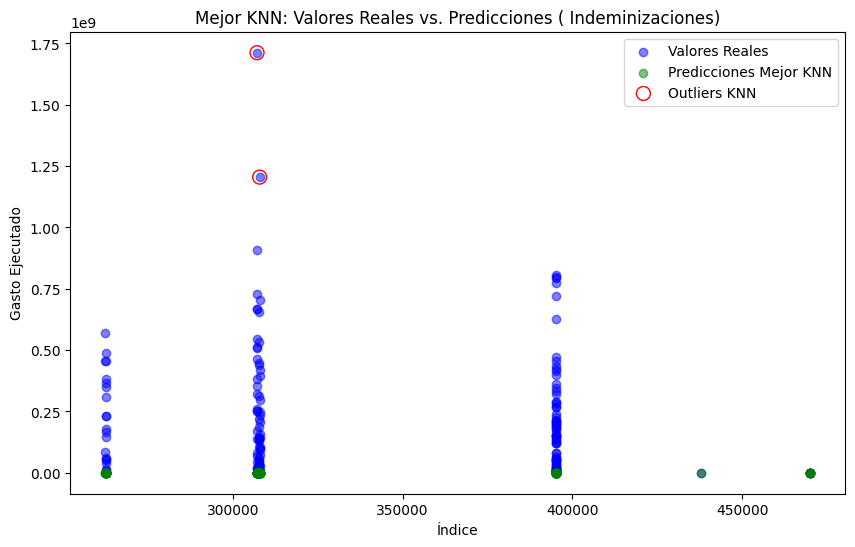

 91%|█████████▏| 32/35 [00:34<00:00,  6.21it/s]

Procesando  Procesamiento De Datos
Mejor KNN - MSE: 0.0011030427358456225, MAE: 0.0027362309689114715
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 2


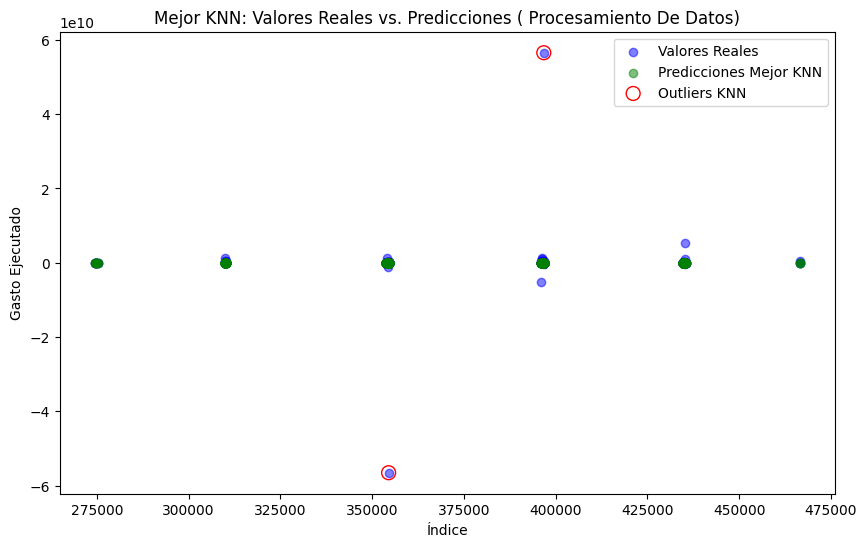

 94%|█████████▍| 33/35 [00:34<00:00,  6.61it/s]

Procesando  Gastos De Representación
Mejor KNN - MSE: 0.04050924997752512, MAE: 0.10731471079510589
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 1


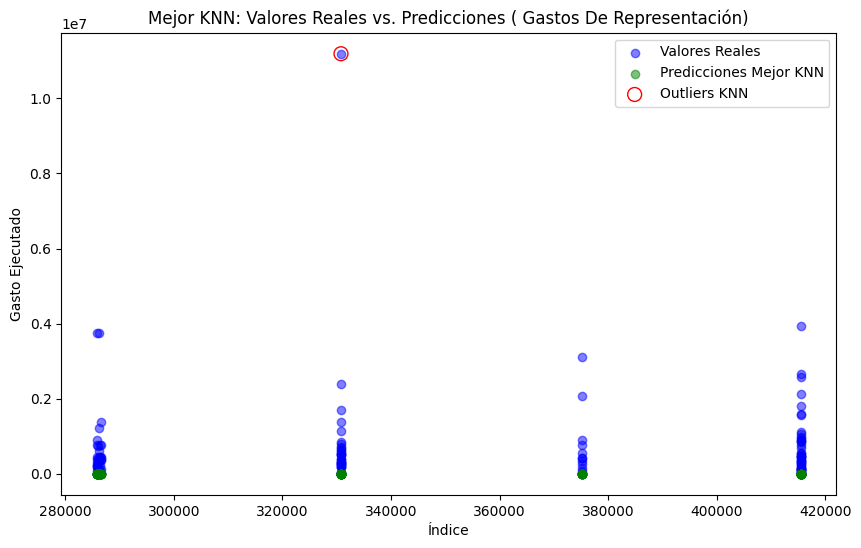

 97%|█████████▋| 34/35 [00:34<00:00,  5.69it/s]

Procesando  Daños  Y Riesgos Operacionales
Mejor KNN - MSE: 0.0006700209924396998, MAE: 0.004514330936438458
El MSE del modelo KNN es menor que la varianza de la variable objetivo, lo que sugiere que el modelo podría estar capturando parte de la variabilidad inherente en los datos.
Outliers detectados por KNN: 15


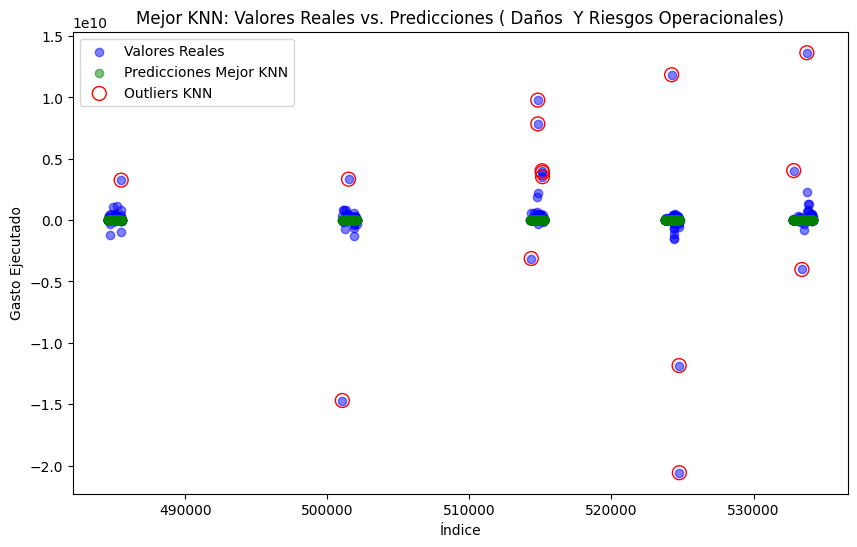

100%|██████████| 35/35 [00:34<00:00,  5.57it/s]

100%|██████████| 35/35 [00:34<00:00,  1.01it/s]

In [31]:
# DataFrames finales separados para regresión lineal y KNN
final_data_sin_outliers_knn = pd.DataFrame()
final_data_outliers_knn = pd.DataFrame()

# Procesar cada DataFrame
cantidad_outliers_knn = 0
for value, df_value in tqdm(dataframes.items()):
    num_outliers_knn = process_dataframe_completo(df_value, value, best_knn_cuenta)
    cantidad_outliers_knn = cantidad_outliers_knn + num_outliers_knn
    
# Guardar los DataFrames finales en CSV
final_data_sin_outliers_knn.to_csv('final_data_sin_outliers.csv', index=True)
final_data_outliers_knn.to_csv('final_data_outliers.csv', index=True)

In [32]:
print('Cantidad de Outliers detectados con KNN para el total de la base de datos')
print(cantidad_outliers_knn)
print(f'El porcentaje de Outliers sobre el total del data set es: {round(cantidad_outliers_knn/len(df)*100,2)} % ')
len(df)

Cantidad de Outliers detectados con KNN para el total de la base de datos
35717
El porcentaje de Outliers sobre el total del data set es: 7.23 % 


494106